In [1]:
import xarray as xr
import xesmf as xe
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import dask

In [2]:
from eofs.xarray import Eof

In [3]:
#import dask to parallelise
from dask.distributed import Client, LocalCluster
cluster = LocalCluster()
client = Client(cluster)

2023-03-23 10:30:03,319 - distributed.diskutils - INFO - Found stale lock file and directory '/local/e14/sm2435/tmp/dask-worker-space/worker-02flsz_8', purging
2023-03-23 10:30:03,320 - distributed.diskutils - INFO - Found stale lock file and directory '/local/e14/sm2435/tmp/dask-worker-space/worker-6135tc0l', purging
2023-03-23 10:30:03,320 - distributed.diskutils - INFO - Found stale lock file and directory '/local/e14/sm2435/tmp/dask-worker-space/worker-uzvr9je0', purging
2023-03-23 10:30:03,321 - distributed.diskutils - INFO - Found stale lock file and directory '/local/e14/sm2435/tmp/dask-worker-space/worker-47qg57c5', purging


In [4]:
print(client)

<Client: 'tcp://127.0.0.1:36663' processes=4 threads=8, memory=22.46 GiB>


In [5]:
#make fucntion to regrid the data

In [6]:
po_pace_sst = xr.open_dataset("/g/data/e14/sm2435/PO_model_clim/sst.nc", chunks = {"time":12})

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.01/lib/python3.9/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.01/lib/python3.9/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(array[self.key], dtype=None)


In [7]:
ctrl_sst = xr.open_dataset("/g/data/e14/sm2435/PO_model_clim/ctrl_sst.nc", chunks = {'time':12})

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.01/lib/python3.9/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.01/lib/python3.9/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(array[self.key], dtype=None)


In [8]:
#select 955-1100

In [9]:
po_pace_sst = po_pace_sst.sel(time = slice('0955-01-16','1100-12-16' ))

In [10]:
ctrl_sst = ctrl_sst.sel(time = slice('0955-01-16','1100-12-16' ))

In [11]:
def regrid_ACCESS(ds):
    #rename coords
    ds = ds.rename({"geolon_t": "longitude", "geolat_t": "latitude"})
    #create the output grid
    ds_out = xe.util.grid_global(1, 1)
    ds_out = ds_out.drop({'lon_b', 'lat_b'})
    #rename grid coords
    ds_out = ds_out.rename({'lon': 'longitude', 'lat': 'latitude'})
    #drop the coords on input ds
    ds_in_1deg = ds.drop({'xt_ocean', 'yt_ocean'})
    #create regridder
    regridder_1deg = xe.Regridder(ds_in_1deg, ds_out, 'bilinear', periodic=True)
    #now regrid
    regridded = regridder_1deg(ds['sst'].chunk({'xt_ocean': -1, 'yt_ocean': -1}))
    regridded = regridded.assign_coords({'x': ds_out.longitude[0, :], 'y': ds_out.latitude[:, 0]})
    regridded = regridded.rename({'x': 'longitude', 'y': 'latitude'})
    return regridded

In [12]:
def regrid_CMIP(ds):
    #rename coords
    #ds = ds.rename({"lon": "longitude", "lat": "latitude"})
    #create the output grid
    ds_out = xe.util.grid_global(1, 1)
    ds_out = ds_out.drop({'lon_b', 'lat_b'})
    #rename grid coords
    ds_out = ds_out.rename({'lon': 'longitude', 'lat': 'latitude'})
    #drop the coords on input ds
    ds_in_1deg = ds.drop({'j', 'i'})
    #create regridder
    regridder_1deg = xe.Regridder(ds_in_1deg, ds_out, 'bilinear', periodic=True)
    #now regrid
    regridded = regridder_1deg(ds['tos'].chunk({'i': -1, 'j': -1}))
    regridded = regridded.assign_coords({'x': ds_out.longitude[0, :], 'y': ds_out.latitude[:, 0]})
    regridded = regridded.rename({'x': 'longitude', 'y': 'latitude'})
    return regridded

In [13]:
%%time
PO_PACE = regrid_ACCESS(po_pace_sst)

CPU times: user 19.7 s, sys: 3.5 s, total: 23.2 s
Wall time: 28.8 s


In [14]:
%%time
PO_PACE = PO_PACE.compute()

CPU times: user 7.4 s, sys: 2.34 s, total: 9.74 s
Wall time: 55.4 s


In [15]:
%%time
ctrl = regrid_ACCESS(ctrl_sst)

CPU times: user 12.4 s, sys: 208 ms, total: 12.6 s
Wall time: 11.6 s


In [16]:
%%time
ctrl = ctrl.compute()

CPU times: user 8.39 s, sys: 1.93 s, total: 10.3 s
Wall time: 1min 5s


In [17]:
#now write a fucntion to output bias and to optioanlly plot
def sst_bias(model, obs, freq=None, plot=None, temp_scale = 2):
    """
    Lorem ipsum dolor sit amet, consetetur sadipscing elitr,
    sed diam nonumy eirmod tempor invidunt ut labore et dolore magna aliquyam
    
    Parameters
    ----------
    model : argument of type int
        DataArray of model run 
    obs : argument of type int
        Lorem ipsum dolor sit amet
    freq : {‘monthly’, ‘annual’}, optional
        if None default to 'monthly'
    plot : True or False
        if true, plot is made, if false then no
    temp_scale : 2 (optional)
        set to 2 automatically, sets vmin vmax

    """
    #check frequency of sampling, defaukt to monthly if not specified
    if freq == None:
        freq = 'monthly'
    if plot == None:
        plot = False
    #calculate the bias
    if freq == "monthly":
        bias = (model.groupby('time.month').mean('time') - obs.groupby('time.month').mean('time'))
        if plot == True:
            fg = bias.plot.contourf(col='month', col_wrap = 4,  transform=ccrs.PlateCarree(),
                                 subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180)}, 
                                  figsize=(20,8), facecolor = 'white', vmin = -1*temp_scale, vmax = temp_scale, levels =10, extend = 'both',  cmap = 'RdBu_r',
                                    cbar_kwargs=dict(label='Bias ($^\\circ$C)'))
            for i, ax in enumerate(fg.axes.flat):
                ax.coastlines()
                #ax.set_facecolor('grey')
                gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                                  linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
                if i in [0,1,2,3,4,5,6,7]:
                    gl.bottom_labels = False
                if i in [1,2,3,5,6,7,9,10,11]:
                    gl.left_labels = False
                gl.top_labels = False
                gl.right_labels = False               
            #now add the month labels\n",
            titles =['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun','Jul',
                     'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
            for ax,title in zip(fg.axes.flatten(),titles):
                ax.set_title(title )
            return
        elif plot == False:
            return bias
    elif freq == "annual":
        bias = (model.mean('time') - obs.mean('time'))
        if plot == True:
            plt.figure(figsize = (12,8))
            ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))
            bias.plot.contourf(ax=ax, vmin = -1*temp_scale, vmax = temp_scale, cmap = "RdBu_r", levels = 10, extend = 'both',
                   transform=ccrs.PlateCarree(), cbar_kwargs=dict(label='Bias ($^\\circ$C)'))
            ax.set_title('Annual mean SST bias')
            ax.coastlines(color = 'k')
            ax.gridlines()
            #ax.set_facecolor('grey')
            gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                                  linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
            gl.top_labels = False
            gl.right_labels = False
            return 
        elif plot == False:
            return bias

Text(0.5, 1.0, 'difference in SST PACE - CTRL')

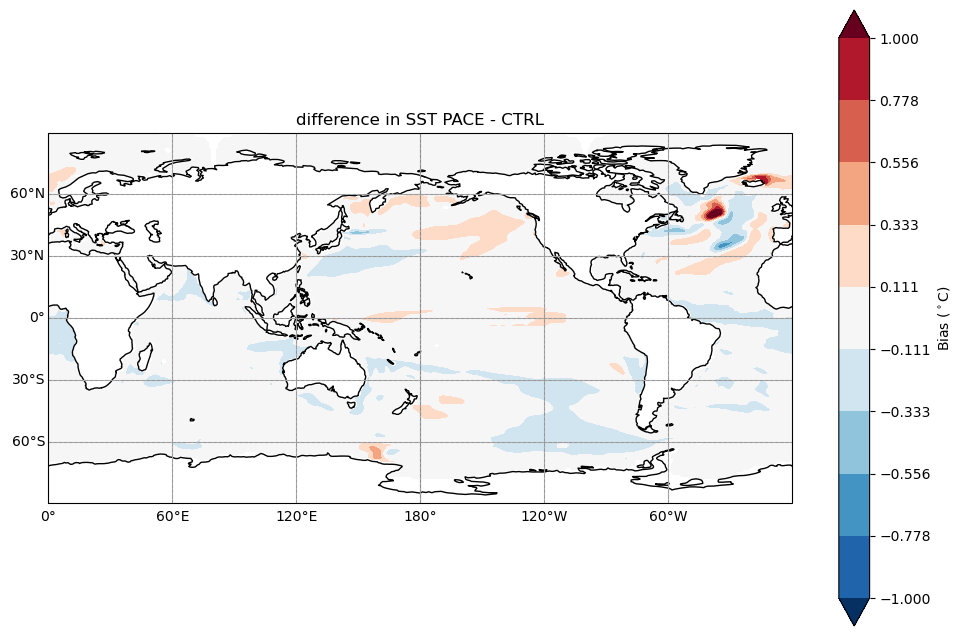

In [18]:
sst_bias(PO_PACE, ctrl,  "annual", plot=True, temp_scale=1)
plt.title("difference in SST PACE - CTRL")

In [19]:
#load observational SST
OBS = xr.open_dataset("/g/data/e14/sm2435/ACCESS_PIctrl/oisstv2.nc", chunks = {'time':12}).sst
#rename coords
OBS = OBS.rename({"lon": "longitude", "lat": "latitude"})
OBS = OBS.compute()

In [20]:
#load the lsm
lsm = xr.open_dataset("/g/data/e14/sm2435/ACCESS_PIctrl/oisstv2_lsm.nc").mask
#rename coords
lsm = lsm.rename({"lon": "longitude", "lat": "latitude"})


In [21]:
OBS = OBS.where(lsm[0]==1)

In [22]:
ctrl.coords

Coordinates:
  * time       (time) object 0955-01-16 12:00:00 ... 1100-12-15 12:00:00
  * longitude  (longitude) float64 -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * latitude   (latitude) float64 -89.5 -88.5 -87.5 -86.5 ... 87.5 88.5 89.5

In [23]:
from scipy.stats import ttest_ind, ttest_1samp

In [24]:
t, p = ttest_ind(PO_PACE, ctrl, axis = 0)

In [25]:
def convert_to_da(arr):
    arr_xr = xr.DataArray(arr, 
                    coords={'latitude': ctrl.latitude, 'longitude': ctrl.longitude}, 
                    dims=["latitude", "longitude"])
    return arr_xr

In [26]:
t_xr = xr.DataArray(t, 
                    coords={'latitude': ctrl.latitude, 'longitude': ctrl.longitude}, 
                    dims=["latitude", "longitude"])

In [27]:
p_xr = xr.DataArray(p, 
                    coords={'latitude': ctrl.latitude, 'longitude': ctrl.longitude}, 
                    dims=["latitude", "longitude"])

In [28]:
PACE_BIAS = (PO_PACE.groupby('time.month') - ctrl.groupby('time.month').mean('time')).drop('month')

In [29]:
pop_mean = xr.zeros_like(ctrl.groupby('time.month').mean('time'))

In [30]:
pop_mean[0].drop('month')

<xarray.DataArray (latitude: 180, longitude: 360)>
array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)
Coordinates:
  * longitude  (longitude) float64 -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * latitude   (latitude) float64 -89.5 -88.5 -87.5 -86.5 ... 87.5 88.5 89.5
Attributes:
    regrid_method:  bilinear

In [31]:
t1, p1 = ttest_1samp(PACE_BIAS, pop_mean[0].drop('month'), axis = 0)

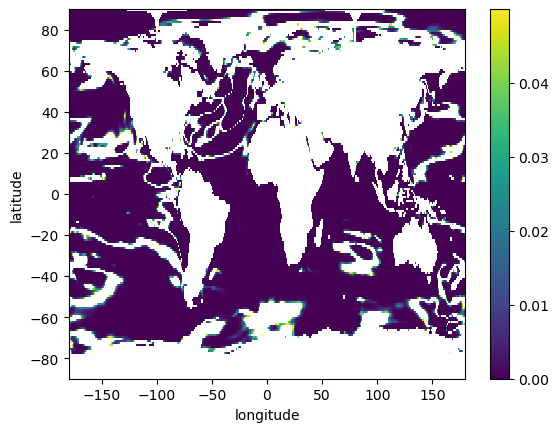

In [32]:
convert_to_da(p1).where(p1<0.05).plot()

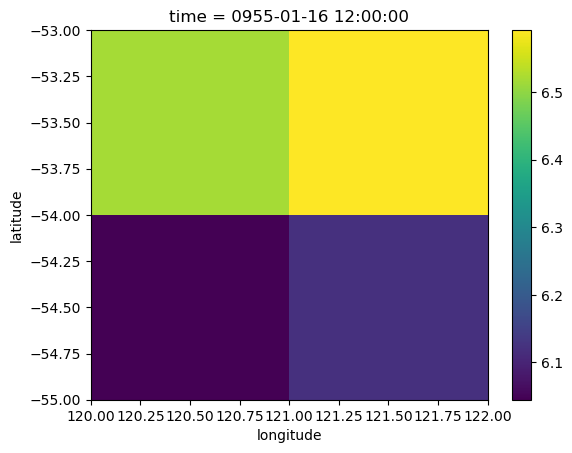

In [48]:
ctrl[0].sel(latitude=slice(-55,-53),longitude=slice(120,122)).plot.pcolormesh()

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.01/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'colorbar'
  result = super().contourf(*args, **kwargs)


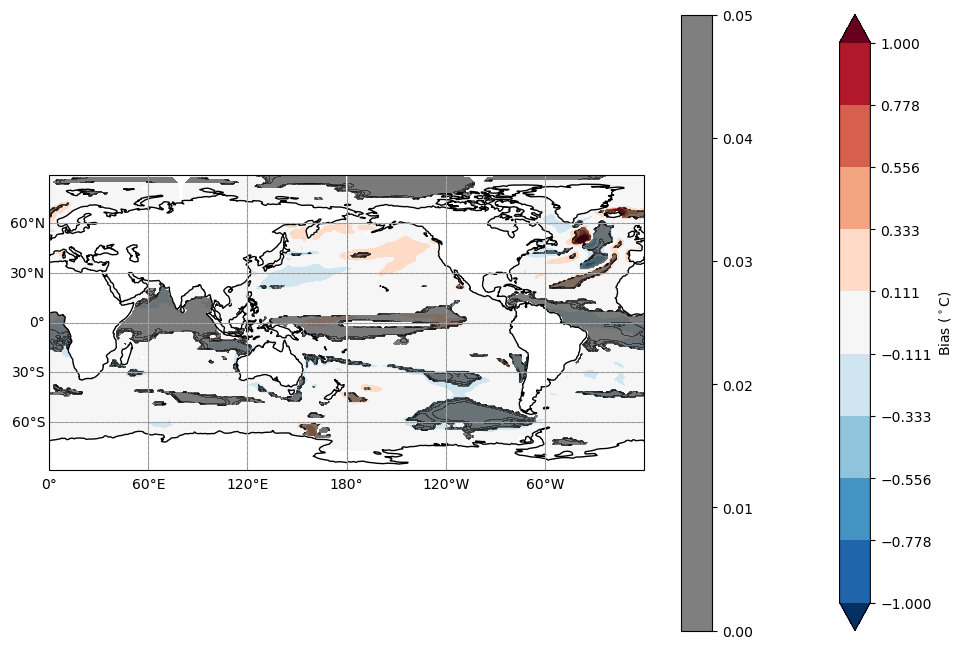

In [50]:
sst_bias(PO_PACE, ctrl,  "annual", plot=True, temp_scale=1)
plt.title("difference in SST PACE - CTRL")
#p_xr.where(p_xr <0.05).where(abs(t_xr)> 1.7).plot.contourf(colors = 'none', hatches = 'x', transform=ccrs.PlateCarree(), colorbar = False)
p_xr.where(p_xr <0.05).where(abs(t_xr)> 1.7).plot.contourf(colors = 'k', transform=ccrs.PlateCarree(), alpha = 0.5, colorbar = False)


(array([ 72., 545., 310., 232., 216., 201., 131.,  30.,  12.,   3.]),
 array([ 3.1643395,  3.8841171,  4.6038947,  5.3236723,  6.04345  ,
         6.7632275,  7.4830046,  8.202783 ,  8.92256  ,  9.642338 ,
        10.362115 ], dtype=float32),
 <BarContainer object of 10 artists>)

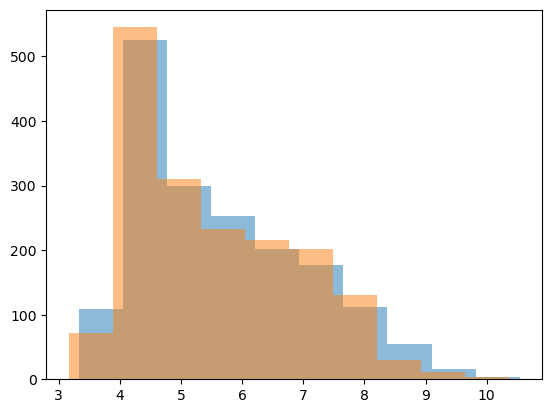

In [49]:
plt.hist(ctrl.sel(latitude=slice(-55,-54),longitude=slice(-121,-120)).values.flatten(), bins = 10, alpha = 0.5)
plt.hist(PO_PACE.sel(latitude=slice(-55,-54),longitude=slice(-121,-120)).values.flatten(),  bins = 10, alpha = 0.5)

In [40]:
ctrl

<xarray.DataArray (time: 1752, latitude: 180, longitude: 360)>
array([[[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [-1.7429664, -1.7431281, -1.7432946, ..., -1.7425147,
         -1.742656 , -1.7428092],
        [-1.7488182, -1.748992 , -1.7491713, ..., -1.748331 ,
         -1.7484877, -1.7486502],
        [-1.7605064, -1.7605767, -1.7606487, ..., -1.7603054,
         -1.7603706, -1.7604376]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
...
        [-1.7518555, -1.7520651, -1.7522756, ..., -1.7512364,
         -1.7514397, -1.751647 ],
        [-1.75326  , -1.7533332, -1.7534052, ..., -1.7530341,
         -1.7531103, -1.7531856],
        [-1.7501931, -1.7501729, -1.7501515, ..., -1.7502476,
         -1.7502304, -1.7502123]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [-1.7556448, -1.7557697, -1.7558988, ..., -1.7552806,
         -1.7554058, -1.7555234],
        [-1.75733  , -1.7574054, -1.75748  , ..., -1.7570995,
         -1.7571769, -1.7572538],
        [-1.7553203, -1.7552983, -1.7552754, ..., -1.7553804,
         -1.7553613, -1.7553413]]], dtype=float32)
Coordinates:
  * time       (time) object 0955-01-16 12:00:00 ... 1100-12-15 12:00:00
  * longitude  (longitude) float64 -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * latitude   (latitude) float64 -89.5 -88.5 -87.5 -86.5 ... 87.5 88.5 89.5
Attributes:
    regrid_method:  bilinear

In [32]:
mean_diff_obs = (ctrl.mean(dim='time') - PO_PACE.mean(dim='time')).values

# Set the number of bootstraps to perform
n_bootstraps = 1000

# Create an empty array to store the bootstrap means
bootstrap_means = np.zeros(n_bootstraps)

# Perform the bootstraps
for i in range(n_bootstraps):
    # Resample the data with replacement
    resampled_var1 = np.random.choice(ctrl.values, size=len(ctrl.values), replace=True)
    resampled_var2 = np.random.choice(PO_PACE.values, size=len(PO_PACE.values), replace=True)
    # Calculate the mean difference of the resampled data
    bootstrap_means[i] = (resampled_var1.mean(dim='time') - resampled_var2.mean(dim='time')).values

# Calculate the standard error of the bootstrap means
se_bootstrap_means = np.std(bootstrap_means)

# Calculate the 95% confidence interval for the mean difference
conf_int = np.percentile(bootstrap_means, [2.5, 97.5])

# Print the results
print("Observed Mean Difference:", mean_diff_obs)
print("Standard Error of the Bootstrap Means:", se_bootstrap_means)
print("95% Confidence Interval for the Mean Difference:", conf_int)

ValueError: a must be 1-dimensional

In [41]:
to_be_resampled = ctrl.values
smp = np.random.choice(to_be_resampled, len(to_be_resampled))
smp_initialized = initialized.sel({resample_dim: smp})

ValueError: a must be 1-dimensional

In [36]:
from scipy.stats import bootstrap

In [89]:
arr = PO_PACE[:,80,30].values

In [88]:
PO_PACE[:,80,30]

<xarray.DataArray (time: 1752)>
array([29.046333, 29.105217, 29.166319, ..., 28.058786, 28.456104,
       28.726267], dtype=float32)
Coordinates:
  * time       (time) object 0955-01-16 12:00:00 ... 1100-12-14 12:00:00
    longitude  float64 -149.5
    latitude   float64 -9.5
Attributes:
    regrid_method:  bilinear

In [80]:
rng = np.random.default_rng()
from scipy.stats import norm

dist = norm(loc=2, scale=4)  # our "unknown" distribution

data = dist.rvs(size=100, random_state=rng)


In [84]:
(data,)

(array([ 5.19797202,  1.90072428,  3.56690508,  3.46938485,  5.90980344,
        -2.46704514,  3.87103559,  3.50955335,  4.52479333,  5.17185333,
         4.50637607,  3.21422059,  0.69438973, -2.64132753,  9.70094482,
        -0.37899562,  1.76741674,  1.99273549,  1.51364003, -3.14802915,
         0.45437614,  0.77612658, -1.12789264, -2.98766707,  1.75866271,
         0.46208249, -1.23962958,  3.98370707,  7.64256369,  4.62031401,
         3.02185578, -1.14733327, -1.81159797,  3.55921708, -1.4999276 ,
        10.53119497,  0.37695419, 11.02112987,  1.22915145,  3.50757329,
        -1.79543497,  1.58958285,  4.08440356, -8.13097586,  3.96269145,
         4.61396664,  5.1179096 ,  6.57974791,  6.7417509 , 10.07083369,
         4.9770816 , -8.19804587,  3.74117503, -0.06992986,  4.05143953,
         9.07420883,  3.36529041, -4.84144254, -6.7771919 ,  0.7031836 ,
        -4.42853562,  0.70984503,  6.55411802,  6.19213747,  4.43076322,
         2.96466295, -0.14845739,  2.15615407, -4.0

In [96]:
np.apply_along_axis(bootstrap, axis = 0, PO_PACE, np.mean)

SyntaxError: positional argument follows keyword argument (1559342453.py, line 1)

In [90]:
res = bootstrap((arr,), np.mean, confidence_level=0.95,

                random_state=rng)

(array([ 12.,  23.,  81., 129.,  90.,  76.,  38.,  39.,  59.,  64.,  73.,
         41.,  26.,  38.,  51.,  69., 104.,  89., 115., 129., 122., 125.,
        109.,  35.,  15.]),
 array([27.314667, 27.400305, 27.485943, 27.57158 , 27.657219, 27.742857,
        27.828495, 27.914133, 27.999771, 28.08541 , 28.171047, 28.256685,
        28.342323, 28.427961, 28.5136  , 28.599237, 28.684875, 28.770514,
        28.856152, 28.94179 , 29.027428, 29.113066, 29.198704, 29.284342,
        29.36998 , 29.455618], dtype=float32),
 <BarContainer object of 25 artists>)

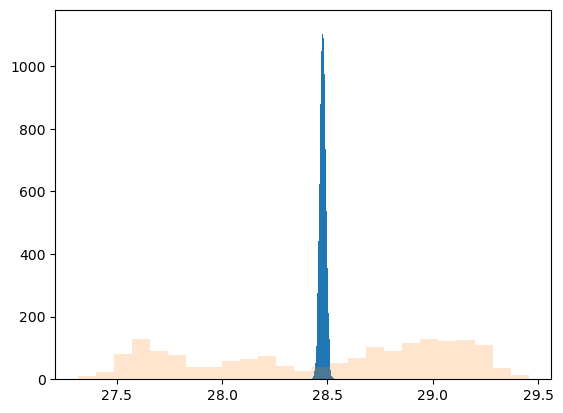

In [92]:
fig, ax = plt.subplots()

ax.hist(res.bootstrap_distribution, bins=25)
ax.hist(arr, bins = 25, alpha = 0.2)

(array([1.4685059e+07, 2.6661140e+06, 2.8871530e+06, 2.8846840e+06,
        2.8105470e+06, 2.6386530e+06, 2.4655150e+06, 2.3952190e+06,
        2.3808490e+06, 2.5397470e+06, 2.6786490e+06, 2.8986530e+06,
        3.1655500e+06, 3.6627080e+06, 4.7770130e+06, 7.2656170e+06,
        7.5323280e+06, 1.2641330e+06, 4.4149000e+04, 5.7000000e+03]),
 array([-1.9186745 , -0.07848625,  1.761702  ,  3.60189   ,  5.4420786 ,
         7.2822666 ,  9.122455  , 10.962643  , 12.802832  , 14.64302   ,
        16.483208  , 18.323397  , 20.163584  , 22.003773  , 23.84396   ,
        25.684149  , 27.524338  , 29.364525  , 31.204714  , 33.044903  ,
        34.88509   ], dtype=float32),
 <BarContainer object of 20 artists>)

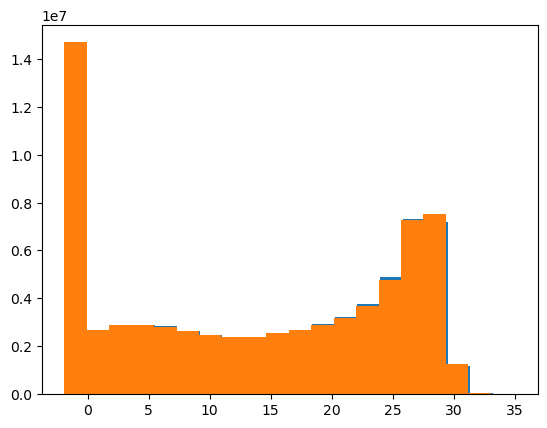

In [49]:
plt.hist(ctrl.values.flatten(), bins = 20)
plt.hist(PO_PACE.values.flatten(), bins = 20)

In [32]:
ctrl.shape

(1752, 180, 360)

In [68]:
p1 = np.where(p, p<0.05, np.nan)

In [71]:
p1

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]])

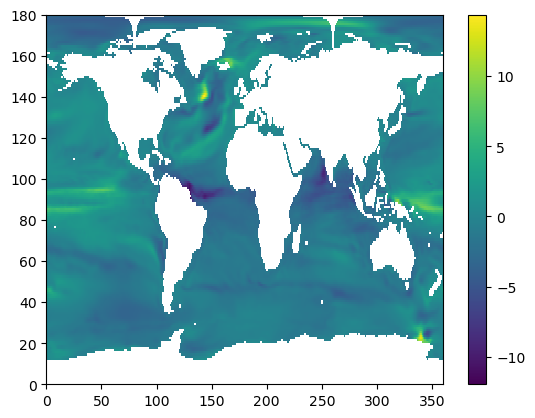

In [74]:
plt.pcolormesh(t)
plt.colorbar()

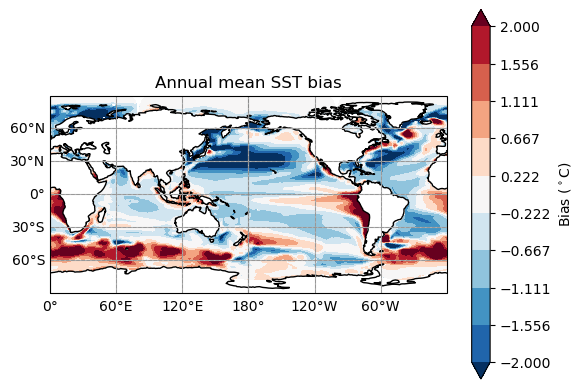

In [21]:
sst_bias(PO_PACE, OBS, "annual", plot=True)

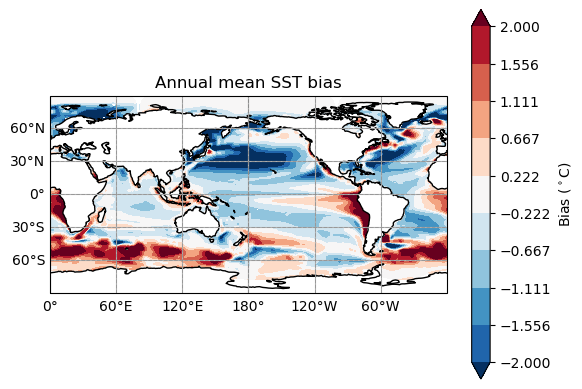

In [22]:
sst_bias(ctrl, OBS, "annual", plot=True)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.01/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_2903322/3973267564.py:34: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):
/local/e14/sm2435/tmp/ipykernel_2903322/3973267564.py:48: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for ax,title in zip(fg.axes.flatten(),titles):


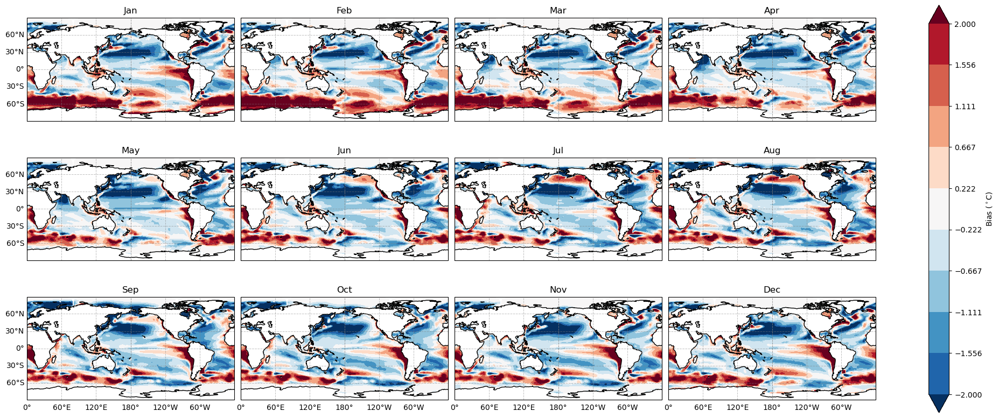

In [51]:
sst_bias(PO_PACE, OBS, plot=True)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.01/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_2903322/3973267564.py:34: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):
/local/e14/sm2435/tmp/ipykernel_2903322/3973267564.py:48: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for ax,title in zip(fg.axes.flatten(),titles):


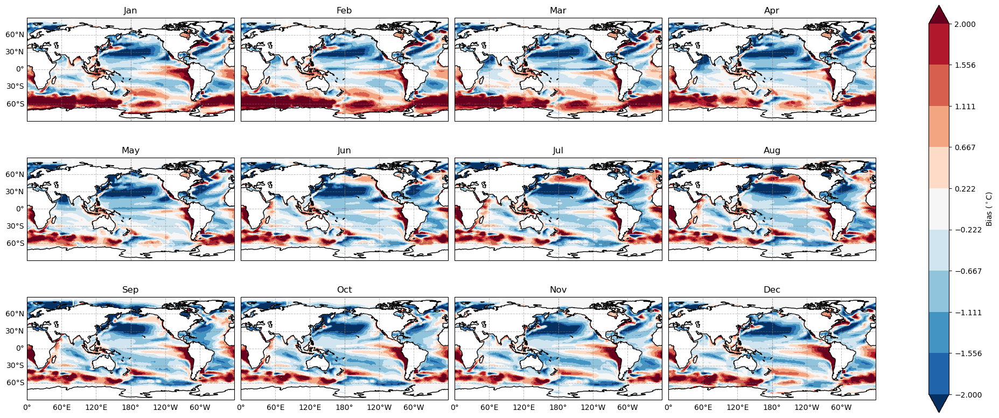

In [52]:
sst_bias(ctrl, OBS, plot=True)

In [ ]:
#EOF fucntions

In [53]:
#fucntion for EOF analysis
def eof_region(ds, lat, lat1, lon, lon1, neof = 4):
    #convert ds to be from -180-180 to 0-360
    ds = ds.assign_coords(longitude=(ds.longitude % 360)).roll(longitude=180, roll_coords=True)
    #get the SSTA of the ds, and drop th emonth dimension so the eof solver can work
    ds = (ds.groupby('time.month') - ds.groupby('time.month').mean('time')).drop('month')
    #now get the domain we want
    ds = ds.sel(latitude = slice(lat,lat1), longitude = slice(lon,lon1))
    # Create an EOF solver to do the EOF analysis. Square-root of cosine of
    # latitude weights are applied before the computation of EOFs.
    coslat = np.cos(np.deg2rad(ds.coords['latitude'].values))
    wgts = np.sqrt(coslat)[..., np.newaxis]
    solver = Eof(ds, weights=wgts)
    # Retrieve the leading EOF, expressed as the correlation between the leading
    # PC time series and the input SST anomalies at each grid point, and the
    # leading PC time series itself.
    eof4 = solver.eofsAsCorrelation(neofs=neof)
    pc4 = solver.pcs(npcs=neof, pcscaling=1)
    var = solver.varianceFraction()
    return eof4, pc4, var

In [54]:
def plot_eof(ds, lat, lat1, lon, lon1):
    e, p, var = eof_region(ds, lat, lat1, lon ,lon1)
    fg = e.plot.contourf(col = 'mode', col_wrap = 2, transform=ccrs.PlateCarree(), 
                                 subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180)}, 
                                  levels = 11, facecolor = 'white')
    for i, ax in enumerate(fg.axes.flat):
        ax.set_title("Mode "+str(i+1)+"\n Variance explained: "+f'{var[i].values*100:.2f}'+"%", fontsize = 12)
        ax.coastlines()
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                          linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
        if i in [0,1]:
            gl.bottom_labels = False
        if i in [1,3]:
            gl.left_labels = False
        gl.top_labels = False
        gl.right_labels = False
    return

In [55]:
def get_son(ds):
    return ds.sel(time=ds['time.month'].isin([9, 10, 11]))

In [56]:
def get_djf_mn(ds):
    djf = ds.resample(time="QS-DEC").mean()
    djf = djf.sel(time=djf['time.season']=='DJF')
    return djf

In [57]:
def get_djf(ds):
    djf = ds.sel(time=ds['time.season']=='DJF')
    return djf

In [58]:
def get_mam(ds):
    return ds.sel(time=ds['time.month'].isin([3,4,5]))

In [59]:
def get_mam_mn(ds):
    mam = ds.resample(time="QS-MAR").mean()
    mam = mam.sel(time=mam['time.season']=='MAM')
    return mam
    #return ds.sel(time=ds['time.month'].isin([3,4,5]))

In [60]:
def get_jja(ds):
    return ds.sel(time=ds['time.month'].isin([6,7,8]))

In [61]:
def plot_latlon(ds1, ds2, lat, lon):
    if lon < 0:
        lon = 360+lon
    ds1 = ds1.sel(latitude = lat, longitude = lon, method = 'nearest')
    ds2 = ds2.sel(latitude = lat, longitude = lon, method = 'nearest')
    #make figure:
    fig,axes  = plt.subplots(1,1,figsize = (16, 4),sharex=True, sharey=True)

    ds1.sel(time = slice('0951-01-16','1104-01-16' )).groupby('time.year').mean('time').plot(ax = axes, c = 'tab:blue', label = 'Pace')
    ds2.sel(time = slice('0951-01-16','1104-01-16' )).groupby('time.year').mean('time').plot(ax = axes,c = 'tab:orange', label = 'ctrl')
    axes.legend()
    #axes[0].plot(ds1.sel(time = slice('0951-01-16','1104-01-16' )))
    #axes[1].plot(ds2.sel(time = slice('0951-01-16','1104-01-16' )))
    return fig

In [62]:
#get an index to calcualte the IOB
def ssta(DS):
    clim = DS.groupby('time.month').mean('time')
    ssta = DS.groupby('time.month') - clim
    return ssta
def NINO34(DS):
     return ssta(DS).sel(latitude=slice(-5, 5),longitude=slice(-170, -120)).mean(['latitude', 'longitude'])
     
def IOBM(DS):
    return ssta(DS).sel(latitude=slice(-20, 20),longitude=slice(40, 100)).mean(['latitude', 'longitude'])
def NINO34(DS):
    return ssta(DS).sel(latitude=slice(-5, 5),longitude=slice(-170, -120)).mean(['latitude', 'longitude'])
#calculate the DMI
def dmi(DS):
    WTIO = ssta(DS).sel(latitude=slice(-10, 10),longitude=slice(50, 70)).mean(['latitude', 'longitude'])
    SETIO = ssta(DS).sel(latitude=slice(-10, 0),longitude=slice(90, 110)).mean(['latitude', 'longitude'])
    return  WTIO-SETIO

In [63]:
get_djf(ctrl)

<xarray.DataArray (time: 438, latitude: 180, longitude: 360)>
array([[[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [-1.7429664, -1.7431281, -1.7432946, ..., -1.7425147,
         -1.742656 , -1.7428092],
        [-1.7488182, -1.748992 , -1.7491713, ..., -1.748331 ,
         -1.7484877, -1.7486502],
        [-1.7605064, -1.7605767, -1.7606487, ..., -1.7603054,
         -1.7603706, -1.7604376]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
...
        [-1.7637209, -1.7636583, -1.7635953, ..., -1.7639042,
         -1.7638445, -1.7637831],
        [-1.7604152, -1.7603962, -1.7603754, ..., -1.7604603,
         -1.7604471, -1.7604321],
        [-1.75482  , -1.7547684, -1.7547151, ..., -1.7549647,
         -1.7549181, -1.7548698]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [-1.7556448, -1.7557697, -1.7558988, ..., -1.7552806,
         -1.7554058, -1.7555234],
        [-1.75733  , -1.7574054, -1.75748  , ..., -1.7570995,
         -1.7571769, -1.7572538],
        [-1.7553203, -1.7552983, -1.7552754, ..., -1.7553804,
         -1.7553613, -1.7553413]]], dtype=float32)
Coordinates:
  * time       (time) object 0955-01-16 12:00:00 ... 1100-12-15 12:00:00
  * longitude  (longitude) float64 -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * latitude   (latitude) float64 -89.5 -88.5 -87.5 -86.5 ... 87.5 88.5 89.5
Attributes:
    regrid_method:  bilinear

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.01/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_415988/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


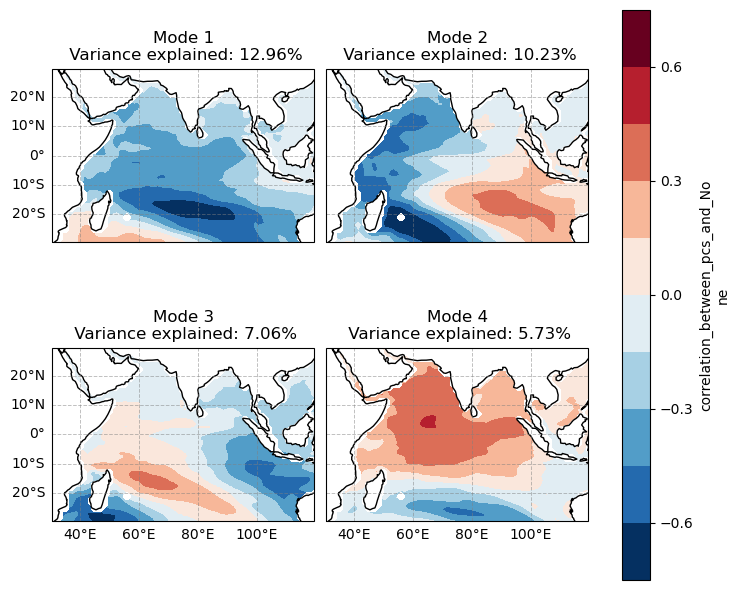

In [38]:
plot_eof((PO_PACE), -30,30,30,120)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_3728953/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


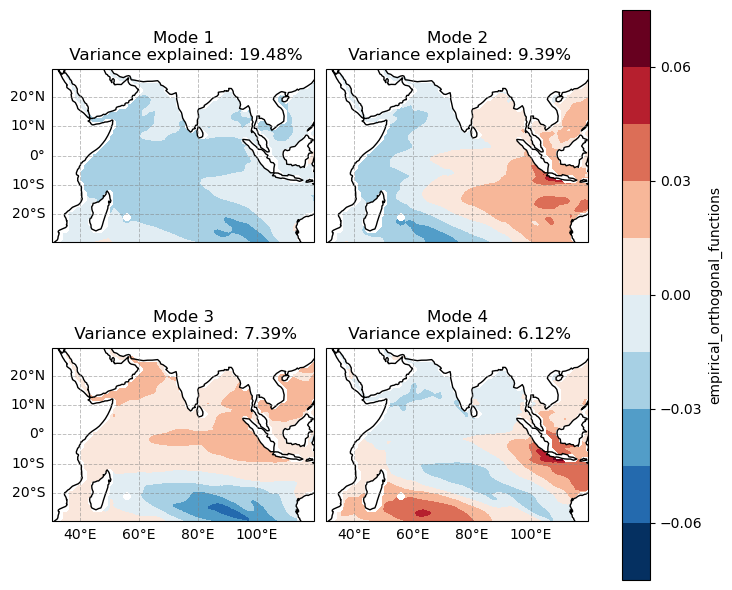

In [151]:
plot_eof((ctrl), -30,30,30,120)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_3728953/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


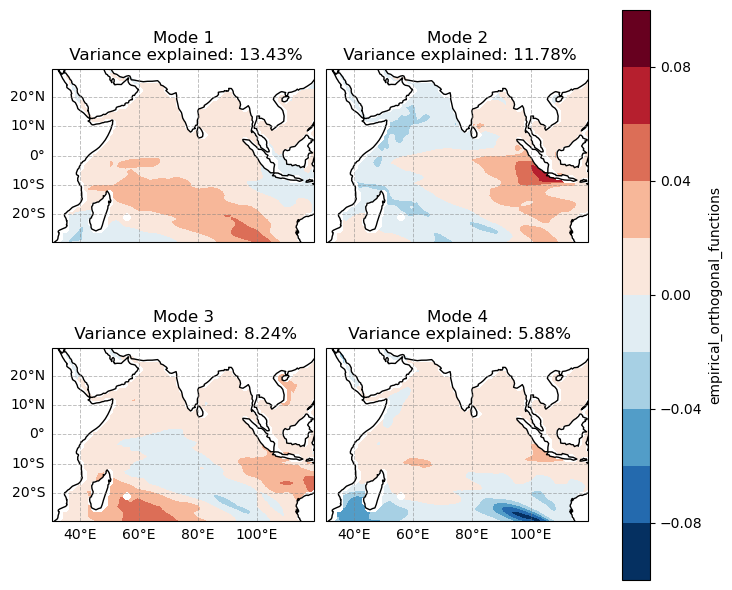

In [152]:
plot_eof(get_son(PO_PACE), -30,30,30,120)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_3728953/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


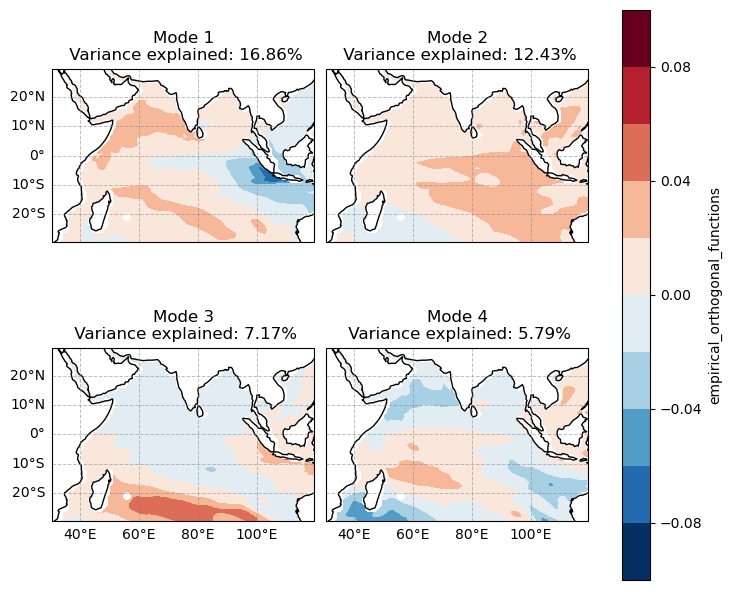

In [153]:
plot_eof(get_son(ctrl), -30,30,30,120)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.01/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_2903322/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


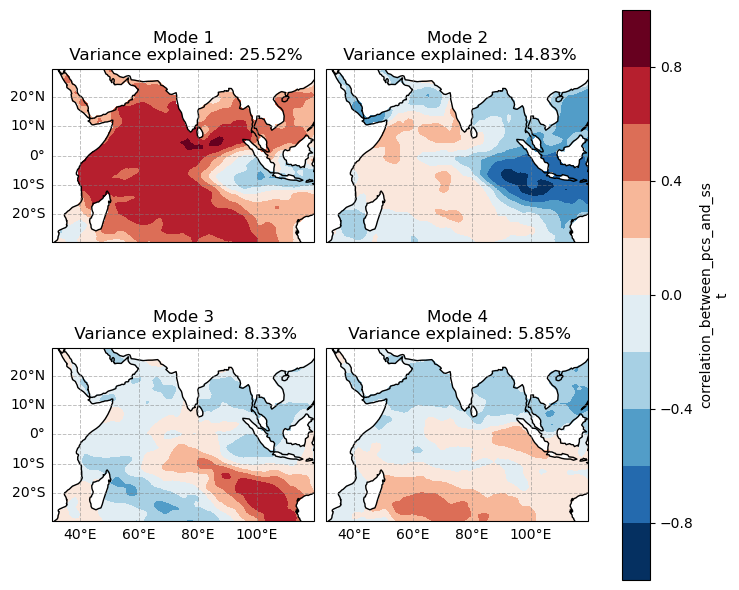

In [64]:
plot_eof(get_son(OBS), -30,30,30,120)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_3699883/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


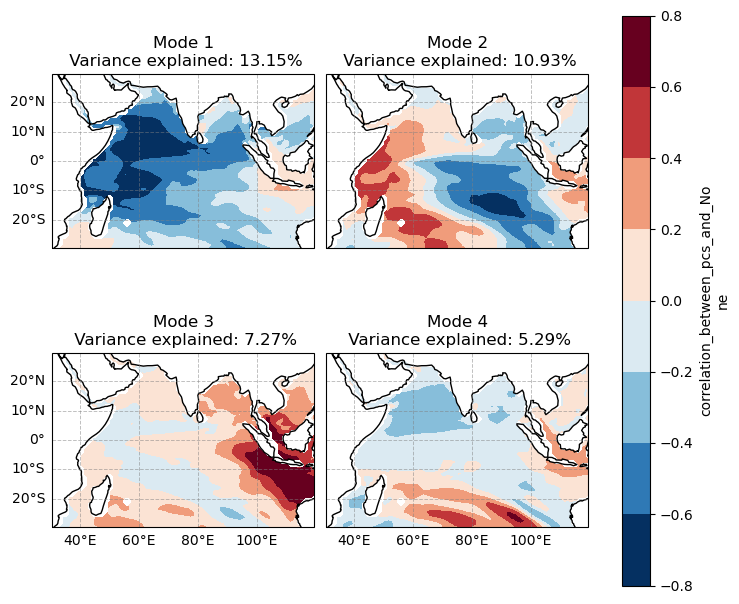

In [34]:
plot_eof(get_jja(PO_PACE), -30,30,30,120)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_3699883/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


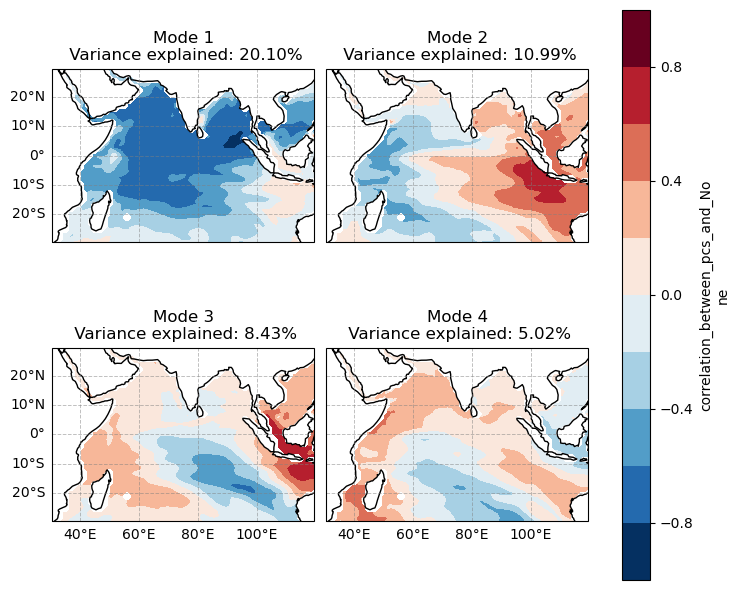

In [35]:
plot_eof(get_jja(ctrl), -30,30,30,120)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.01/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_2903322/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


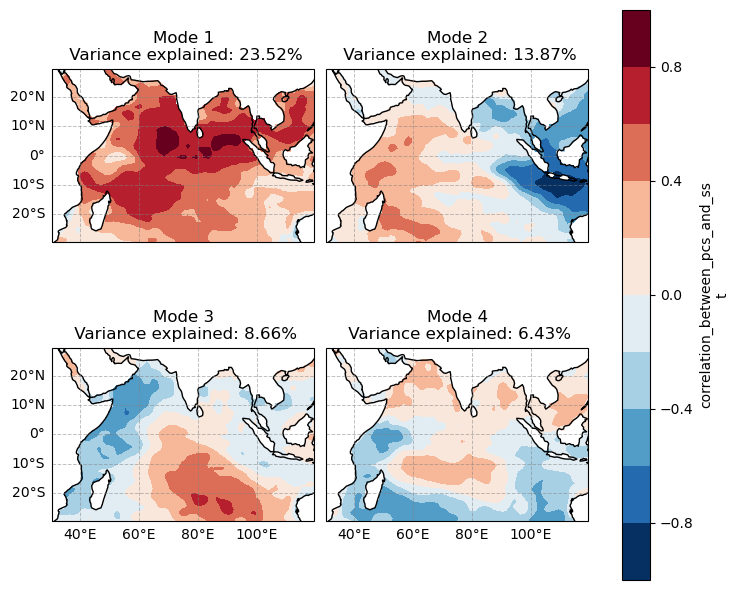

In [65]:
plot_eof(get_jja(OBS), -30,30,30,120)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_3699883/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


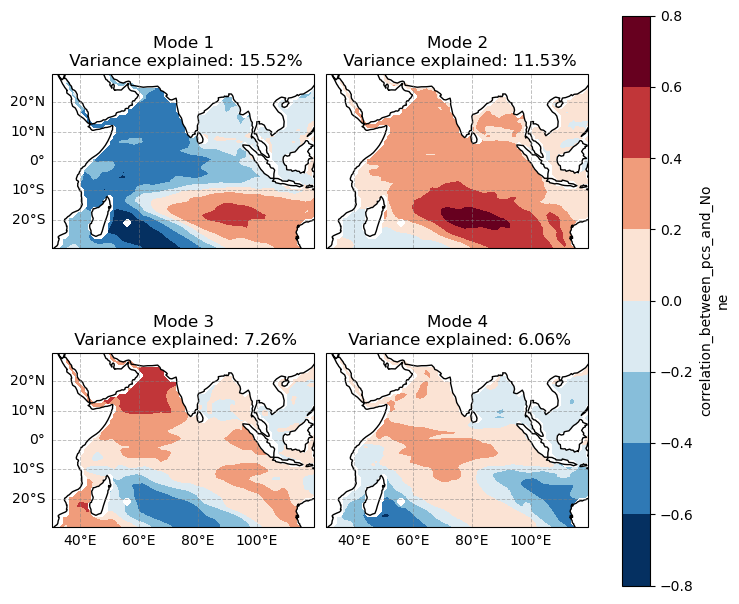

In [37]:
plot_eof(get_mam(PO_PACE), -30,30,30,120)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_3699883/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


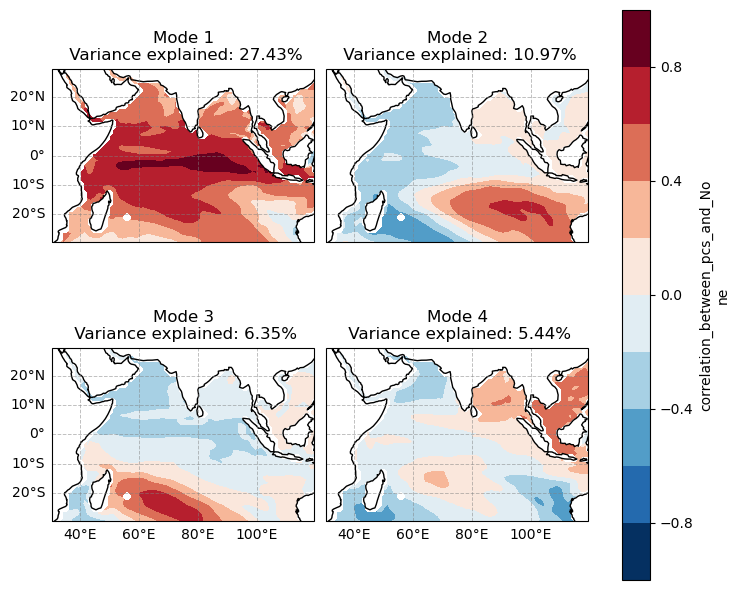

In [38]:
plot_eof(get_mam(ctrl), -30,30,30,120)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.01/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_2903322/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


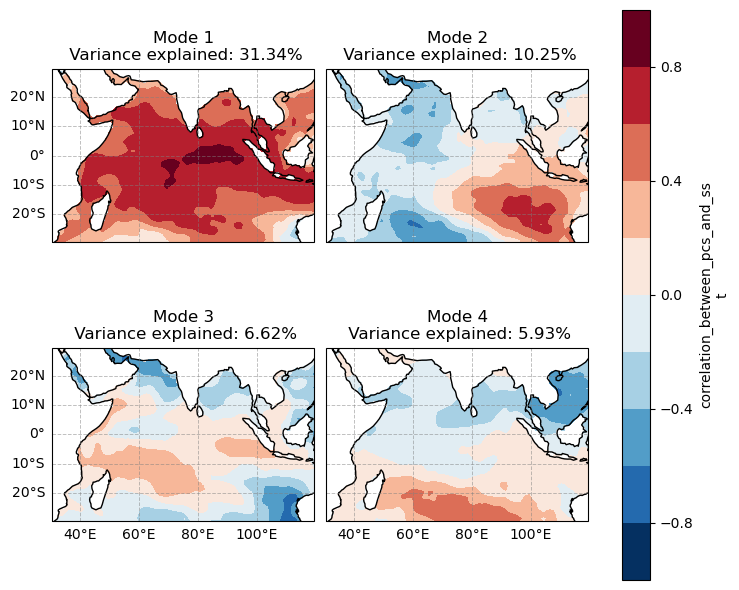

In [66]:
plot_eof(get_mam(OBS), -30,30,30,120)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_3728953/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


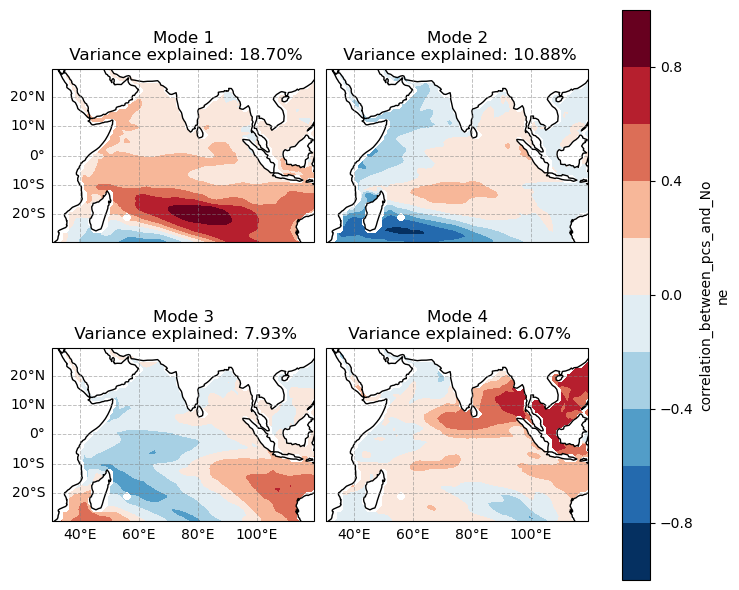

In [37]:
plot_eof(get_djf(PO_PACE), -30,30,30,120)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_3728953/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


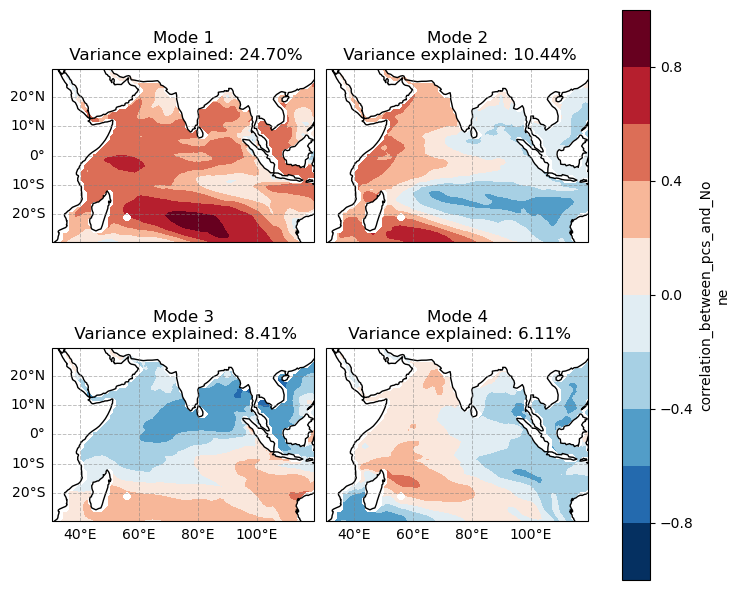

In [38]:
plot_eof(get_djf(ctrl), -30,30,30,120)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.01/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_2903322/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


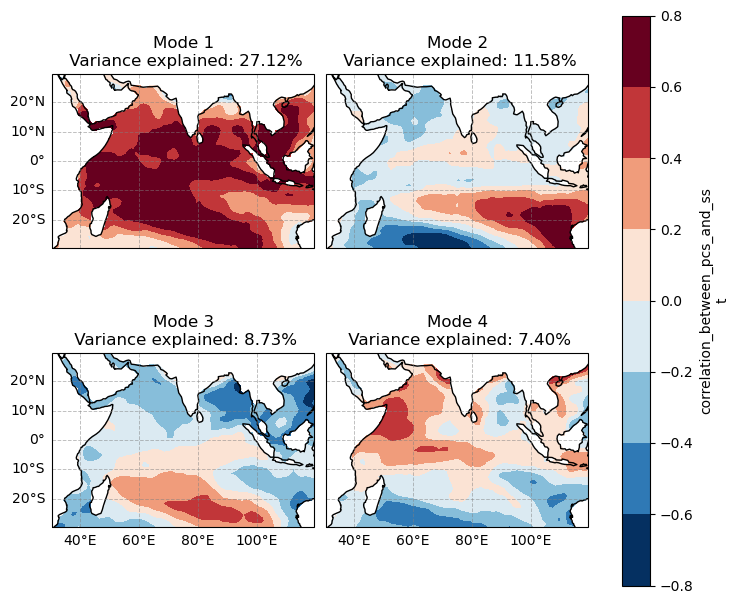

In [67]:
plot_eof(get_djf(OBS), -30,30,30,120)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_3699883/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


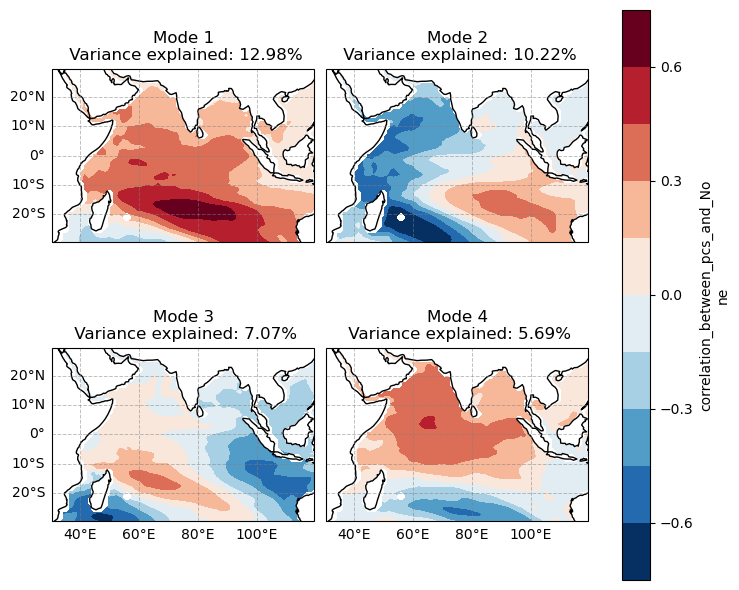

In [43]:
plot_eof((PO_PACE), -30,30,30,120)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_3699883/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


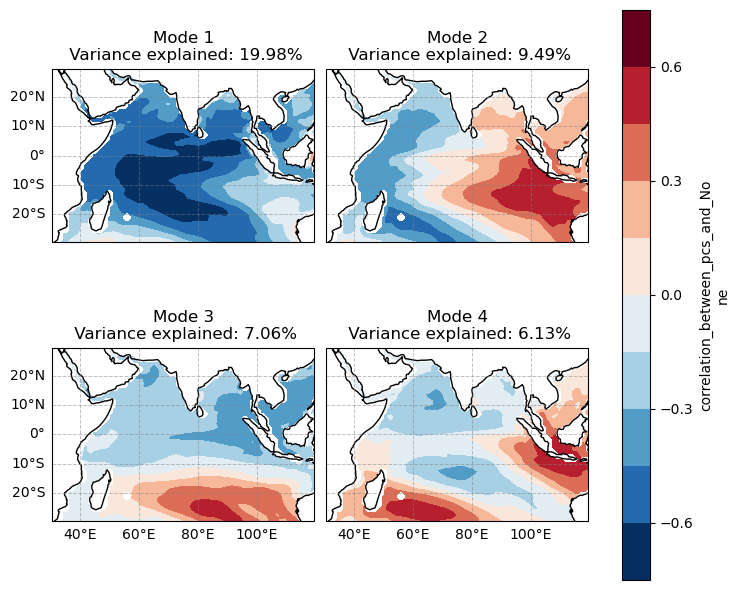

In [44]:
plot_eof((ctrl), -30,30,30,120)

In [68]:
def eof_region(ds, lat, lat1, lon, lon1, neof = 4):
    #convert ds to be from -180-180 to 0-360
    ds = ds.assign_coords(longitude=(ds.longitude % 360)).roll(longitude=180, roll_coords=True)
    #get the SSTA of the ds, and drop th emonth dimension so the eof solver can work
    ds = (ds.groupby('time.month') - ds.groupby('time.month').mean('time')).drop('month')
    #now get the domain we want
    ds = ds.sel(latitude = slice(lat,lat1), longitude = slice(lon,lon1))
    # Create an EOF solver to do the EOF analysis. Square-root of cosine of
    # latitude weights are applied before the computation of EOFs.
    coslat = np.cos(np.deg2rad(ds.coords['latitude'].values))
    wgts = np.sqrt(coslat)[..., np.newaxis]
    solver = Eof(ds, weights=wgts)
    # Retrieve the leading EOF, expressed as the correlation between the leading
    # PC time series and the input SST anomalies at each grid point, and the
    # leading PC time series itself.
    eof4 = solver.eofs(neofs=neof)
    pc4 = solver.pcs(npcs=neof, pcscaling=1)
    var = solver.varianceFraction()
    return eof4, pc4, var

In [69]:
#load observational SST
ersstv5 = xr.open_dataset("/g/data/e14/sm2435/PO_model_clim/ersstv5.nc", chunks = {'time':12}).sst
#rename coords
ersstv5 = ersstv5.rename({"lon": "longitude", "lat": "latitude"})
ersstv5 =ersstv5.sel(time = slice("1980-01-01", "2020-12-31"))
ersstv5 = ersstv5.compute()

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.01/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_2903322/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


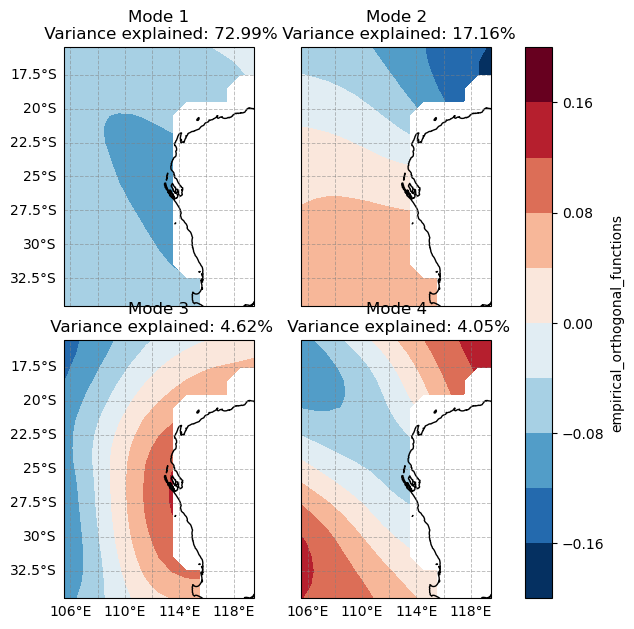

In [70]:
plot_eof(((ersstv5)), -35,-15,105,120)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.01/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_2903322/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


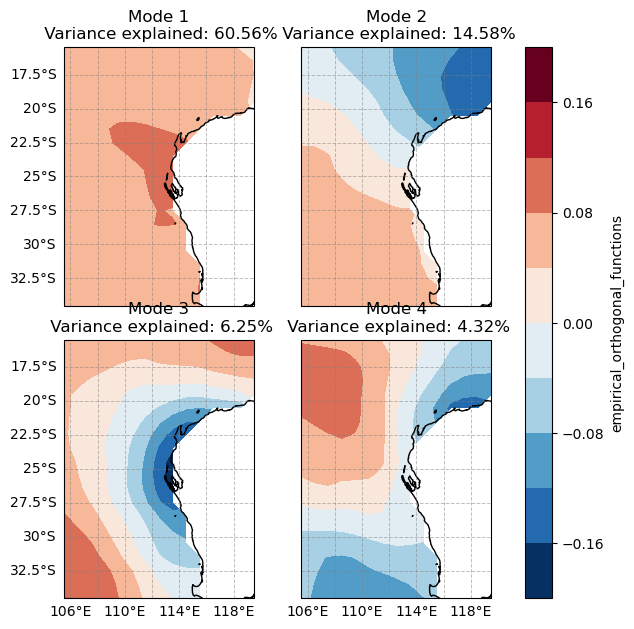

In [71]:
plot_eof(((OBS)), -35,-15,105,120)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.01/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_2903322/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


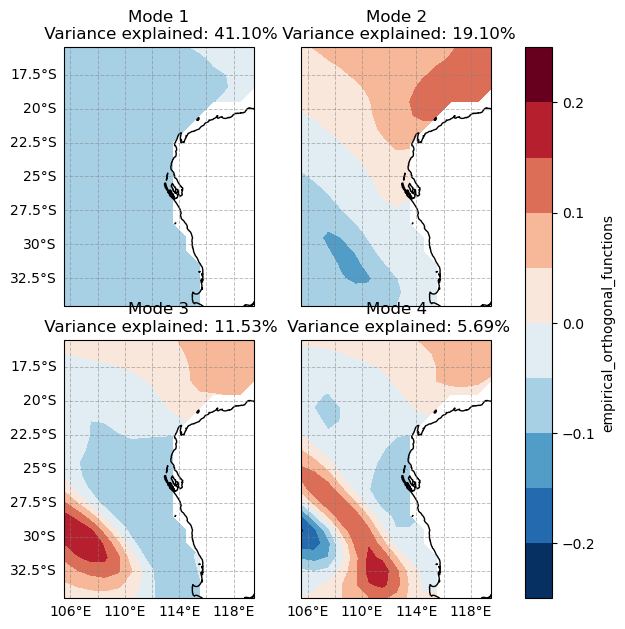

In [72]:
plot_eof(((ctrl)), -35,-15,105,120)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.01/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_2903322/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


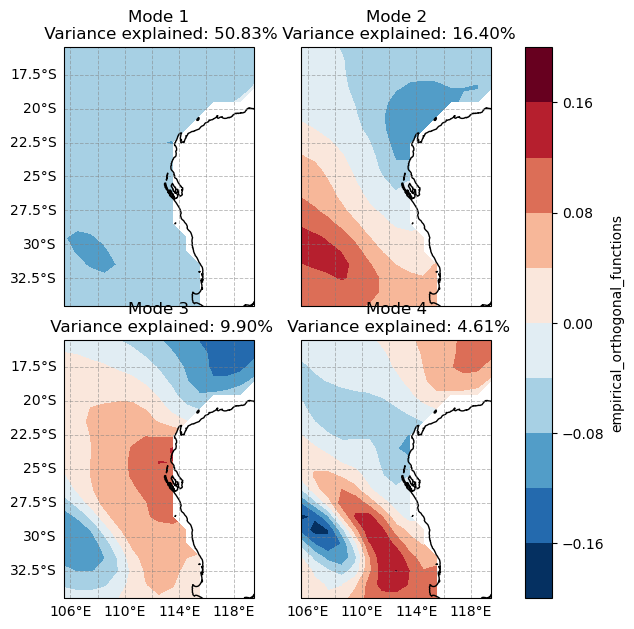

In [73]:
plot_eof(get_djf(ssta(ctrl)), -35,-15,105,120)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.01/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_2903322/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


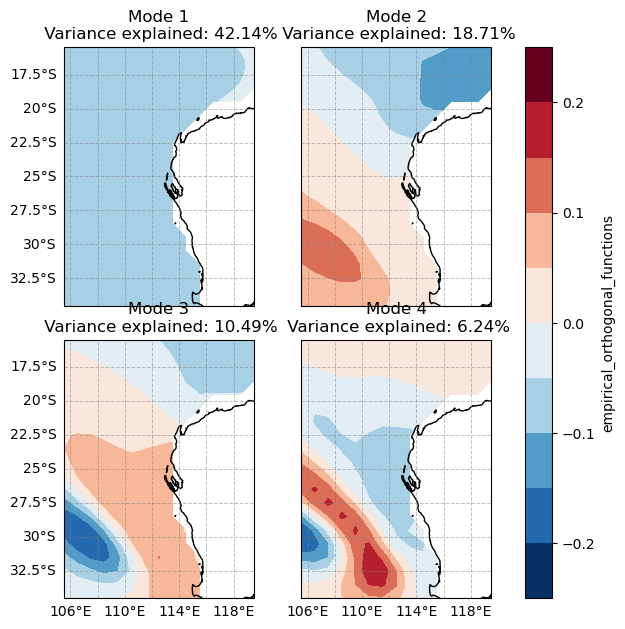

In [74]:
plot_eof(((PO_PACE)), -35,-15,105,120)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.01/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_2903322/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


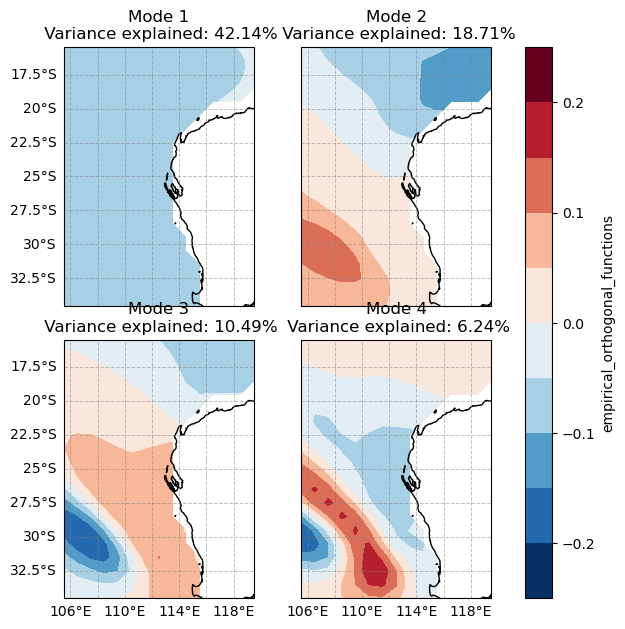

In [75]:
plot_eof((ssta(PO_PACE)), -35,-15,105,120)

In [76]:
pe,pp,pc = eof_region((PO_PACE), -35,-15,105,120)

In [77]:
ce,cp,cc = eof_region((ctrl), -35,-15,105,120)

Text(0.5, 1.0, 'PC1 of whole timeseries for Ningaloo nino')

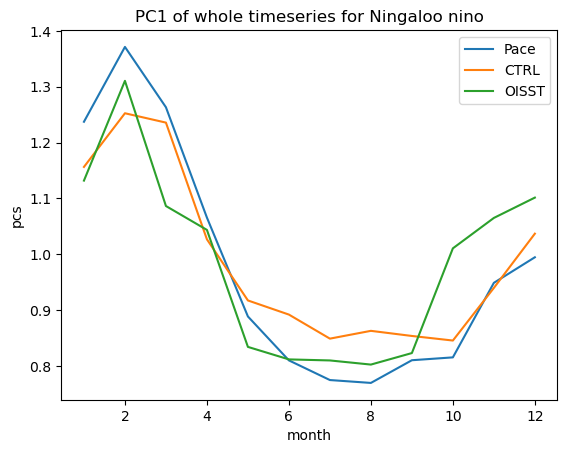

In [97]:
pp[:,0].groupby('time.month').std('time').plot(label = "Pace")
cp[:,0].groupby('time.month').std('time').plot(label = "CTRL")
op[:,0].groupby('time.month').std('time').plot(label = "OISST")

plt.legend()
plt.title("PC1 of whole timeseries for Ningaloo nino")

In [80]:
#get an index to calcualte the IOB
def ssta(DS):
    clim = DS.groupby('time.month').mean('time')
    ssta = DS.groupby('time.month') - clim
    return ssta
def NINO34(DS):
     return ssta(DS).sel(latitude=slice(-5, 5),longitude=slice(-170, -120)).mean(['latitude', 'longitude'])
     
def IOBM(DS):
    return ssta(DS).sel(latitude=slice(-20, 20),longitude=slice(40, 100)).mean(['latitude', 'longitude'])
def NINO34(DS):
    return ssta(DS).sel(latitude=slice(-5, 5),longitude=slice(-170, -120)).mean(['latitude', 'longitude'])
#calculate the DMI
def dmi(DS):
    WTIO = ssta(DS).sel(latitude=slice(-10, 10),longitude=slice(50, 70)).mean(['latitude', 'longitude'])
    SETIO = ssta(DS).sel(latitude=slice(-10, 0),longitude=slice(90, 110)).mean(['latitude', 'longitude'])
    return  WTIO-SETIO

In [81]:
def Ningaloo(DS):
    return ssta(DS).sel(latitude=slice(-28, -22),longitude=slice(108, 116)).mean(['latitude', 'longitude'])

In [82]:
#redefin Ninoglo index
def Ningaloo2(DS):
    return ssta(DS).sel(latitude=slice(-28, -22),longitude=slice(112, 114)).mean(['latitude', 'longitude'])

Text(0.5, 1.0, 'Ningaloo Nino Index (22-28S, 112-114) \n Standard deviation')

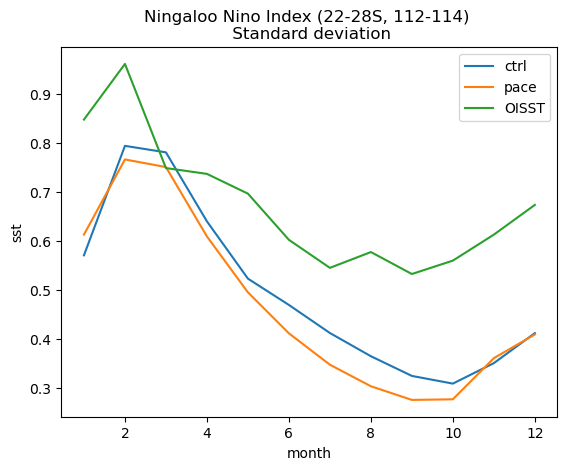

In [96]:
Ningaloo2(ctrl).groupby('time.month').std('time').plot(label = 'ctrl')
Ningaloo2(PO_PACE).groupby('time.month').std('time').plot(label = 'pace')
Ningaloo2(OBS).groupby('time.month').std('time').plot(label = 'OISST')

plt.legend()
plt.title("Ningaloo Nino Index (22-28S, 112-114) \n Standard deviation")

In [84]:
#correlation of PC1 to NNI
from scipy.stats import pearsonr

In [85]:
pearsonr(Ningaloo2(ctrl), cp[:,0])

PearsonRResult(statistic=-0.7552925422269995, pvalue=2e-323)

In [86]:
#get Nino34
n34 = NINO34(ctrl)

In [87]:
pearsonr(Ningaloo2(ctrl), n34)

PearsonRResult(statistic=-0.11452400212975722, pvalue=1.5396568563836221e-06)

In [88]:
pearsonr(cp[:,0], n34)

PearsonRResult(statistic=0.0027225553047251177, pvalue=0.909335614193717)

In [89]:
#now check obs

In [90]:
oe,op,oc = eof_region((OBS), -35,-15,105,120)

In [91]:
n34_OBS = NINO34(OBS)

In [92]:
pearsonr(Ningaloo2(OBS), op[:,0])

PearsonRResult(statistic=0.8451830320541923, pvalue=1.1015831287363834e-135)

In [94]:
pearsonr(Ningaloo2(OBS), n34_OBS)

PearsonRResult(statistic=-0.3593677074457593, pvalue=1.7847463649137403e-16)

In [95]:
pearsonr(op[:,0], n34_OBS)

PearsonRResult(statistic=-0.28298676360079045, pvalue=1.567785828887065e-10)

In [52]:
ctrl_ning = Ningaloo(ctrl)

Text(0.5, 1.0, 'Ningaloo Nino Index (22-28S, 108-116E) \n Standard deviation')

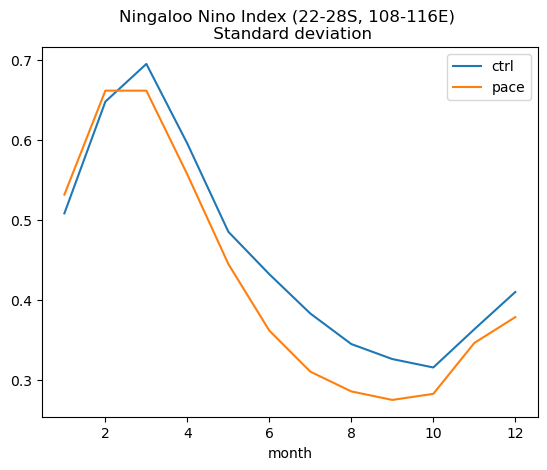

In [53]:
ctrl_ning.groupby('time.month').std('time').plot(label = 'ctrl')
Ningaloo(PO_PACE).groupby('time.month').std('time').plot(label = 'pace')
plt.legend()
plt.title("Ningaloo Nino Index (22-28S, 108-116E) \n Standard deviation")

Text(0.5, 1.0, 'Ningaloo Nino Index (22-28S, 108-116E) \n Standard deviation')

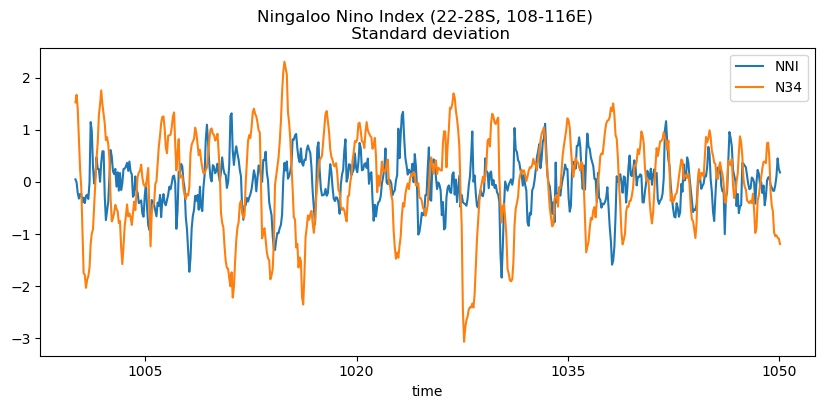

In [54]:
plt.figure(figsize = (10,4))
ctrl_ning.sel(time = slice('1000-01-16','1050-01-16' )).plot(label = 'NNI')
NINO34(ctrl).sel(time = slice('1000-01-16','1050-01-16' )).plot(label = 'N34')
plt.legend()
plt.title("Ningaloo Nino Index (22-28S, 108-116E) \n Standard deviation")

In [22]:
pace_IOD = dmi(PO_PACE)

In [23]:
ctrl_IOD = dmi(ctrl)

In [24]:
pace_IOBM = IOBM(PO_PACE)

In [25]:
ctrl_IOBM = IOBM(ctrl)

In [26]:
from scipy.signal import welch

/local/e14/sm2435/tmp/ipykernel_2008629/324787737.py:6: RuntimeWarning: divide by zero encountered in divide
  period = 1 / freq / 12


([<matplotlib.axis.XTick at 0x7fd207037df0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

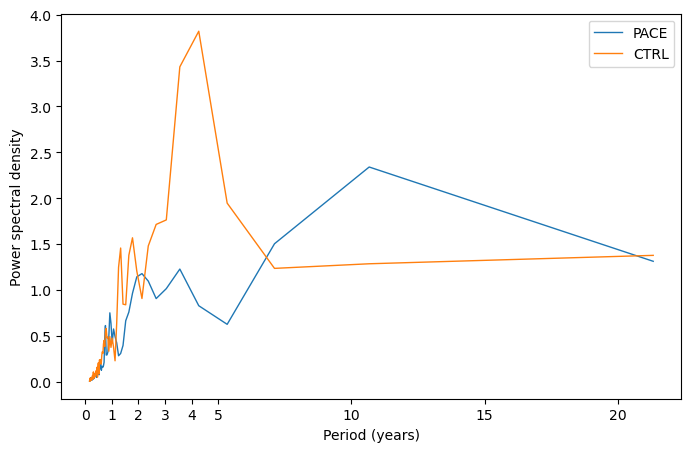

In [34]:
fs = 1 / (30.44 * 24 * 60 * 60)  # sampling frequency (in Hz)
freq, psd = welch(pace_IOD, window='hann')
freq1, psd1 = welch(ctrl_IOD, window='hann')

# convert frequency to period (in years)
period = 1 / freq / 12

# plot the power spectral density with years on the x-axis
plt.figure(figsize=(8, 5))
plt.plot(period, psd, label = 'PACE',linewidth = 1)
plt.plot(period, psd1, label = 'CTRL', linewidth = 1)

plt.xlabel('Period (years)')
plt.ylabel('Power spectral density')
plt.legend()
plt.xticks([0,1,2,3,4,5,10,15,20])

Text(0.5, 1.0, 'DMI std deviation')

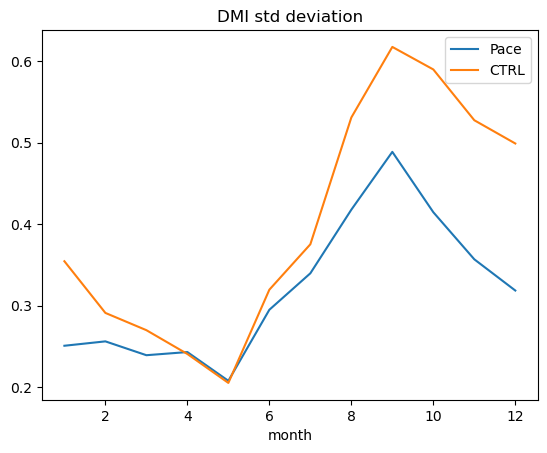

In [59]:
pace_IOD.groupby('time.month').std('time').plot(label = 'Pace')
ctrl_IOD.groupby('time.month').std('time').plot(label = 'CTRL')
plt.legend()
plt.title("DMI std deviation")

Text(0.5, 1.0, 'IOBM index std deviation')

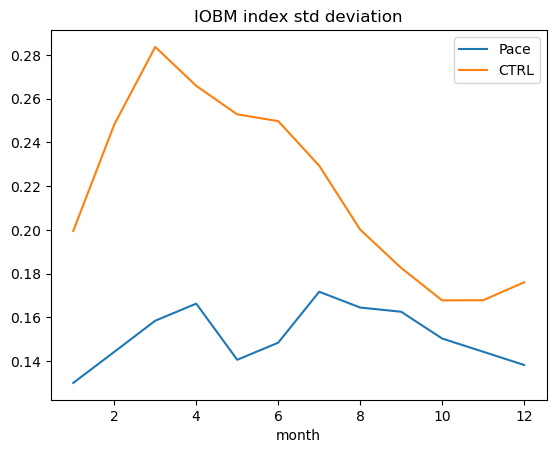

In [60]:
pace_IOBM.groupby('time.month').std('time').plot(label = 'Pace')
ctrl_IOBM.groupby('time.month').std('time').plot(label = 'CTRL')
plt.legend()
plt.title("IOBM index std deviation")

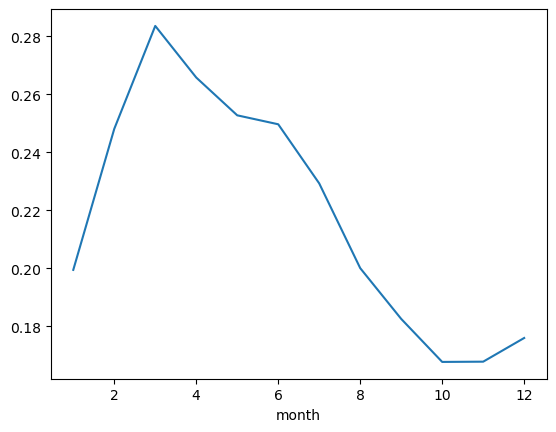

In [61]:
ctrl_IOBM.groupby('time.month').std('time').plot()

In [62]:
from scipy.stats import pearsonr


In [63]:
pearsonr(pp[:,0], pace_IOBM)

PearsonRResult(statistic=0.786918123548255, pvalue=0.0)

In [64]:
pearsonr(-1*cp[:,0], ctrl_IOBM)

PearsonRResult(statistic=0.9343153191424026, pvalue=0.0)

In [40]:
#lets look at La Nina composites in the control

In [35]:
n34 = NINO34(ctrl)

In [36]:
n34DJF=get_djf_mn(n34)

In [37]:
n34DJF

<xarray.DataArray (time: 147)>
array([ 9.9887753e-01,  5.0308567e-01,  5.1770359e-01,  3.2243338e-01,
        1.8667539e+00, -2.3738282e+00,  1.1302985e+00, -8.5768420e-01,
       -1.7036510e-01,  1.2292891e+00, -8.1971359e-01,  1.0023328e+00,
       -5.9531248e-01,  9.4786388e-01, -6.9740480e-01,  3.2279113e-01,
       -1.7650926e-02,  1.2563099e+00,  4.7037694e-01, -5.6519336e-01,
        1.1030703e+00, -6.3059711e-01,  1.3976818e+00, -1.8206310e+00,
        7.0511341e-01, -8.2640809e-01, -2.2972433e-01, -2.5009236e-01,
       -1.5688385e-01, -2.2582738e+00, -3.9570189e-01,  4.9426511e-01,
        1.9552965e-01,  4.1390825e-02, -3.2938877e-01,  3.8963076e-01,
        3.6093888e-01,  1.5858047e-01,  2.3654598e-01, -3.3872387e-01,
       -9.6612149e-01,  1.5058351e+00, -2.9482622e+00,  5.6479591e-01,
       -3.7329125e-01,  1.5610723e+00, -1.5440922e+00,  1.3068200e+00,
       -6.2199187e-01, -6.9440097e-01, -2.4419969e-02,  8.9701134e-01,
        1.0992906e+00, -1.9190109e-01,  2.8749213e-01,  8.5431880e-01,
       -1.8601227e+00, -4.5000586e-01,  1.0282187e+00, -1.5268011e+00,
        1.8618833e+00, -1.7241570e+00, -6.7540902e-01,  9.0880394e-01,
       -5.2885485e-01,  9.0021580e-01,  7.9348773e-01,  2.6346806e-01,
       -1.2413737e+00,  1.4627169e-01, -3.6648718e-01,  3.9803103e-01,
        1.3953433e+00, -2.4165590e+00,  7.1509764e-02,  8.2880622e-01,
       -1.7673134e+00,  8.1992514e-02,  7.6360697e-01, -4.7090080e-01,
        1.1440848e+00,  1.9795312e-01, -3.4035730e-01,  1.3435774e+00,
       -8.9087981e-01,  6.1529434e-01, -5.1050407e-01,  7.2549510e-01,
        3.6571160e-01, -9.2008144e-01,  8.9419204e-01, -8.9688778e-02,
        2.3962849e-01, -3.3023247e-01,  4.9856922e-01, -1.0239153e+00,
        2.1420722e-01, -1.8915030e+00,  1.0166970e+00, -1.5234579e+00,
        7.8971529e-01, -2.5672853e+00,  8.2924074e-01,  4.4129992e-01,
       -9.1958171e-01,  1.2836314e+00, -6.8414313e-01,  1.3740438e+00,
        1.5618503e-03, -1.1846447e-01,  5.1185840e-01, -8.4668428e-02,
        7.3844069e-01, -1.2566280e+00,  1.6515461e+00, -1.5239776e+00,
        1.1237460e+00, -7.5374508e-01,  4.1383386e-01, -1.4133101e+00,
        4.8840174e-01,  4.6154913e-01, -3.7425477e-02,  1.9575385e+00,
       -1.9481307e+00, -1.3425627e-01,  1.6499084e+00, -1.3769770e+00,
        7.8172493e-01,  3.2351917e-01, -8.3316201e-01,  6.6014415e-01,
        5.1323671e-02,  7.4572104e-01, -2.7242085e-01, -1.8385445e+00,
        5.9260917e-01,  1.0843433e+00, -1.3837054e-01,  3.6670271e-01,
       -3.5943159e-01, -7.0357537e-01,  2.3027010e-01, -1.1824025e+00,
        2.5570911e-01,  5.2372664e-01, -9.1636851e-02], dtype=float32)
Coordinates:
  * time     (time) object 0954-12-01 00:00:00 ... 1100-12-01 00:00:00

In [38]:
strength = n34DJF.std()
la_nina = n34DJF.where(n34DJF<-1*strength, drop = True)

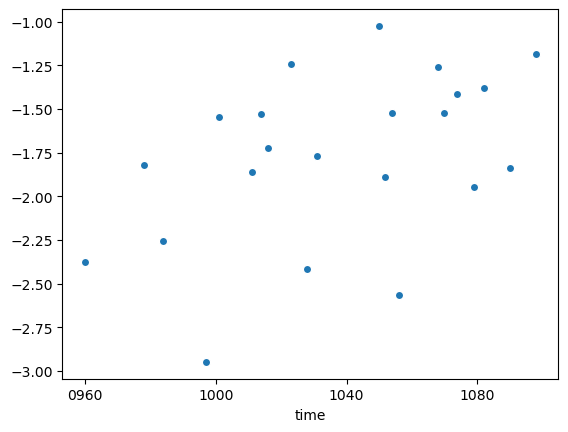

In [45]:
la_nina.plot.scatter()

In [42]:
el_nino = n34DJF.where(n34DJF>strength, drop = True)

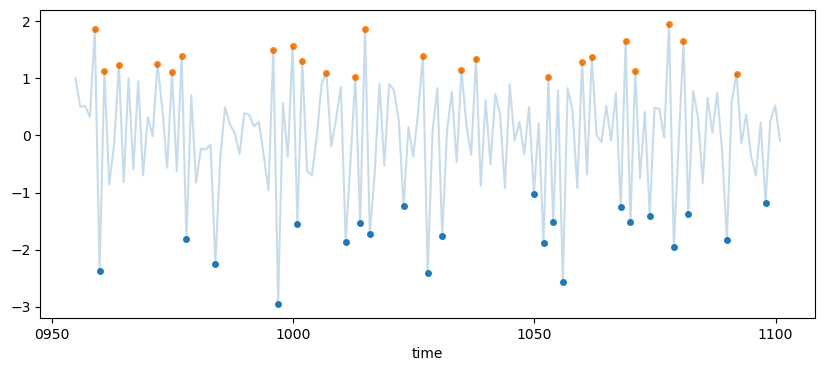

In [46]:
plt.figure(figsize = (10,4))
la_nina.plot.scatter()
el_nino.plot.scatter()
n34DJF.plot(alpha = 0.25)
#n34.plot(alpha = 0.25)

In [47]:
from dateutil.relativedelta import relativedelta

In [48]:
mam_SSTA = get_mam_mn(ssta(ctrl))

In [49]:
djf_SSTA = get_djf_mn(ssta(ctrl))

In [50]:
import cftime

In [51]:
#shift the la Nina years so that the year matches up

# Get the original time values as a numpy array
time_values = la_nina['time'].values

# Create a new array with shifted times shift y
time_shifted_values = []
for time in time_values:
    time_shifted = cftime.DatetimeGregorian(year=time.year+1, month=time.month-9, day=time.day,
                                         hour=time.hour, minute=time.minute, second=time.second)
    time_shifted_values.append(time_shifted)
time_shifted_values = xr.DataArray(time_shifted_values, dims='time', coords={'time': la_nina['time']})
la_nina_shifted = la_nina.assign_coords({'time': time_shifted_values})

In [52]:
la_nina_shifted.time

<xarray.DataArray 'time' (time: 22)>
array([cftime.DatetimeGregorian(960, 3, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(978, 3, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(984, 3, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(997, 3, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1001, 3, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1011, 3, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1014, 3, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1016, 3, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1023, 3, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1028, 3, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1031, 3, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1050, 3, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1052, 3, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1054, 3, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1056, 3, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1068, 3, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1070, 3, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1074, 3, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1079, 3, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1082, 3, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1090, 3, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1098, 3, 1, 0, 0, 0, 0, has_year_zero=False)],
      dtype=object)
Coordinates:
  * time     (time) object 0960-03-01 00:00:00 ... 1098-03-01 00:00:00

In [53]:
la_nina.time

<xarray.DataArray 'time' (time: 22)>
array([cftime.DatetimeGregorian(959, 12, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(977, 12, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(983, 12, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(996, 12, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1000, 12, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1010, 12, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1013, 12, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1015, 12, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1022, 12, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1027, 12, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1030, 12, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1049, 12, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1051, 12, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1053, 12, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1055, 12, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1067, 12, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1069, 12, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1073, 12, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1078, 12, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1081, 12, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1089, 12, 1, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1097, 12, 1, 0, 0, 0, 0, has_year_zero=False)],
      dtype=object)
Coordinates:
  * time     (time) object 0959-12-01 00:00:00 ... 1097-12-01 00:00:00

In [54]:
mam_SSTA.where(mam_SSTA.time == la_nina_shifted.time, drop = True)

<xarray.DataArray (time: 22, latitude: 180, longitude: 360)>
array([[[            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        ...,
        [-3.38819437e-02, -3.37531976e-02, -3.36246900e-02, ...,
         -3.42721939e-02, -3.41411047e-02, -3.40111665e-02],
        [-3.45128365e-02, -3.43057700e-02, -3.40948515e-02, ...,
         -3.51092406e-02, -3.49141359e-02, -3.47157307e-02],
        [-2.49305964e-02, -2.47997846e-02, -2.46660318e-02, ...,
         -2.53117885e-02, -2.51865387e-02, -2.50595808e-02]],

       [[            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
...
          1.11898975e-02,  1.12263756e-02,  1.12334890e-02],
        [ 1.18559999e-02,  1.18507147e-02,  1.18441181e-02, ...,
          1.18680000e-02,  1.18647814e-02,  1.18605690e-02],
        [ 1.14749270e-02,  1.14527149e-02,  1.14309387e-02, ...,
          1.15381079e-02,  1.15176840e-02,  1.14965439e-02]],

       [[            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        [            nan,             nan,             nan, ...,
                     nan,             nan,             nan],
        ...,
        [-2.85224114e-02, -2.83792820e-02, -2.82359123e-02, ...,
         -2.89458837e-02, -2.88073216e-02, -2.86651459e-02],
        [-2.79691610e-02, -2.79374514e-02, -2.79074106e-02, ...,
         -2.80701313e-02, -2.80352831e-02, -2.80018654e-02],
        [-2.95335855e-02, -2.95449886e-02, -2.95556393e-02, ...,
         -2.95014381e-02, -2.95117293e-02, -2.95225773e-02]]],
      dtype=float32)
Coordinates:
  * longitude  (longitude) float64 -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * latitude   (latitude) float64 -89.5 -88.5 -87.5 -86.5 ... 87.5 88.5 89.5
  * time       (time) object 0960-03-01 00:00:00 ... 1098-03-01 00:00:00

In [55]:
djf_SSTA.where(djf_SSTA.time == la_nina.time, drop = True)

<xarray.DataArray (time: 22, latitude: 180, longitude: 360)>
array([[[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        ...,
        [-0.03834887, -0.03807135, -0.03778601, ..., -0.03914257,
         -0.03888357, -0.0386196 ],
        [-0.03197841, -0.03158414, -0.03118145, ..., -0.03311419,
         -0.03274373, -0.03236489],
        [-0.0169729 , -0.0168424 , -0.01671036, ..., -0.01735401,
         -0.01722908, -0.01710149]],

       [[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
...
        [ 0.00973082,  0.00955637,  0.00938129, ...,  0.01021858,
          0.01007835,  0.00990454],
        [ 0.01243198,  0.01231921,  0.01220679, ...,  0.01277037,
          0.01265721,  0.01254467],
        [ 0.0144068 ,  0.01436706,  0.01432729, ...,  0.0145268 ,
          0.01448635,  0.01444693]],

       [[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        ...,
        [-0.02991529, -0.02974987, -0.02958405, ..., -0.03039567,
         -0.03024515, -0.0300806 ],
        [-0.02941144, -0.02937559, -0.0293417 , ..., -0.02953219,
         -0.02949019, -0.02944966],
        [-0.03358638, -0.03362243, -0.03365942, ..., -0.03348303,
         -0.033517  , -0.0335509 ]]], dtype=float32)
Coordinates:
  * longitude  (longitude) float64 -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * latitude   (latitude) float64 -89.5 -88.5 -87.5 -86.5 ... 87.5 88.5 89.5
  * time       (time) object 0959-12-01 00:00:00 ... 1097-12-01 00:00:00

In [56]:
LN_S = la_nina_shifted.groupby('time.year').mean('time')

In [57]:
mamssta_S = mam_SSTA.groupby('time.year').mean('time')

In [58]:
#get the mean of each year so that we can use the year dim

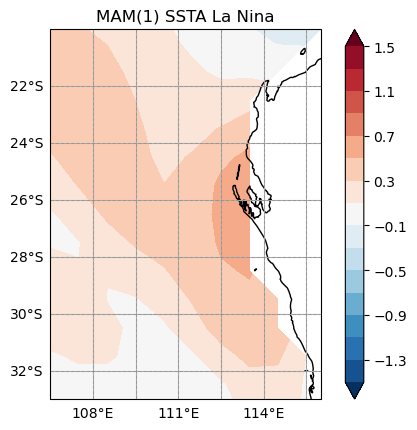

In [59]:
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))
mam_SSTA.where(mam_SSTA.time == la_nina_shifted.time, drop = True).mean('time').plot.contourf(ax=ax, transform=ccrs.PlateCarree(),
                        vmin = -1.5, vmax = 1.5, levels = 16, cmap = "RdBu_r")
ax.set_title('MAM(1) SSTA La Nina')
ax.coastlines(color = 'k')
ax.gridlines()
#ax.set_facecolor('grey')
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
ax.set_extent([106.5, 116, -33, -20])

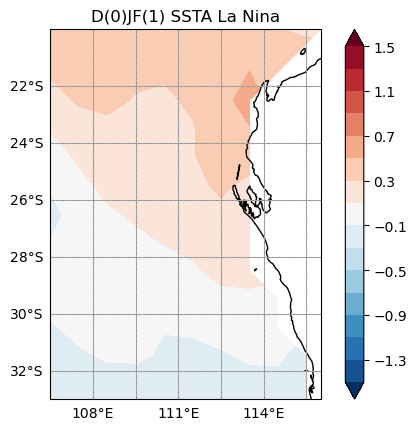

In [60]:
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))
djf_SSTA.where(djf_SSTA.time == la_nina.time, drop = True).mean('time').plot.contourf(ax=ax, transform=ccrs.PlateCarree(),
                        vmin = -1.5, vmax = 1.5, levels = 16, cmap = "RdBu_r", extend = 'both')
ax.set_title('D(0)JF(1) SSTA La Nina')
ax.coastlines(color = 'k')
ax.gridlines()
#ax.set_facecolor('grey')
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
ax.set_extent([106.5, 116, -33, -20])

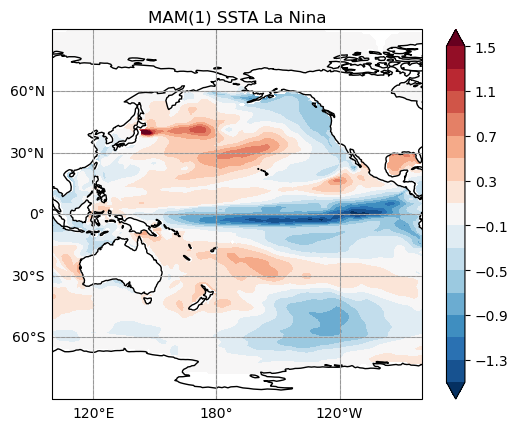

In [61]:
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))
mam_SSTA.where(mam_SSTA.time == la_nina_shifted.time, drop = True).mean('time').plot.contourf(ax=ax, transform=ccrs.PlateCarree(),
                        vmin = -1.5, vmax = 1.5, levels = 16, cmap = "RdBu_r")
ax.set_title('MAM(1) SSTA La Nina')
ax.coastlines(color = 'k')
ax.gridlines()
#ax.set_facecolor('grey')
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
ax.set_extent([100, 280, -33, 20])

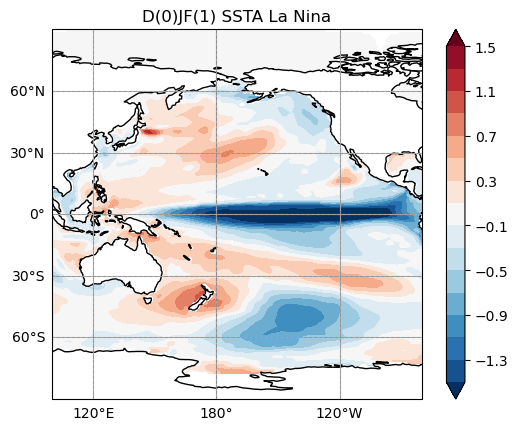

In [62]:
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))
djf_SSTA.where(djf_SSTA.time == la_nina.time, drop = True).mean('time').plot.contourf(ax=ax, transform=ccrs.PlateCarree(),
                        vmin = -1.5, vmax = 1.5, levels = 16, cmap = "RdBu_r", extend = 'both')
ax.set_title('D(0)JF(1) SSTA La Nina')
ax.coastlines(color = 'k')
ax.gridlines()
#ax.set_facecolor('grey')
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
ax.set_extent([100, 280, -33, 20])

In [63]:
#redefin Ninoglo index
def Ningaloo2(DS):
    return ssta(DS).sel(latitude=slice(-28, -22),longitude=slice(112, 114)).mean(['latitude', 'longitude'])

Text(0.5, 1.0, 'Ningaloo Nino Index (22-28S, 112-114) \n Standard deviation')

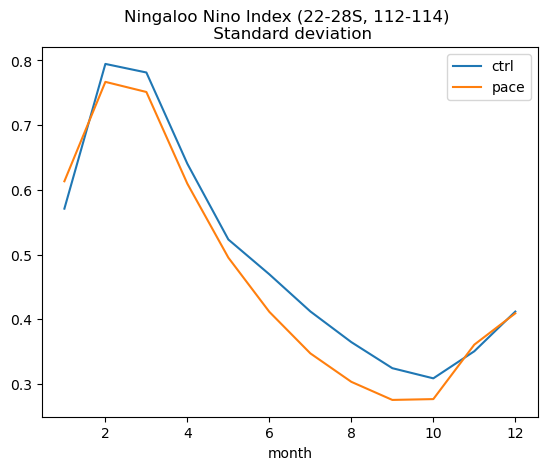

In [58]:
Ningaloo2(ctrl).groupby('time.month').std('time').plot(label = 'ctrl')
Ningaloo2(PO_PACE).groupby('time.month').std('time').plot(label = 'pace')
plt.legend()
plt.title("Ningaloo Nino Index (22-28S, 112-114) \n Standard deviation")

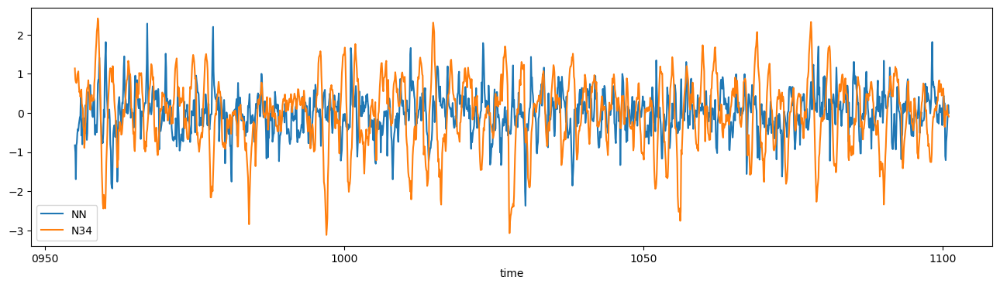

In [59]:
plt.figure(figsize = (16,4))
(Ningaloo2(ctrl)).plot(label = 'NN')
(NINO34(ctrl)).plot(label = 'N34')
plt.legend()

In [60]:
def get_jfm(ds):
    return ds.sel(time=ds['time.month'].isin([1,2,3])).groupby('time.year').mean('time')

In [ ]:
get_jfm(Ningaloo2(ctrl)).plot()

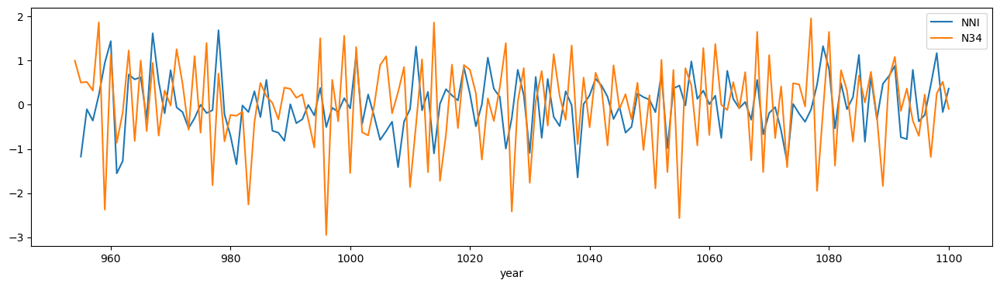

In [64]:
plt.figure(figsize = (16,4))
get_jfm(Ningaloo2(ctrl)).plot(label = 'NNI')
n34DJF.groupby('time.year').mean('time').plot(label = 'N34')
plt.legend()

Text(0.5, 1.0, 'Ningaloo Nino Index (22-28S, 108-116E) pdf')

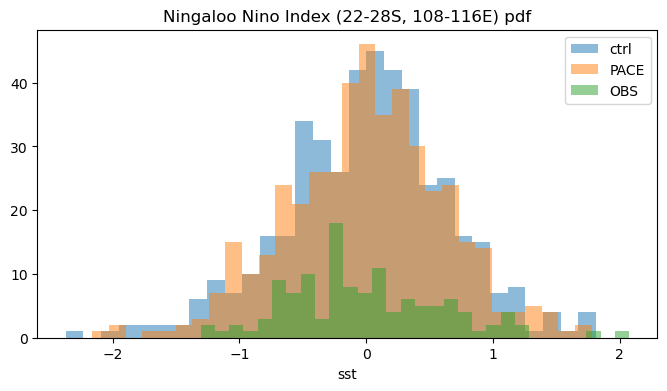

In [65]:
plt.figure(figsize = (8,4))
get_mam(Ningaloo2(ctrl.sel(time = slice('0950-01-16','1100-12-16' )))).plot.hist(bins = 30, label = 'ctrl', alpha = 0.5)
get_mam(Ningaloo2(PO_PACE.sel(time = slice('0950-01-16','1100-12-16' )))).plot.hist(bins = 30, label = 'PACE', alpha = 0.5)
get_mam(Ningaloo2(ersstv5)).plot.hist(bins = 30, label = 'OBS', alpha = 0.5)

plt.legend()
plt.title("Ningaloo Nino Index (22-28S, 108-116E) pdf")

Text(0.5, 1.0, 'Pacemaker')

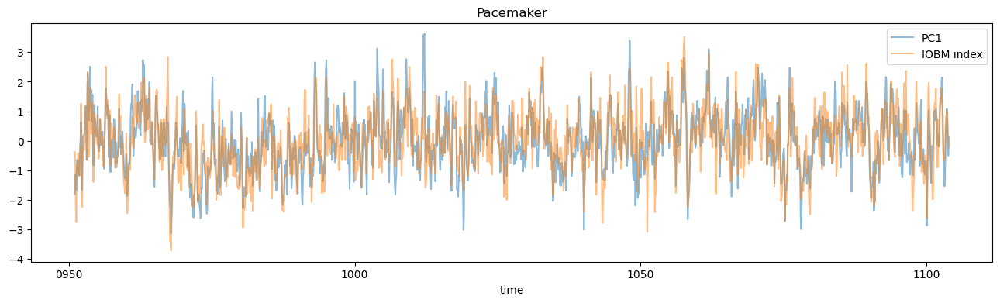

In [58]:
plt.figure(figsize = (16,4))
#pace_IOBM.plot(alpha = 0.5)
pp[:,0].plot(alpha = 0.5, label = 'PC1')
(pace_IOBM/pace_IOBM.std()).plot(alpha = 0.5, label = 'IOBM index')
plt.legend()
plt.title("Pacemaker")

Text(0.5, 1.0, 'CTRL')

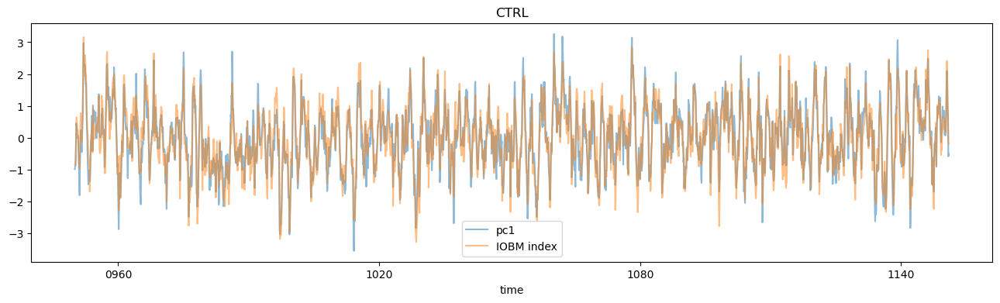

In [59]:
plt.figure(figsize = (16,4))
#pace_IOBM.plot(alpha = 0.5)
(-1*cp[:,0]).plot(alpha = 0.5, label = "pc1")
(ctrl_IOBM/ctrl_IOBM.std()).plot(alpha = 0.5, label = "IOBM index")
plt.legend()
plt.title("CTRL")

In [ ]:
aaaa

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_3059361/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


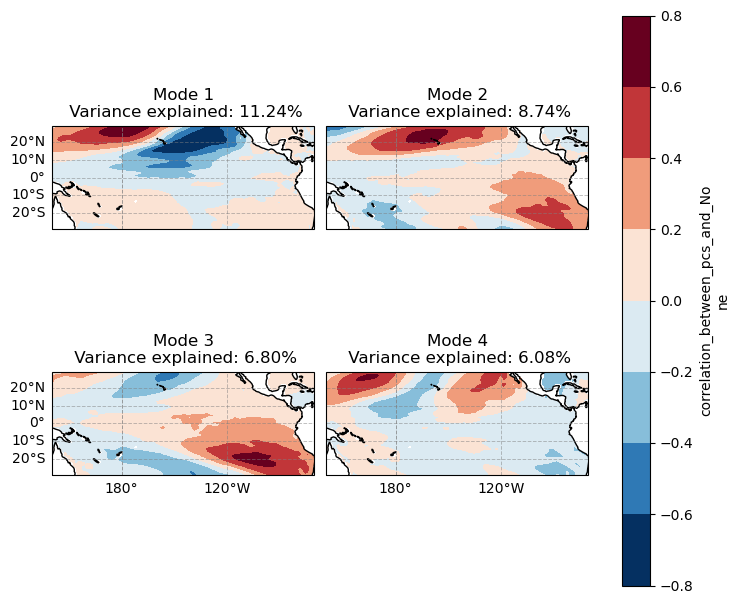

In [78]:
plot_eof((PO_PACE), -30,30,140,(360-70))

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_3059361/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


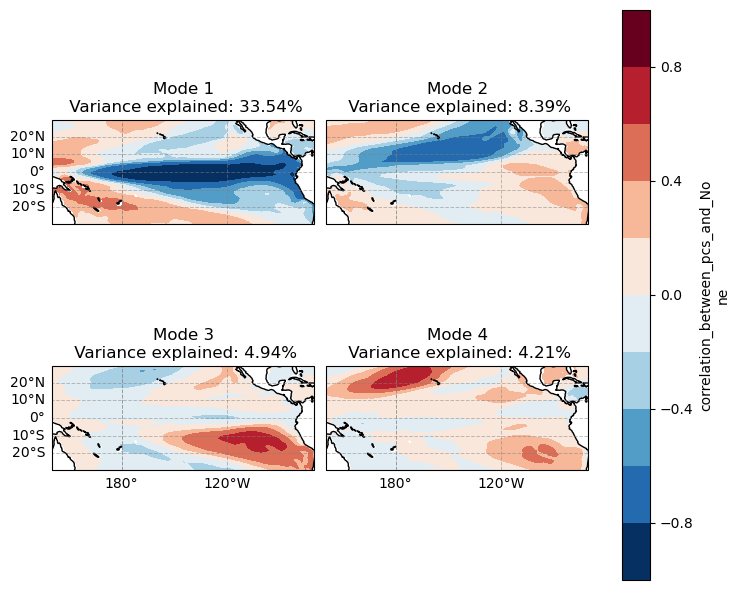

In [77]:
plot_eof((ctrl), -30,30,140,(360-70))

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_3059361/2336992486.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


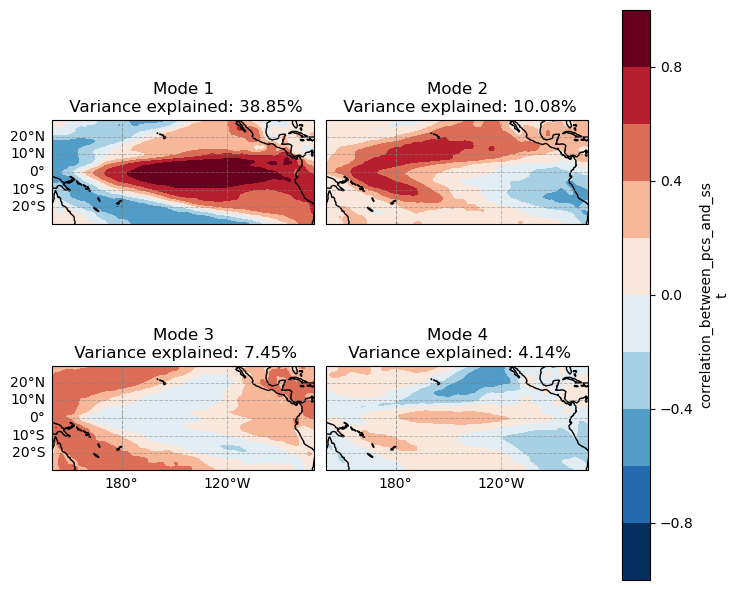

In [80]:
plot_eof((OBS), -30,30,140,(360-70))

In [83]:
def NINO34(DS):
    DS = DS.groupby('time.month') - DS.groupby('time.month').mean('time')
    Nino34 = DS.sel(latitude=slice(-5, 5),longitude=slice(-170, -120)).mean(['latitude', 'longitude'])
    return Nino34

In [99]:
#calculate the Nino34 for ctrl
n34_ctrl = NINO34(PO_PACE)

In [100]:
c_e, c_p, c_v = eof_region(PO_PACE,  -30,30,140,(360-70))

In [101]:
from scipy.stats import pearsonr

In [103]:
pearsonr(c_p[:,1], n34_ctrl)

PearsonRResult(statistic=0.12782315235613623, pvalue=3.887951583446989e-08)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_3631864/877474398.py:34: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):
/local/e14/sm2435/tmp/ipykernel_3631864/877474398.py:48: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for ax,title in zip(fg.axes.flatten(),titles):


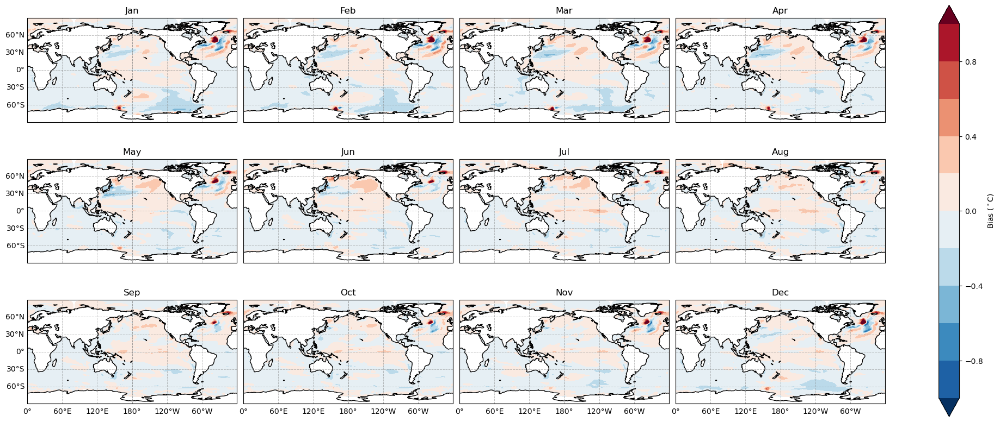

In [61]:
sst_bias(PO_PACE, ctrl, plot=True, temp_scale = 1)

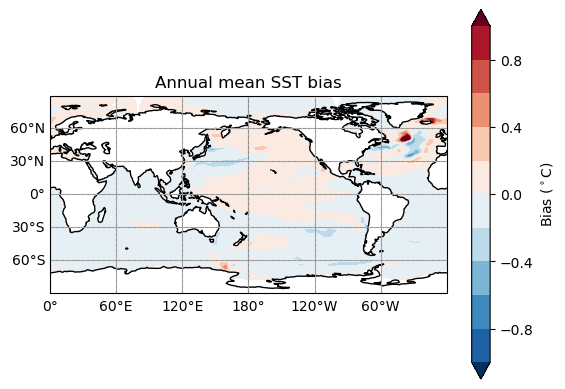

In [62]:
sst_bias(PO_PACE, ctrl, "annual", plot=True, temp_scale = 1)

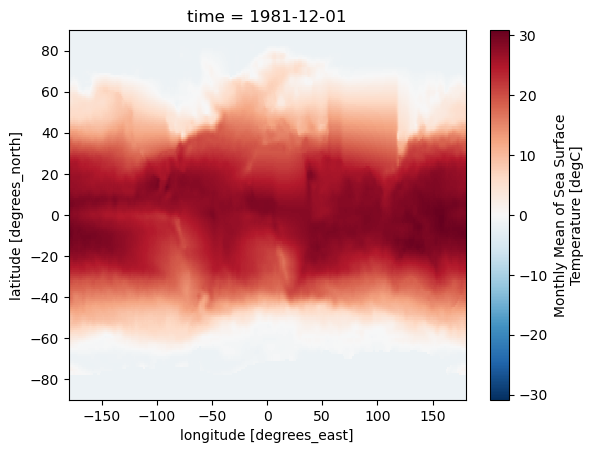

In [47]:
OBS[0].plot()

In [5]:
#first rename vars
sst = sst.rename({"geolon_t": "longitude", "geolat_t": "latitude"})


In [6]:
ds_out = xe.util.grid_global(1, 1)
ds_out = ds_out.drop({'lon_b', 'lat_b'})

In [7]:
#ds_out = ds_out.assign_coords({'lon': ds_out.lon - 180.})

ds_out = ds_out.rename({'lon': 'longitude', 'lat': 'latitude'})
ds_out

<xarray.Dataset>
Dimensions:    (y: 180, x: 360)
Coordinates:
    longitude  (y, x) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
    latitude   (y, x) float64 -89.5 -89.5 -89.5 -89.5 ... 89.5 89.5 89.5 89.5
Dimensions without coordinates: y, x
Data variables:
    *empty*

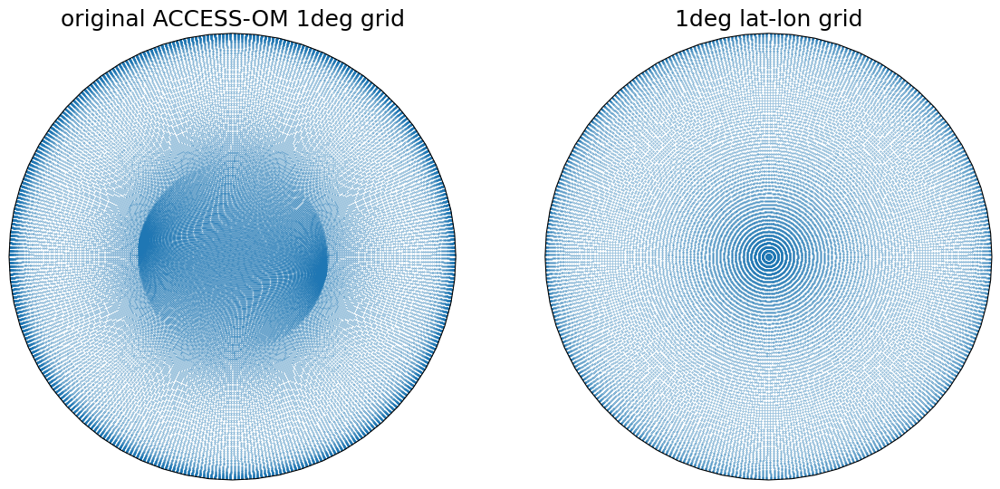

In [8]:
projection = ccrs.cartopy.crs.Orthographic(central_longitude=0.0, central_latitude=90)
fig, axes = plt.subplots(ncols = 2, subplot_kw={'projection': projection}, figsize = (14, 8))

axes[0].scatter(sst['longitude'], sst['latitude'], s=0.1, transform=ccrs.PlateCarree())  # plot grid locations
axes[0].set_title('original ACCESS-OM 1deg grid', fontsize=18)

axes[1].scatter(ds_out['longitude'], ds_out['latitude'], s=0.1, transform=ccrs.PlateCarree())  # plot grid locations
axes[1].set_title('1deg lat-lon grid', fontsize=18);
#for ax in axes:
#    ax.coastlines()
#    ax.set_extent([-180, 180, 55, 90], crs=ccrs.PlateCarree())

In [9]:
ds_in_1deg = sst.drop({'xt_ocean', 'yt_ocean'})

In [10]:
ds_in_1deg

<xarray.Dataset>
Dimensions:    (time: 1836, yt_ocean: 300, xt_ocean: 360)
Coordinates:
  * time       (time) object 0951-01-16 12:00:00 ... 1103-12-14 12:00:00
    latitude   (yt_ocean, xt_ocean) float32 dask.array<chunksize=(300, 360), meta=np.ndarray>
    longitude  (yt_ocean, xt_ocean) float32 dask.array<chunksize=(300, 360), meta=np.ndarray>
Dimensions without coordinates: yt_ocean, xt_ocean
Data variables:
    sst        (time, yt_ocean, xt_ocean) float32 dask.array<chunksize=(12, 300, 360), meta=np.ndarray>

In [11]:
%time
regridder_1deg = xe.Regridder(ds_in_1deg, ds_out, 'bilinear', periodic=True,
                                               filename="bilinear_tracer_weights_in1degACCESSOM2_out1deg.nc")

CPU times: user 8 µs, sys: 3 µs, total: 11 µs
Wall time: 21.7 µs


In [12]:
regridder_1deg

xESMF Regridder 
Regridding algorithm:       bilinear 
Weight filename:            bilinear_tracer_weights_in1degACCESSOM2_out1deg.nc 
Reuse pre-computed weights? False 
Input grid shape:           (300, 360) 
Output grid shape:          (180, 360) 
Periodic in longitude?      True

In [13]:
%%time
sst_regridded = regridder_1deg(sst['sst'].chunk({'xt_ocean': -1, 'yt_ocean': -1}))
sst_regridded = sst_regridded.assign_coords({'x': ds_out.longitude[0, :], 'y': ds_out.latitude[:, 0]})
sst_regridded = sst_regridded.rename({'x': 'longitude', 'y': 'latitude'})
sst_regridded

CPU times: user 3.9 s, sys: 232 ms, total: 4.13 s
Wall time: 5.09 s


<xarray.DataArray (time: 1836, latitude: 180, longitude: 360)>
dask.array<_regrid, shape=(1836, 180, 360), dtype=float32, chunksize=(12, 180, 360), chunktype=numpy.ndarray>
Coordinates:
  * time       (time) object 0951-01-16 12:00:00 ... 1103-12-14 12:00:00
  * longitude  (longitude) float64 -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * latitude   (latitude) float64 -89.5 -88.5 -87.5 -86.5 ... 87.5 88.5 89.5
Attributes:
    regrid_method:  bilinear

In [14]:
sst_regridded = sst_regridded.compute()

In [15]:
#roll coords to be 0-360
#sst_regridded = sst_regridded.assign_coords(longitude=(sst_regridded.longitude % 360)).roll(longitude=180, roll_coords=True)


In [16]:
#plot SST bias for pacemaker

In [15]:
#load in SST and regrid
OBS = xr.open_dataset("/g/data/e14/sm2435/ACCESS_PIctrl/oisstv2.nc", chunks = {'time':12}).sst
#rename coords
OBS = OBS.rename({"lon": "longitude", "lat": "latitude"})

In [16]:
sst_regridded

<xarray.DataArray (time: 1836, latitude: 180, longitude: 360)>
array([[[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [-1.7486209, -1.7485799, -1.7485391, ..., -1.7487438,
         -1.7487034, -1.7486621],
        [-1.7451688, -1.7451558, -1.7451403, ..., -1.7451926,
         -1.7451872, -1.7451793],
        [-1.7404631, -1.7405026, -1.7405416, ..., -1.7403425,
         -1.740383 , -1.7404233]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
...
        [-1.7424974, -1.7422899, -1.7420797, ..., -1.7430807,
         -1.7429049, -1.7427025],
        [-1.7368797, -1.7368598, -1.736836 , ..., -1.7369151,
         -1.7369076, -1.7368957],
        [-1.7220154, -1.7220896, -1.722161 , ..., -1.7217747,
         -1.7218579, -1.7219381]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [-1.7481898, -1.7480695, -1.7479457, ..., -1.7485111,
         -1.7484204, -1.7483068],
        [-1.7427006, -1.742711 , -1.742718 , ..., -1.742648 ,
         -1.7426695, -1.7426869],
        [-1.7270569, -1.7271612, -1.7272624, ..., -1.7267247,
         -1.7268386, -1.7269492]]], dtype=float32)
Coordinates:
  * time       (time) object 0951-01-16 12:00:00 ... 1103-12-14 12:00:00
  * longitude  (longitude) float64 -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * latitude   (latitude) float64 -89.5 -88.5 -87.5 -86.5 ... 87.5 88.5 89.5
Attributes:
    regrid_method:  bilinear

In [17]:
#now write a fucntion to output bias and to optioanlly plot
def sst_bias(model, obs, freq=None, plot=None):
    """
    Lorem ipsum dolor sit amet, consetetur sadipscing elitr,
    sed diam nonumy eirmod tempor invidunt ut labore et dolore magna aliquyam
    
    Parameters
    ----------
    model : argument of type int
        DataArray of model run 
    obs : argument of type int
        Lorem ipsum dolor sit amet
    freq : {‘monthly’, ‘annual’}, optional
        if None default to 'monthly'
    plot : True or False
        if true, plot is made, if false then no

    """
    #check frequency of sampling, defaukt to monthly if not specified
    if freq == None:
        freq = 'monthly'
    if plot == None:
        plot = False
    #calculate the bias
    if freq == "monthly":
        bias = (model.groupby('time.month').mean('time') - obs.groupby('time.month').mean('time'))
        if plot == True:
            fg = bias.plot.contourf(col='month', col_wrap = 4,  transform=ccrs.PlateCarree(),
                                 subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180)}, 
                                  figsize=(20,8), facecolor = 'white', vmin = -2, vmax = 2, levels =11,  cmap = 'RdBu_r',
                                    cbar_kwargs=dict(label='Bias ($^\\circ$C)'))
            for i, ax in enumerate(fg.axes.flat):
                ax.coastlines()
                #ax.set_facecolor('grey')
                gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                                  linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
                if i in [0,1,2,3,4,5,6,7]:
                    gl.bottom_labels = False
                if i in [1,2,3,5,6,7,9,10,11]:
                    gl.left_labels = False
                gl.top_labels = False
                gl.right_labels = False               
            #now add the month labels\n",
            titles =['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun','Jul',
                     'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
            for ax,title in zip(fg.axes.flatten(),titles):
                ax.set_title(title )
            return
        elif plot == False:
            return bias
    elif freq == "annual":
        bias = (model.mean('time') - obs.mean('time'))
        if plot == True:
            ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))
            bias.plot.contourf(ax=ax, vmin = -2, vmax = 2, cmap = "RdBu_r", levels = 11, extend = 'both',
                   transform=ccrs.PlateCarree(), cbar_kwargs=dict(label='Bias ($^\\circ$C)'))
            ax.set_title('Annual mean SST bias')
            ax.coastlines(color = 'k')
            ax.gridlines()
            #ax.set_facecolor('grey')
            gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                                  linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
            gl.top_labels = False
            gl.right_labels = False
            return 
        elif plot == False:
            return bias

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_1723893/3088674256.py:32: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):
/local/e14/sm2435/tmp/ipykernel_1723893/3088674256.py:46: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for ax,title in zip(fg.axes.flatten(),titles):


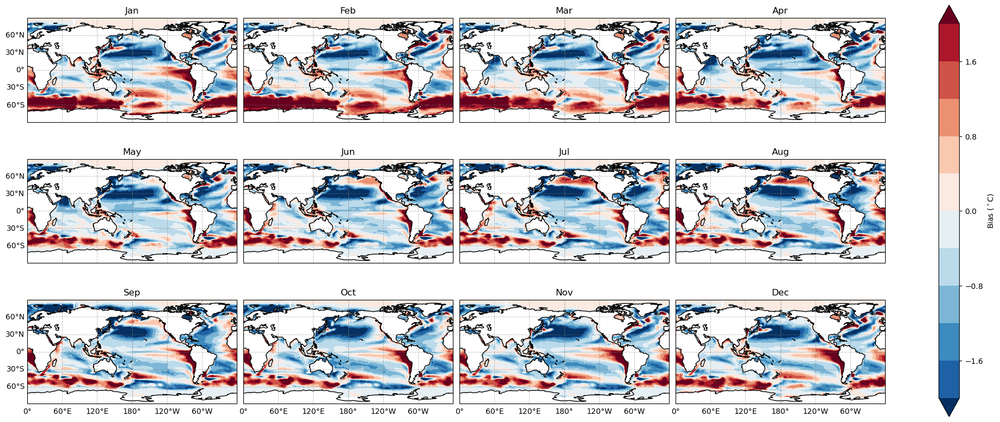

In [18]:
sst_bias(sst_regridded, OBS, plot=True)

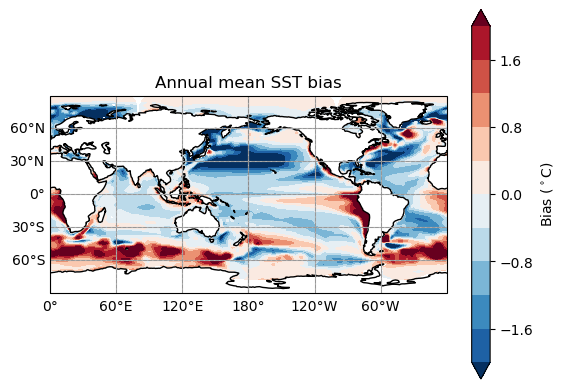

In [19]:
sst_bias(sst_regridded, OBS, freq="annual", plot=True)

In [20]:
def get_djf(ds):
    djf = ds.resample(time="QS-DEC").mean()
    djf = djf.sel(time=djf['time.season']=='DJF')
    #convert time to year for ease of comparison with SON
    #djf = djf.groupby('time.year').mean('time')
    return djf

In [21]:
#fucntion for EOF analysis
def eof_region(ds, lat, lat1, lon, lon1, neof = 4):
    #convert ds to be from -180-180 to 0-360
    ds = ds.assign_coords(longitude=(ds.longitude % 360)).roll(longitude=180, roll_coords=True)
    #get the SSTA of the ds, and drop th emonth dimension so the eof solver can work
    ds = (ds.groupby('time.month') - ds.groupby('time.month').mean('time')).drop('month')
    #now get the domain we want
    ds = ds.sel(latitude = slice(lat,lat1), longitude = slice(lon,lon1))
    # Create an EOF solver to do the EOF analysis. Square-root of cosine of
    # latitude weights are applied before the computation of EOFs.
    coslat = np.cos(np.deg2rad(ds.coords['latitude'].values))
    wgts = np.sqrt(coslat)[..., np.newaxis]
    solver = Eof(ds, weights=wgts)
    # Retrieve the leading EOF, expressed as the correlation between the leading
    # PC time series and the input SST anomalies at each grid point, and the
    # leading PC time series itself.
    eof4 = solver.eofsAsCorrelation(neofs=neof)
    pc4 = solver.pcs(npcs=neof, pcscaling=1)
    var = solver.varianceFraction()
    return eof4, pc4, var

In [22]:
e, p, var = eof_region(get_djf(sst_regridded), -30,30,150, 290)

/local/e14/sm2435/tmp/ipykernel_1723893/2897029330.py:4: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


Text(0.5, 0.98, 'EOFs of Pacific Pace')

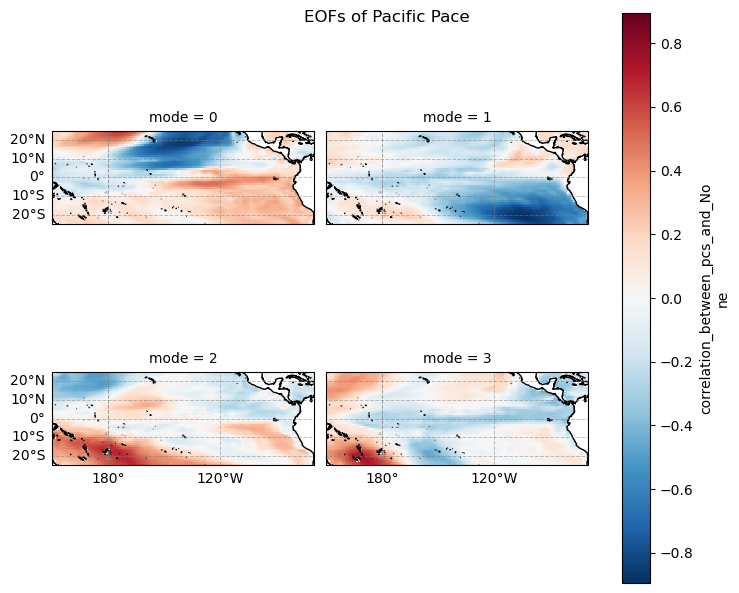

In [23]:
fg = e.plot(col = 'mode', col_wrap = 2, transform=ccrs.PlateCarree(),
                                 subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180)}, 
                                  facecolor = 'white')
for i, ax in enumerate(fg.axes.flat):
    ax.coastlines()
    #ax.set_facecolor('grey')
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
    if i in [0,1]:
        gl.bottom_labels = False
    if i in [1,3]:
        gl.left_labels = False
    gl.top_labels = False
    gl.right_labels = False
plt.suptitle("EOFs of Pacific Pace")

In [34]:
e, p, var = eof_region(get_djf(PI_regridded), -25,25,150, 290)

/local/e14/sm2435/tmp/ipykernel_1723893/1935996416.py:4: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


Text(0.5, 0.98, 'EOFs of Pacific ctrl')

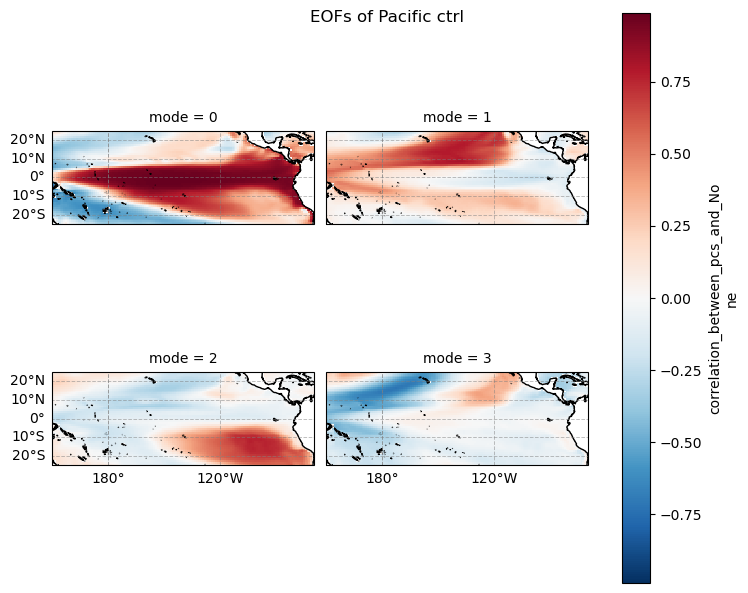

In [35]:
fg = e.plot(col = 'mode', col_wrap = 2, transform=ccrs.PlateCarree(),
                                 subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180)}, 
                                  facecolor = 'white')
for i, ax in enumerate(fg.axes.flat):
    ax.coastlines()
    #ax.set_facecolor('grey')
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
    if i in [0,1]:
        gl.bottom_labels = False
    if i in [1,3]:
        gl.left_labels = False
    gl.top_labels = False
    gl.right_labels = False
plt.suptitle("EOFs of Pacific ctrl")

In [38]:
e, p, var = eof_region(get_djf(OBS).compute(), -40,40,140, 290)

/local/e14/sm2435/tmp/ipykernel_1723893/3830731124.py:4: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


Text(0.5, 0.98, 'EOFs of Pacific OBS')

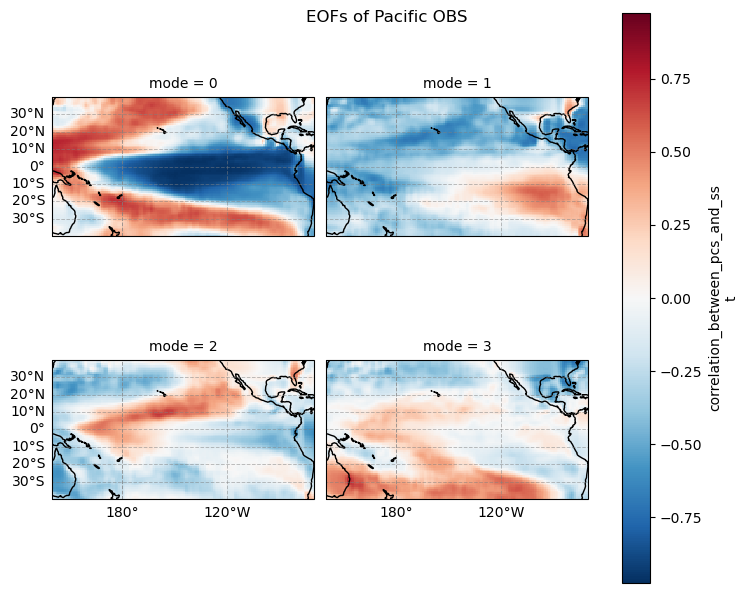

In [39]:
fg = e.plot(col = 'mode', col_wrap = 2, transform=ccrs.PlateCarree(),
                                 subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180)}, 
                                  facecolor = 'white')
for i, ax in enumerate(fg.axes.flat):
    ax.coastlines()
    #ax.set_facecolor('grey')
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
    if i in [0,1]:
        gl.bottom_labels = False
    if i in [1,3]:
        gl.left_labels = False
    gl.top_labels = False
    gl.right_labels = False
plt.suptitle("EOFs of Pacific OBS")

In [94]:
OBS.sel(latitude = slice(-25,25), longitude = slice(150,290))

<xarray.DataArray 'sst' (time: 493, latitude: 50, longitude: 30)>
dask.array<getitem, shape=(493, 50, 30), dtype=float32, chunksize=(12, 50, 30), chunktype=numpy.ndarray>
Coordinates:
  * time       (time) datetime64[ns] 1981-12-01 1982-01-01 ... 2022-12-01
  * longitude  (longitude) float64 150.5 151.5 152.5 153.5 ... 177.5 178.5 179.5
  * latitude   (latitude) float64 -24.5 -23.5 -22.5 -21.5 ... 22.5 23.5 24.5
Attributes:
    standard_name:         sea_surface_temperature
    long_name:             Monthly Mean of Sea Surface Temperature
    units:                 degC
    unpacked_valid_range:  [-5. 40.]
    actual_range:          [-1.7999996 35.56862  ]
    precision:             2
    var_desc:              Sea Surface Temperature
    dataset:               NOAA Optimum Interpolation (OI) SST V2
    level_desc:            Surface
    statistic:             Mean
    parent_stat:           Weekly Mean
    cell_methods:          time: mean (monthly from weekly values interpolate...

In [42]:
#perform EOF on IO SON

In [45]:
#fn to get SON
def get_SON(ds):
    return ds.sel(time=ds['time.month'].isin([9, 10, 11]))

In [50]:
#PO
e, p, var = eof_region(get_SON(sst_regridded), -25,25,40, 120)

In [64]:
def plot_eof(ds, lat, lat1, lon, lon1):
    e, p, var = eof_region(ds, lat, lat1, lon ,lon1)
    fg = e.plot(col = 'mode', col_wrap = 2, transform=ccrs.PlateCarree(),
                                 subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180)}, 
                                  facecolor = 'white')
    for i, ax in enumerate(fg.axes.flat):
        ax.set_title("Mode "+str(i+1)+"\n Variance explained: "+f'{var[i].values*100:.2f}'+"%", fontsize = 12)
        ax.coastlines()
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                          linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
        if i in [0,1]:
            gl.bottom_labels = False
        if i in [1,3]:
            gl.left_labels = False
        gl.top_labels = False
        gl.right_labels = False
    return

/local/e14/sm2435/tmp/ipykernel_1723893/201677222.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


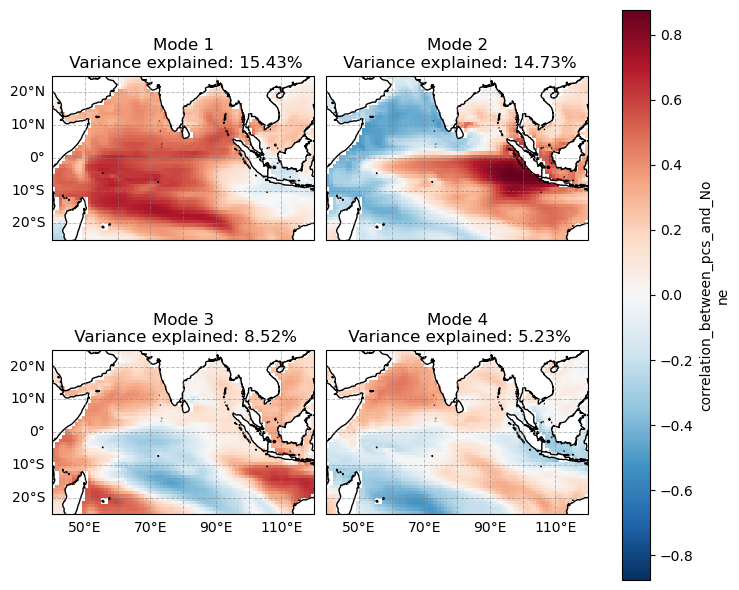

In [65]:
plot_eof(get_SON(sst_regridded), -25,25,40, 120)

/local/e14/sm2435/tmp/ipykernel_1723893/201677222.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


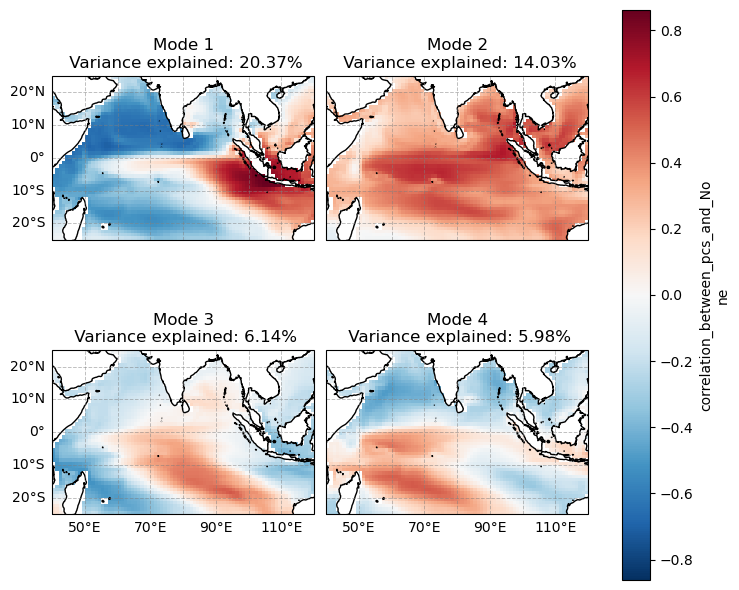

In [71]:
plot_eof(get_SON(PI_regridded), -25,25,40, 120)

/local/e14/sm2435/tmp/ipykernel_1723893/201677222.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


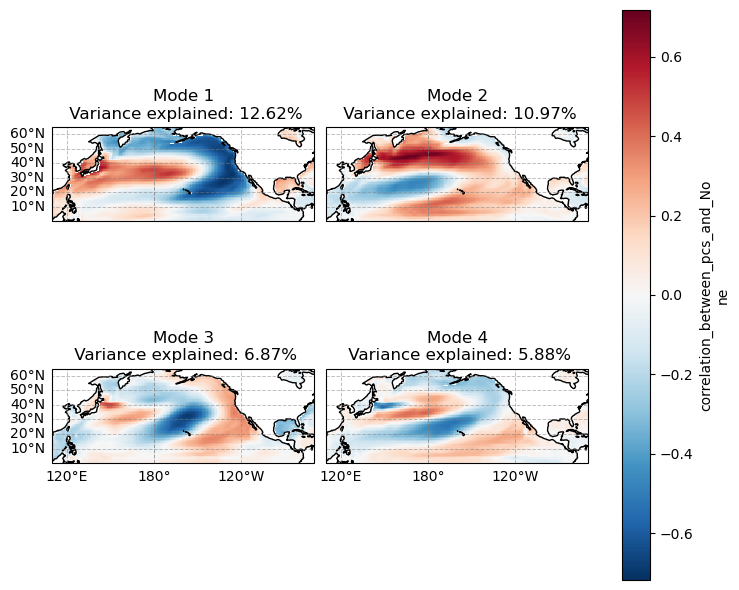

In [74]:
plot_eof((sst_regridded), 0,65,110, 290)

/local/e14/sm2435/tmp/ipykernel_1723893/201677222.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


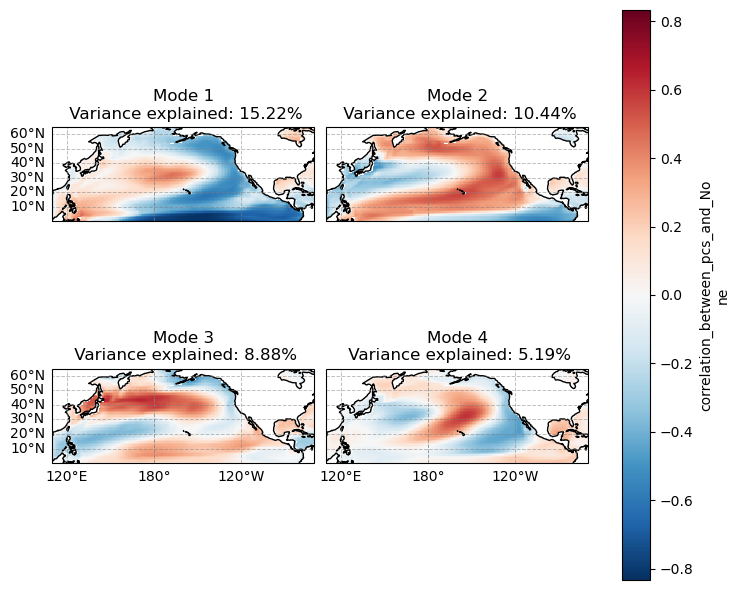

In [75]:
plot_eof((PI_regridded), 0,65,110, 290)

/local/e14/sm2435/tmp/ipykernel_1723893/3446176501.py:4: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


Text(0.5, 0.98, 'EOFs of IO Pacific Pace')

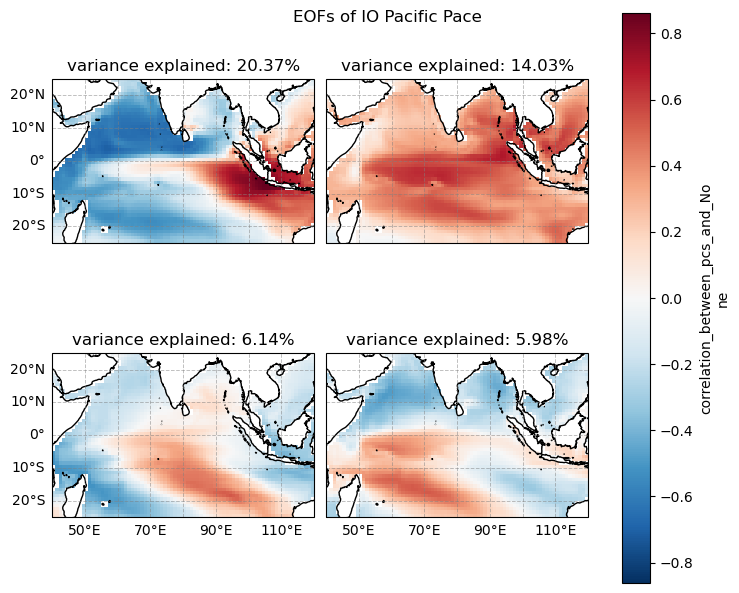

In [57]:
fg = e.plot(col = 'mode', col_wrap = 2, transform=ccrs.PlateCarree(),
                                 subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180)}, 
                                  facecolor = 'white')
for i, ax in enumerate(fg.axes.flat):
    ax.set_title("variance explained: "+f'{var[i].values*100:.2f}'+"%")
    ax.coastlines()
    #ax.set_facecolor('grey')
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
    if i in [0,1]:
        gl.bottom_labels = False
    if i in [1,3]:
        gl.left_labels = False
    gl.top_labels = False
    gl.right_labels = False
plt.suptitle("EOFs of IO Pacific Pace")

In [52]:
e, p, var = eof_region(get_SON(PI_regridded), -25,25,40, 120)

/local/e14/sm2435/tmp/ipykernel_1723893/1206322932.py:4: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):


Text(0.5, 0.98, 'EOFs of IO Pacific Pace')

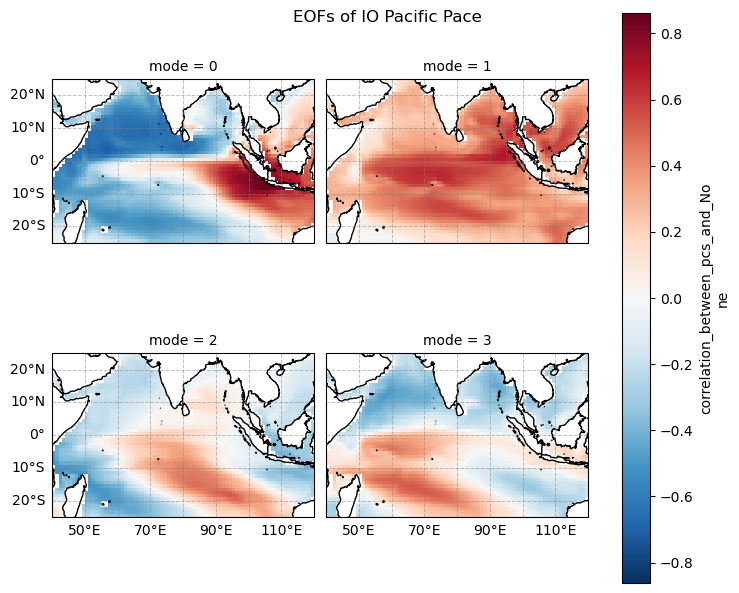

In [53]:
fg = e.plot(col = 'mode', col_wrap = 2, transform=ccrs.PlateCarree(),
                                 subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180)}, 
                                  facecolor = 'white')
for i, ax in enumerate(fg.axes.flat):
    ax.coastlines()
    #ax.set_facecolor('grey')
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
    if i in [0,1]:
        gl.bottom_labels = False
    if i in [1,3]:
        gl.left_labels = False
    gl.top_labels = False
    gl.right_labels = False
plt.suptitle("EOFs of IO Pacific Pace")

In [41]:
OBS.sel(time=OBS['time.month'].isin([9, 10, 11])).time


<xarray.DataArray 'time' (time: 123)>
array(['1982-09-01T00:00:00.000000000', '1982-10-01T00:00:00.000000000',
       '1982-11-01T00:00:00.000000000', '1983-09-01T00:00:00.000000000',
       '1983-10-01T00:00:00.000000000', '1983-11-01T00:00:00.000000000',
       '1984-09-01T00:00:00.000000000', '1984-10-01T00:00:00.000000000',
       '1984-11-01T00:00:00.000000000', '1985-09-01T00:00:00.000000000',
       '1985-10-01T00:00:00.000000000', '1985-11-01T00:00:00.000000000',
       '1986-09-01T00:00:00.000000000', '1986-10-01T00:00:00.000000000',
       '1986-11-01T00:00:00.000000000', '1987-09-01T00:00:00.000000000',
       '1987-10-01T00:00:00.000000000', '1987-11-01T00:00:00.000000000',
       '1988-09-01T00:00:00.000000000', '1988-10-01T00:00:00.000000000',
       '1988-11-01T00:00:00.000000000', '1989-09-01T00:00:00.000000000',
       '1989-10-01T00:00:00.000000000', '1989-11-01T00:00:00.000000000',
       '1990-09-01T00:00:00.000000000', '1990-10-01T00:00:00.000000000',
       '1990-11-01T00:00:00.000000000', '1991-09-01T00:00:00.000000000',
       '1991-10-01T00:00:00.000000000', '1991-11-01T00:00:00.000000000',
       '1992-09-01T00:00:00.000000000', '1992-10-01T00:00:00.000000000',
       '1992-11-01T00:00:00.000000000', '1993-09-01T00:00:00.000000000',
       '1993-10-01T00:00:00.000000000', '1993-11-01T00:00:00.000000000',
       '1994-09-01T00:00:00.000000000', '1994-10-01T00:00:00.000000000',
       '1994-11-01T00:00:00.000000000', '1995-09-01T00:00:00.000000000',
       '1995-10-01T00:00:00.000000000', '1995-11-01T00:00:00.000000000',
       '1996-09-01T00:00:00.000000000', '1996-10-01T00:00:00.000000000',
       '1996-11-01T00:00:00.000000000', '1997-09-01T00:00:00.000000000',
       '1997-10-01T00:00:00.000000000', '1997-11-01T00:00:00.000000000',
       '1998-09-01T00:00:00.000000000', '1998-10-01T00:00:00.000000000',
       '1998-11-01T00:00:00.000000000', '1999-09-01T00:00:00.000000000',
       '1999-10-01T00:00:00.000000000', '1999-11-01T00:00:00.000000000',
       '2000-09-01T00:00:00.000000000', '2000-10-01T00:00:00.000000000',
       '2000-11-01T00:00:00.000000000', '2001-09-01T00:00:00.000000000',
       '2001-10-01T00:00:00.000000000', '2001-11-01T00:00:00.000000000',
       '2002-09-01T00:00:00.000000000', '2002-10-01T00:00:00.000000000',
       '2002-11-01T00:00:00.000000000', '2003-09-01T00:00:00.000000000',
       '2003-10-01T00:00:00.000000000', '2003-11-01T00:00:00.000000000',
       '2004-09-01T00:00:00.000000000', '2004-10-01T00:00:00.000000000',
       '2004-11-01T00:00:00.000000000', '2005-09-01T00:00:00.000000000',
       '2005-10-01T00:00:00.000000000', '2005-11-01T00:00:00.000000000',
       '2006-09-01T00:00:00.000000000', '2006-10-01T00:00:00.000000000',
       '2006-11-01T00:00:00.000000000', '2007-09-01T00:00:00.000000000',
       '2007-10-01T00:00:00.000000000', '2007-11-01T00:00:00.000000000',
       '2008-09-01T00:00:00.000000000', '2008-10-01T00:00:00.000000000',
       '2008-11-01T00:00:00.000000000', '2009-09-01T00:00:00.000000000',
       '2009-10-01T00:00:00.000000000', '2009-11-01T00:00:00.000000000',
       '2010-09-01T00:00:00.000000000', '2010-10-01T00:00:00.000000000',
       '2010-11-01T00:00:00.000000000', '2011-09-01T00:00:00.000000000',
       '2011-10-01T00:00:00.000000000', '2011-11-01T00:00:00.000000000',
       '2012-09-01T00:00:00.000000000', '2012-10-01T00:00:00.000000000',
       '2012-11-01T00:00:00.000000000', '2013-09-01T00:00:00.000000000',
       '2013-10-01T00:00:00.000000000', '2013-11-01T00:00:00.000000000',
       '2014-09-01T00:00:00.000000000', '2014-10-01T00:00:00.000000000',
       '2014-11-01T00:00:00.000000000', '2015-09-01T00:00:00.000000000',
       '2015-10-01T00:00:00.000000000', '2015-11-01T00:00:00.000000000',
       '2016-09-01T00:00:00.000000000', '2016-10-01T00:00:00.000000000',
       '2016-11-01T00:00:00.000000000', '2017-09-01T00:00:00.000000000',
       '2017-10-01T00:00:00.000000000', '2017-11-01T00:00:00.000000000',
       '2018-09-01T0

In [17]:
IO_SST = sst_regridded.sel(latitude = slice(-25,25), longitude = slice(30,110))

In [18]:
#get IO_SSTA
IO_SSTA = IO_SST - IO_SST.mean('time')

In [19]:
IO_SSTA2 = IO_SST.groupby('time.month') - IO_SST.groupby('time.month').mean('time')

In [20]:
IO_SSTA2 = IO_SSTA2.drop("month")

In [21]:
def get_ason(ds):
    asos = ds.resample(time="M").mean()  # resample to monthly frequency
    asos_aug_to_nov = asos.sel(time=asos['time.month'].isin([8, 9, 10, 11])) 
    return asos_aug_to_nov

In [22]:
test = get_ason(IO_SSTA2)

In [23]:
test.time

<xarray.DataArray 'time' (time: 612)>
array([cftime.DatetimeGregorian(951, 8, 31, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(951, 9, 30, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(951, 10, 31, 0, 0, 0, 0, has_year_zero=False),
       ...,
       cftime.DatetimeGregorian(1103, 9, 30, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1103, 10, 31, 0, 0, 0, 0, has_year_zero=False),
       cftime.DatetimeGregorian(1103, 11, 30, 0, 0, 0, 0, has_year_zero=False)],
      dtype=object)
Coordinates:
  * time     (time) object 0951-08-31 00:00:00 ... 1103-11-30 00:00:00

In [24]:
def get_ason(ds):
    djf = ds.resample(time="QS-DEC").mean()
    djf = djf.sel(time=djf['time.season']=='DJF')
    #convert time to year for ease of comparison with SON
    djf = djf.groupby('time.year').mean('time')
    return djf

In [25]:
#perform EOF
# Create an EOF solver to do the EOF analysis. Square-root of cosine of
# latitude weights are applied before the computation of EOFs.
coslat = np.cos(np.deg2rad(IO_SSTA.coords['latitude'].values))
wgts = np.sqrt(coslat)[..., np.newaxis]
solver = Eof(test, weights=wgts)

# Retrieve the leading EOF, expressed as the correlation between the leading
# PC time series and the input SST anomalies at each grid point, and the
# leading PC time series itself.
eof1 = solver.eofsAsCorrelation(neofs=4)
pc1 = solver.pcs(npcs=4, pcscaling=1)
var = solver.varianceFraction()


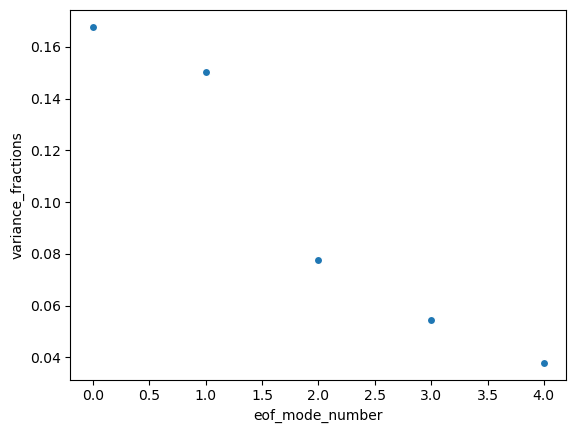

In [26]:
var[0:5].plot.scatter()

In [21]:
eof2.plot(col = 'mode', col_wrap = 2)

NameError: name 'eof2' is not defined

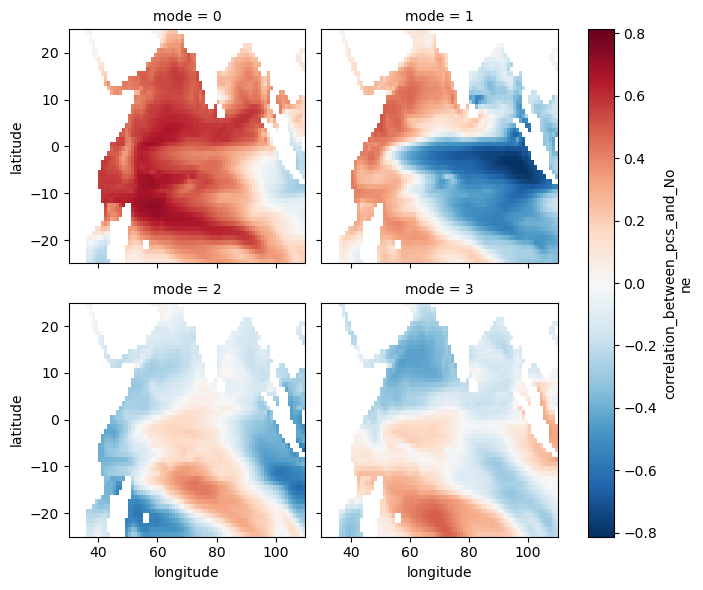

In [27]:
eof1.plot(col = 'mode', col_wrap = 2)

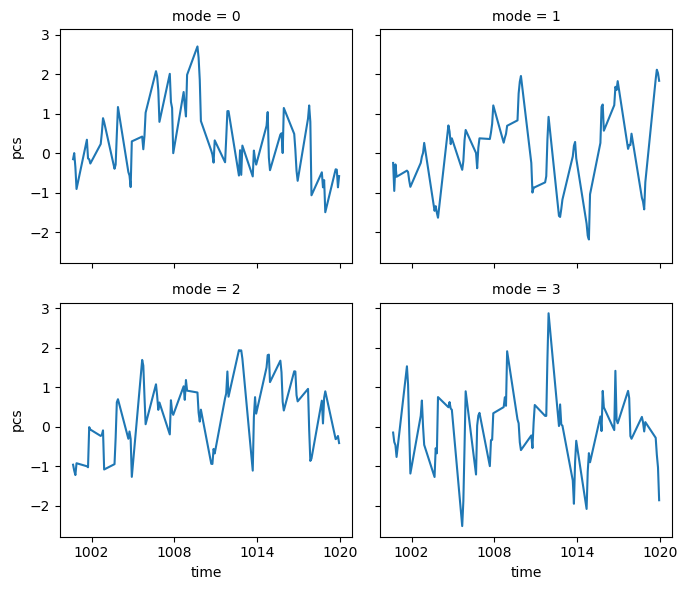

In [28]:
pc1.sel(time = slice('1000-01-16','1020-01-16' )).plot(col = 'mode', col_wrap = 2)

Text(0.5, 1.0, 'EOF3 expressed as correlation')

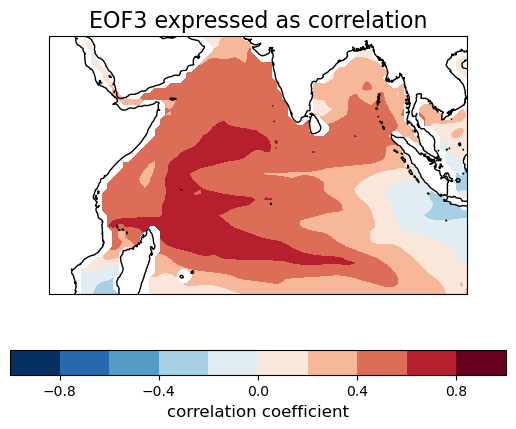

In [29]:
# Plot the leading EOF expressed as correlation in the Pacific domain.
clevs = np.linspace(-1, 1, 11)
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=190))
fill = eof1[0].plot.contourf(ax=ax, levels=clevs, cmap=plt.cm.RdBu_r,
                             add_colorbar=False, transform=ccrs.PlateCarree())
ax.coastlines()
#ax.add_feature(cfeature.LAND, facecolor='w', edgecolor='k')
cb = plt.colorbar(fill, orientation='horizontal')
cb.set_label('correlation coefficient', fontsize=12)
ax.set_title('EOF3 expressed as correlation', fontsize=16)

Text(0.5, 1.0, 'PC1 Time Series')

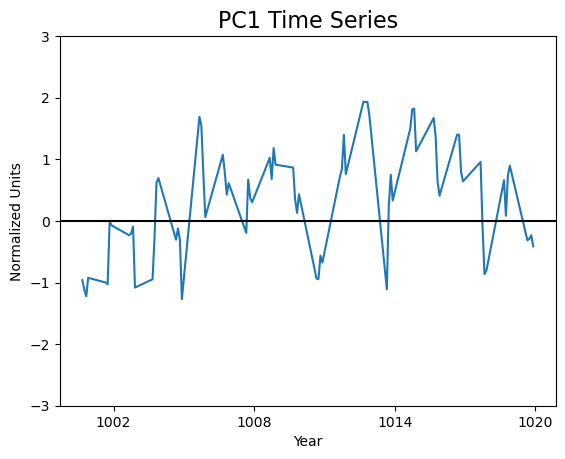

In [30]:
# Plot the leading PC time series.
plt.figure()
pc1[:, 2].sel(time = slice('1000-01-16','1020-01-16' )).plot()
ax = plt.gca()
ax.axhline(0, color='k')
ax.set_ylim(-3, 3)
ax.set_xlabel('Year')
ax.set_ylabel('Normalized Units')
ax.set_title('PC1 Time Series', fontsize=16)
#(3*PO_DMI).sel(time = slice('1000-01-16','1020-01-16' )).plot()


In [31]:
sst.coords

Coordinates:
  * xt_ocean   (xt_ocean) float64 -279.5 -278.5 -277.5 -276.5 ... 77.5 78.5 79.5
  * yt_ocean   (yt_ocean) float64 -77.88 -77.63 -77.38 ... 88.87 89.32 89.77
  * time       (time) object 0951-01-16 12:00:00 ... 1103-12-14 12:00:00
    latitude   (yt_ocean, xt_ocean) float32 dask.array<chunksize=(300, 360), meta=np.ndarray>
    longitude  (yt_ocean, xt_ocean) float32 dask.array<chunksize=(300, 360), meta=np.ndarray>

In [27]:
#load in PI control from g/data
PI = xr.open_dataset("/g/data/fs38/publications/CMIP6/CMIP/CSIRO-ARCCSS/ACCESS-CM2/piControl/r1i1p1f1/Omon/tos/gn/latest/tos_Omon_ACCESS-CM2_piControl_r1i1p1f1_gn_095001-144912.nc", chunks = {'time':12})

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/xarray/coding/times.py:153: SerializationWarning: Ambiguous reference date string: 950-01-01. The first value is assumed to be the year hence will be padded with zeros to remove the ambiguity (the padded reference date string is: 0950-01-01). To remove this message, remove the ambiguity by padding your reference date strings with zeros.
  warnings.warn(warning_msg, SerializationWarning)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/xarray/coding/times.py:710: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/xarray/core/indexing.py:524: SerializationWarning: Unable to decode time axis into full nump

In [28]:
PI_tos = PI.tos

In [29]:
PI_in1deg = PI.drop({'j', 'i'})

In [30]:
regridder_1deg_PI = xe.Regridder(PI_in1deg, ds_out, 'bilinear', periodic=True,
                                               filename="bilinear_tracer_weights_in1degACCESSCM2_out1deg.nc")

In [31]:
PI

<xarray.Dataset>
Dimensions:             (time: 6000, bnds: 2, j: 300, i: 360, vertices: 4)
Coordinates:
  * time                (time) object 0950-01-16 12:00:00 ... 1449-12-16 12:0...
  * j                   (j) int32 0 1 2 3 4 5 6 ... 293 294 295 296 297 298 299
  * i                   (i) int32 0 1 2 3 4 5 6 ... 353 354 355 356 357 358 359
    latitude            (j, i) float64 dask.array<chunksize=(300, 360), meta=np.ndarray>
    longitude           (j, i) float64 dask.array<chunksize=(300, 360), meta=np.ndarray>
Dimensions without coordinates: bnds, vertices
Data variables:
    time_bnds           (time, bnds) object dask.array<chunksize=(12, 2), meta=np.ndarray>
    vertices_latitude   (j, i, vertices) float64 dask.array<chunksize=(300, 360, 4), meta=np.ndarray>
    vertices_longitude  (j, i, vertices) float64 dask.array<chunksize=(300, 360, 4), meta=np.ndarray>
    tos                 (time, j, i) float32 dask.array<chunksize=(12, 300, 360), meta=np.ndarray>
Attributes: (12/47)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   0.0
    branch_time_in_parent:  346615.0
    creation_date:          2019-11-12T12:54:10Z
    ...                     ...
    variable_id:            tos
    variant_label:          r1i1p1f1
    version:                v20191112
    cmor_version:           3.4.0
    tracking_id:            hdl:21.14100/b646a44f-ff1b-42c6-bde9-241f28d2e33f
    license:                CMIP6 model data produced by CSIRO is licensed un...

In [32]:
%%time
PI_regridded = regridder_1deg(PI['tos'].chunk({'i': -1, 'j': -1}))
PI_regridded = PI_regridded.assign_coords({'x': ds_out.longitude[0, :], 'y': ds_out.latitude[:, 0]})
PI_regridded = PI_regridded.rename({'x': 'longitude', 'y': 'latitude'})
PI_regridded

CPU times: user 47.1 ms, sys: 3.47 ms, total: 50.5 ms
Wall time: 50.7 ms


/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/xesmf/frontend.py:597: UserWarning: Using dimensions ('j', 'i') from data variable tos as the horizontal dimensions for the regridding.
  warnings.warn(


<xarray.DataArray (time: 6000, latitude: 180, longitude: 360)>
dask.array<_regrid, shape=(6000, 180, 360), dtype=float32, chunksize=(12, 180, 360), chunktype=numpy.ndarray>
Coordinates:
  * time       (time) object 0950-01-16 12:00:00 ... 1449-12-16 12:00:00
  * longitude  (longitude) float64 -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * latitude   (latitude) float64 -89.5 -88.5 -87.5 -86.5 ... 87.5 88.5 89.5
Attributes:
    regrid_method:  bilinear

Now we can compare DMI in both PO and PI

In [33]:
PI_regridded = PI_regridded.compute()

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'facecolor'
  result = super().contourf(*args, **kwargs)
/local/e14/sm2435/tmp/ipykernel_1723893/3088674256.py:32: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for i, ax in enumerate(fg.axes.flat):
/local/e14/sm2435/tmp/ipykernel_1723893/3088674256.py:46: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for ax,title in zip(fg.axes.flatten(),titles):


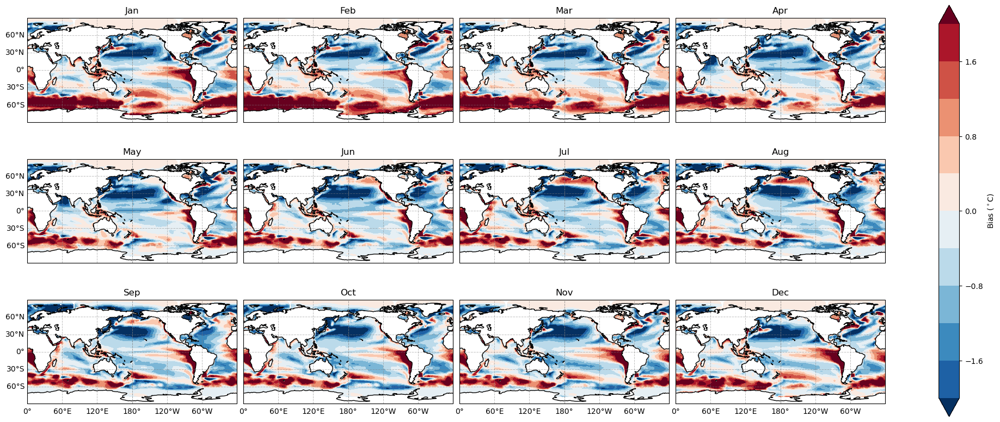

In [36]:
sst_bias(PI_regridded, OBS, freq = 'monthly', plot = True)

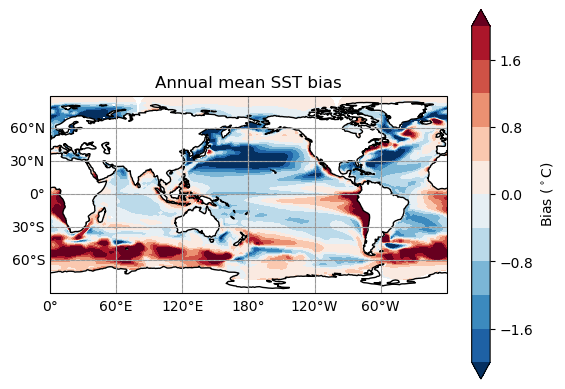

In [37]:
sst_bias(PI_regridded, OBS, freq = 'annual', plot = True)

In [39]:
#roll coords to be 0-360
PI_regridded = PI_regridded.assign_coords(longitude=(PI_regridded.longitude % 360)).roll(longitude=180, roll_coords=True)


In [40]:
PI_IO = PI_regridded.sel(latitude = slice(-25,25), longitude = slice(30,110))

In [41]:
PI_SSTA = (PI_IO.groupby('time.month') - PI_IO.groupby('time.month').mean('time')).drop('month')

In [42]:
PI_SSTA = PI_SSTA.sel(time = slice('0951-01-16','1103-12-16' ))

In [43]:
PI_SSTA_ASON = get_ason(PI_SSTA)

In [44]:
#perform EOF
# Create an EOF solver to do the EOF analysis. Square-root of cosine of
# latitude weights are applied before the computation of EOFs.
coslat = np.cos(np.deg2rad(PI_SSTA.coords['latitude'].values))
wgts = np.sqrt(coslat)[..., np.newaxis]
solver_PI = Eof(PI_SSTA_ASON, weights=wgts)

# Retrieve the leading EOF, expressed as the correlation between the leading
# PC time series and the input SST anomalies at each grid point, and the
# leading PC time series itself.
eof_PI = solver_PI.eofsAsCorrelation(neofs=4)
pc1_PI = solver_PI.pcs(npcs=4, pcscaling=1)
var_PI = solver_PI.varianceFraction()

ValueError: cannot find a time coordinate (must be called "time", have a numpy.datetime64 dtype, or have an attribute named "axis" with value "T")

In [ ]:
var_PI[0:4].plot.scatter()

In [ ]:
eof_PI.plot(col = 'mode', col_wrap = 2)

In [ ]:
pc1_PI.sel(time = slice('1000-01-16','1020-01-16' )).plot(col = 'mode', col_wrap = 2)

In [57]:
#plot a timseries for a random point for both PO and PI
def plot_latlon(ds1, ds2, lat, lon):
    if lon < 0:
        lon = 360+lon
    ds1 = ds1.sel(latitude = lat, longitude = lon, method = 'nearest')
    ds2 = ds2.sel(latitude = lat, longitude = lon, method = 'nearest')
    #make figure:
    fig,axes  = plt.subplots(1,1,figsize = (16, 4),sharex=True, sharey=True)

    #fig,axes  = plt.subplots(2,1,figsize = (10, 4),sharex=True, sharey=True)
    #axes = axes.ravel()

    ds1.sel(time = slice('0951-01-16','1104-01-16' )).groupby('time.year').mean('time').plot(ax = axes, c = 'tab:blue', label = 'Pace')
    ds2.sel(time = slice('0951-01-16','1104-01-16' )).groupby('time.year').mean('time').plot(ax = axes,c = 'tab:orange', label = 'ctrl')
    axes.legend()
    #axes[0].plot(ds1.sel(time = slice('0951-01-16','1104-01-16' )))
    #axes[1].plot(ds2.sel(time = slice('0951-01-16','1104-01-16' )))
    return fig

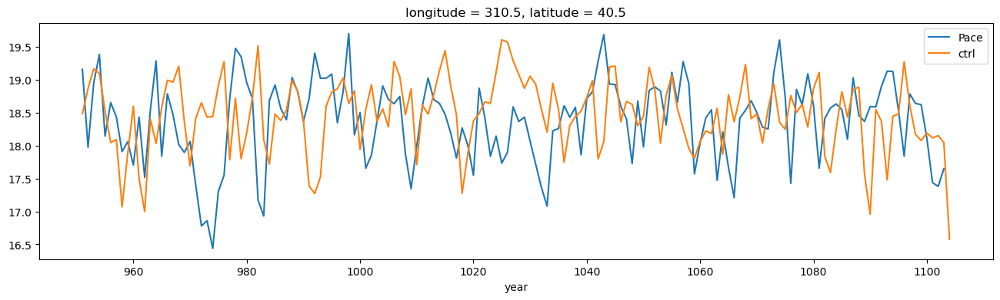

In [58]:
#North atlantic
a = plot_latlon(sst_regridded, PI_regridded, 40,-50)

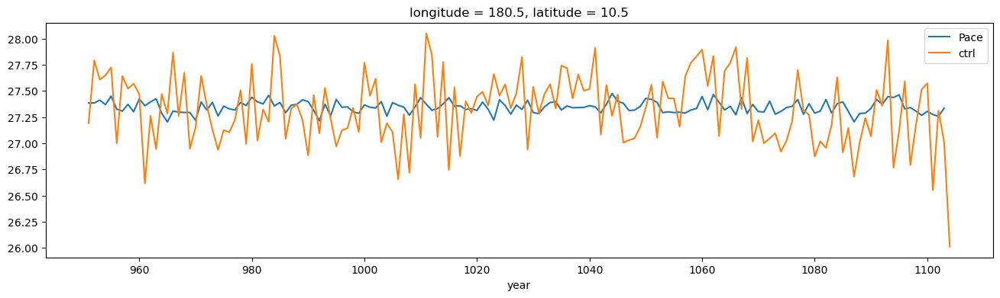

In [59]:
#pacific Ocean
a = plot_latlon(sst_regridded, PI_regridded, 10,180)

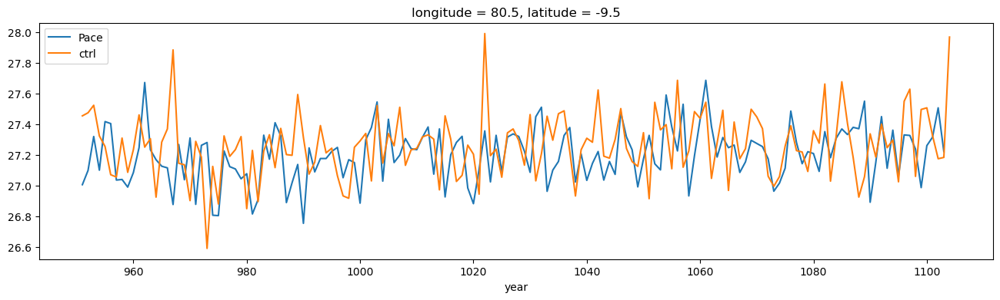

In [60]:
#Indian Oxcean
a = plot_latlon(sst_regridded, PI_regridded, -10,80)

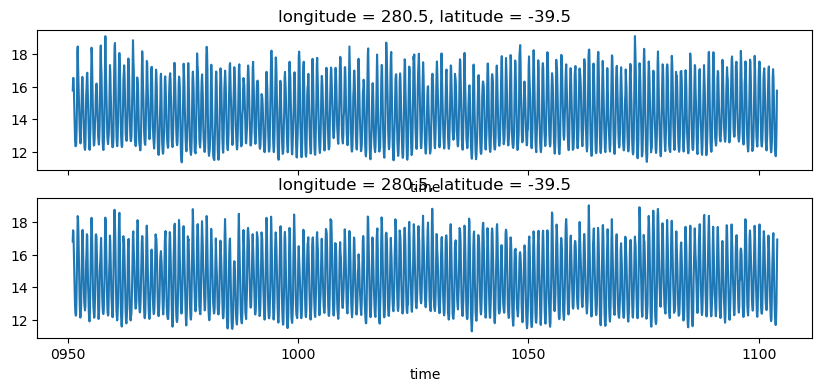

In [46]:
a = plot_latlon(sst_regridded, PI_regridded, -40,-80)

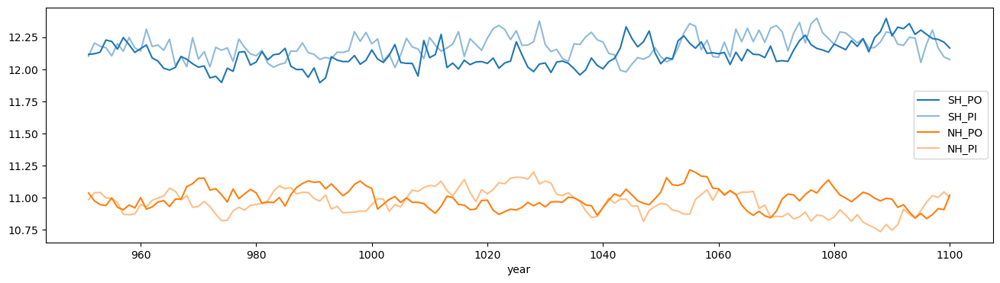

In [53]:
#plot southern hemisphere avg temp and see difference and if it drifts
SH_PO = sst_regridded.sel(latitude =slice(-90,-10)).mean(['latitude', 'longitude'])
SH_PI = PI_regridded.sel(latitude =slice(-90,-10)).mean(['latitude', 'longitude'])

NH_PO = sst_regridded.sel(latitude =slice(10,90)).mean(['latitude', 'longitude'])
NH_PI = PI_regridded.sel(latitude =slice(10,90)).mean(['latitude', 'longitude'])
    
fig,axes  = plt.subplots(1,1,figsize = (16, 4),sharex=True, sharey=True)
#axes = axes.ravel()

SH_PO.sel(time = slice('0951-01-16','1100-12-16' )).groupby('time.year').mean('time').plot(ax = axes, c = 'tab:blue', label = 'SH_PO')
SH_PI.sel(time = slice('0951-01-16','1100-12-16' )).groupby('time.year').mean('time').plot(ax = axes, c = 'tab:blue', label = 'SH_PI', alpha = 0.5)

NH_PO.sel(time = slice('0951-01-16','1100-12-16' )).groupby('time.year').mean('time').plot(ax = axes, c = 'tab:orange', label = 'NH_PO')
NH_PI.sel(time = slice('0951-01-16','1100-12-16' )).groupby('time.year').mean('time').plot(ax = axes, c = 'tab:orange', label = 'NH_PI', alpha = 0.5)
axes.legend()

In [123]:
sst_regridded.sel(latitude =slice(-90,0))

<xarray.DataArray (time: 1836, latitude: 90, longitude: 360)>
array([[[      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        ...,
        [28.1834  , 28.227987, 28.31573 , ..., 27.970987, 28.00465 ,
         28.118383],
        [28.328901, 28.429283, 28.53993 , ..., 28.137918, 28.197132,
         28.286022],
        [28.389664, 28.449251, 28.466354, ..., 28.227312, 28.30821 ,
         28.368649]],

       [[      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
...
        [26.62721 , 26.894442, 27.081577, ..., 26.043512, 26.1903  ,
         26.400799],
        [27.00868 , 27.233131, 27.384356, ..., 26.338636, 26.553984,
         26.782904],
        [27.300451, 27.456518, 27.58211 , ..., 26.850382, 26.988972,
         27.13611 ]],

       [[      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        ...,
        [27.094908, 27.276018, 27.40537 , ..., 26.821638, 26.930431,
         27.02243 ],
        [27.18515 , 27.255934, 27.35847 , ..., 27.040644, 27.144283,
         27.171648],
        [27.532795, 27.527397, 27.52535 , ..., 27.430376, 27.506495,
         27.54878 ]]], dtype=float32)
Coordinates:
  * time       (time) object 0951-01-16 12:00:00 ... 1103-12-14 12:00:00
  * longitude  (longitude) float64 0.5 1.5 2.5 3.5 ... 356.5 357.5 358.5 359.5
  * latitude   (latitude) float64 -89.5 -88.5 -87.5 -86.5 ... -2.5 -1.5 -0.5
Attributes:
    regrid_method:  bilinear

<xarray.DataArray (time: 1836, latitude: 180, longitude: 360)>
array([[[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [-1.734372 , -1.7341095, -1.7338464, ..., -1.7351527,
         -1.7348964, -1.7346342],
        [-1.7379409, -1.737705 , -1.7374692, ..., -1.738649 ,
         -1.7384129, -1.7381768],
        [-1.738916 , -1.7388375, -1.738759 , ..., -1.7391521,
         -1.7390733, -1.7389946]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
...
        [-1.6925201, -1.6930484, -1.6935645, ..., -1.6909019,
         -1.6914324, -1.6919812],
        [-1.690446 , -1.6904022, -1.6903567, ..., -1.6905724,
         -1.6905307, -1.6904887],
        [-1.7015574, -1.7014859, -1.7014169, ..., -1.7017883,
         -1.7017087, -1.7016317]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [-1.7018515, -1.7021834, -1.7024999, ..., -1.7007877,
         -1.7011467, -1.7015055],
        [-1.6983398, -1.698215 , -1.6980865, ..., -1.6986976,
         -1.6985805, -1.6984614],
        [-1.7078652, -1.7077649, -1.7076669, ..., -1.7081802,
         -1.7080729, -1.7079679]]], dtype=float32)
Coordinates:
  * time       (time) object 0951-01-16 12:00:00 ... 1103-12-14 12:00:00
  * longitude  (longitude) float64 0.5 1.5 2.5 3.5 ... 356.5 357.5 358.5 359.5
  * latitude   (latitude) float64 -89.5 -88.5 -87.5 -86.5 ... 87.5 88.5 89.5
Attributes:
    regrid_method:  bilinear

In [21]:
sst_regridded = sst_regridded.compute()
PI_regridded = PI_regridded.compute()

In [22]:
def NINO34(DS):
    DS = DS.groupby('time.month') - DS.groupby('time.month').mean('time')
    Nino34 = DS.sel(latitude=slice(-5, 5),longitude=slice(-170, -120)).mean(['latitude', 'longitude'])
    return Nino34

In [72]:
def dmi(DS):
    DS = DS.groupby('time.month') - DS.groupby('time.month').mean('time')
    WTIO = DS.sel(latitude=slice(-10, 10),longitude=slice(50, 70)).mean(['latitude', 'longitude'])
    SETIO = DS.sel(latitude=slice(-10, 0),longitude=slice(90, 110)).mean(['latitude', 'longitude'])
    DMI = WTIO-SETIO
    #resample so only using SON
    return DMI

In [24]:
sst_regridded = sst_regridded.chunk({'time':12})
PI_regridded = PI_regridded.chunk({'time':12})

In [25]:
sst_regridded

<xarray.DataArray (time: 1836, latitude: 180, longitude: 360)>
dask.array<xarray-<this-array>, shape=(1836, 180, 360), dtype=float32, chunksize=(12, 180, 360), chunktype=numpy.ndarray>
Coordinates:
  * time       (time) object 0951-01-16 12:00:00 ... 1103-12-14 12:00:00
  * longitude  (longitude) float64 -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * latitude   (latitude) float64 -89.5 -88.5 -87.5 -86.5 ... 87.5 88.5 89.5
Attributes:
    regrid_method:  bilinear

In [26]:
PI_DMI = dmi(PI_regridded)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/xarray/core/indexing.py:1379: PerformanceWarning: Slicing with an out-of-order index is generating 500 times more chunks
  return self.array[key]


In [73]:
PO_DMI = dmi(sst_regridded)

In [28]:
PI_N34 = NINO34(PI_regridded)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/xarray/core/indexing.py:1379: PerformanceWarning: Slicing with an out-of-order index is generating 500 times more chunks
  return self.array[key]


In [29]:
PO_N34 = NINO34(sst_regridded)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/xarray/core/indexing.py:1379: PerformanceWarning: Slicing with an out-of-order index is generating 153 times more chunks
  return self.array[key]


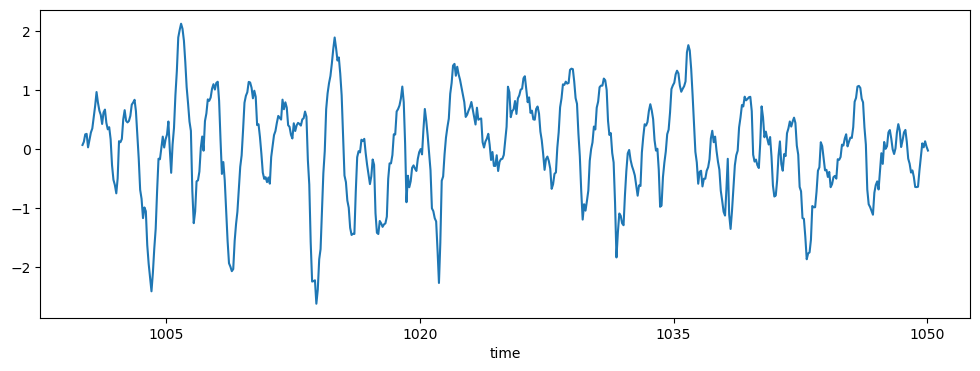

In [30]:
PI_N34.sel(time = slice('1000-01-16','1050-01-16' )).plot(figsize = (12,4))

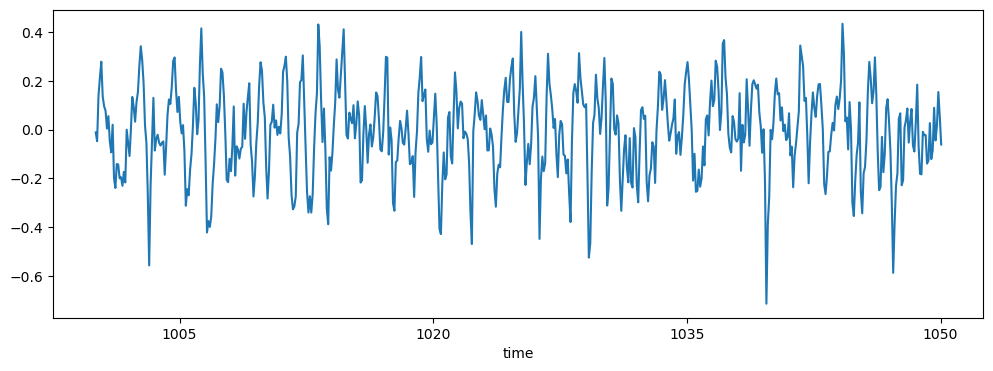

In [31]:
PO_N34.sel(time = slice('1000-01-16','1050-01-16' )).plot(figsize = (12,4))

In [32]:
PI_DMI

<xarray.DataArray (time: 6000)>
dask.array<sub, shape=(6000,), dtype=float32, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 0950-01-16 12:00:00 ... 1449-12-16 12:00:00
    month    (time) int64 1 2 3 4 5 6 7 8 9 10 11 ... 2 3 4 5 6 7 8 9 10 11 12

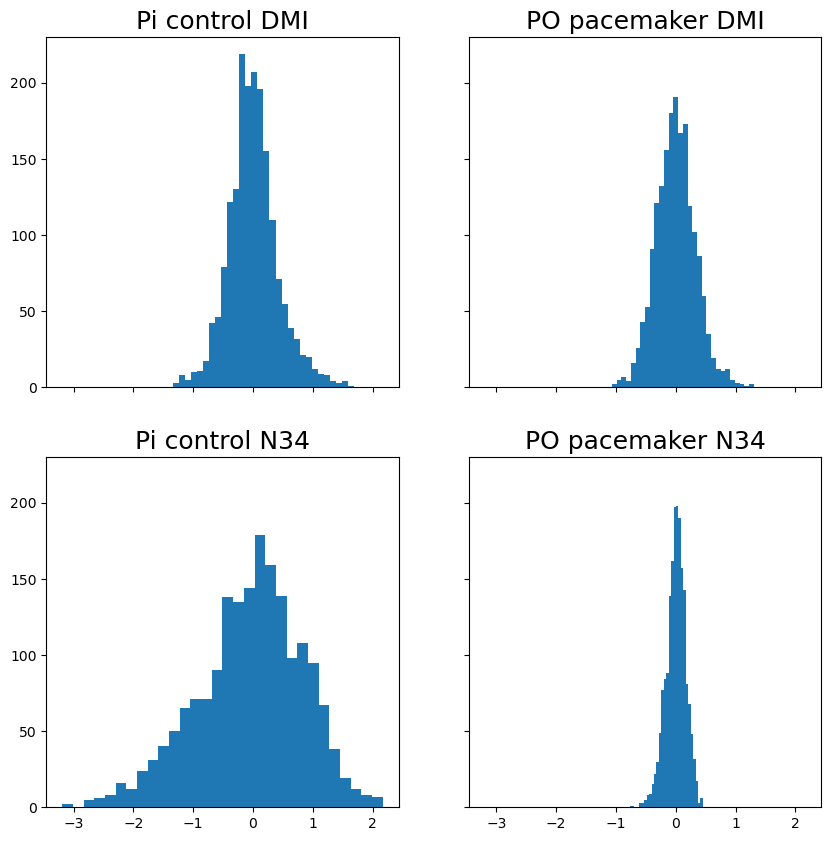

In [33]:
fig,axes  = plt.subplots(2,2,figsize = (10, 10),sharex=True, sharey=True)
axes = axes.ravel()
axes[0].hist(PI_DMI.sel(time = slice('0951-01-16','1104-01-16' )), bins = 30)
axes[0].set_title('Pi control DMI', fontsize=18);

axes[1].hist(PO_DMI, bins = 30)
axes[1].set_title('PO pacemaker DMI', fontsize=18);

axes[2].hist(PI_N34.sel(time = slice('0951-01-16','1104-01-16' )), bins = 30)
axes[2].set_title('Pi control N34', fontsize=18);

axes[3].hist(PO_N34, bins = 30)
axes[3].set_title('PO pacemaker N34', fontsize=18);


In [34]:
#get the SON(0) DMI and D(0)JF(1) Nino34 and look at strength of events

In [43]:
def get_son(ds):
    son=ds.sel(time=ds['time.season']=='SON')
    son=son.groupby('time.year').mean('time')
    return son

In [44]:
def get_djf(ds):
    djf = ds.resample(time="QS-DEC").mean()
    djf = djf.sel(time=djf['time.season']=='DJF')
    #convert time to year for ease of comparison with SON
    djf = djf.groupby('time.year').mean('time')
    return djf

In [37]:
PO_N34

<xarray.DataArray (time: 1836)>
dask.array<mean_agg-aggregate, shape=(1836,), dtype=float32, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 0951-01-16 12:00:00 ... 1103-12-14 12:00:00
    month    (time) int64 1 2 3 4 5 6 7 8 9 10 11 ... 2 3 4 5 6 7 8 9 10 11 12

In [38]:
PO_N34_djf = get_djf(PO_N34)

In [45]:
PI_N34_djf = get_djf(PI_N34.sel(time = slice('0951-01-16','1104-01-16' )))

In [40]:
PO_DMI_son = get_son(PO_DMI)

In [41]:
PI_DMI_son= get_son(PI_DMI.sel(time = slice('0951-01-16','1104-01-16' )))

In [42]:
#now plot the hitogram of the active season strength

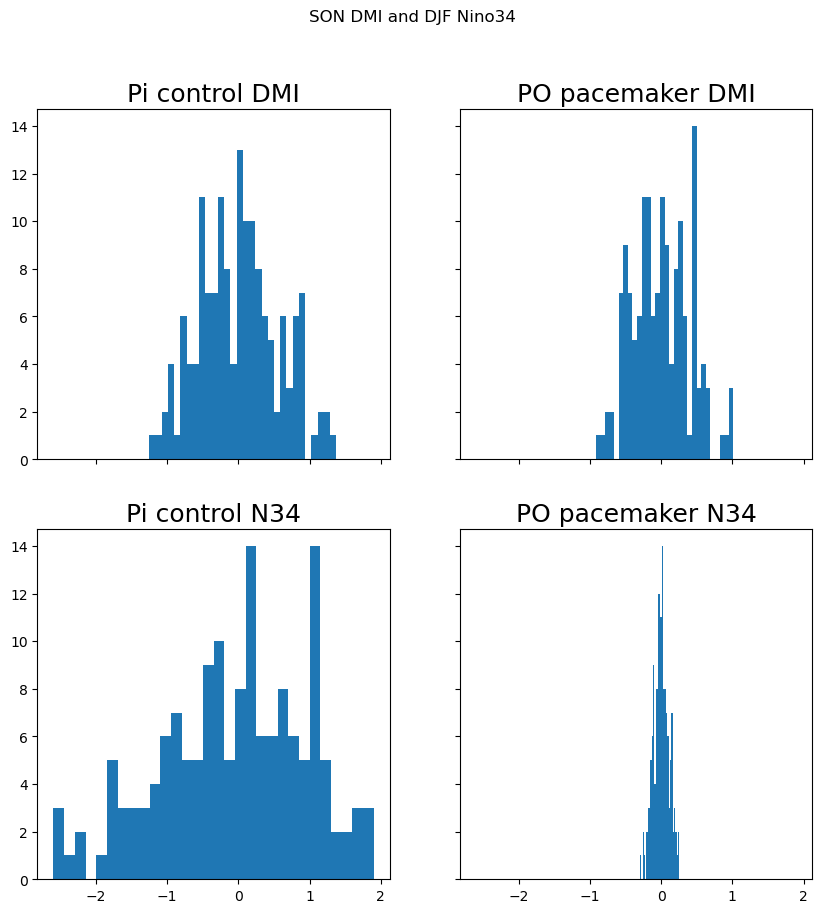

In [43]:
fig,axes  = plt.subplots(2,2,figsize = (10, 10),sharex=True, sharey=True)
plt.suptitle('SON DMI and DJF Nino34')
axes = axes.ravel()
axes[0].hist(PI_DMI_son, bins = 30)
axes[0].set_title('Pi control DMI', fontsize=18);

axes[1].hist(PO_DMI_son, bins = 30)
axes[1].set_title('PO pacemaker DMI', fontsize=18);

axes[2].hist(PI_N34_djf, bins = 30)
axes[2].set_title('Pi control N34', fontsize=18);

axes[3].hist(PO_N34_djf, bins = 30)
axes[3].set_title('PO pacemaker N34', fontsize=18);


In [71]:
#Use the above code to make a function to regrid future ACCESS-data

In [ ]:
def regrid_ocean(ds):
    #Define the grid we want
    ds_out = xe.util.grid_global(1, 1)
    ds_out = ds_out.drop({'lon_b', 'lat_b'})
    #rename the coords
    ds_out = ds_out.rename({'lon': 'longitude', 'lat': 'latitude'})


In [14]:
sst_regridded

<xarray.DataArray (time: 1836, latitude: 180, longitude: 360)>
array([[[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [-1.7486209, -1.7485799, -1.7485391, ..., -1.7487438,
         -1.7487034, -1.7486621],
        [-1.7451688, -1.7451558, -1.7451403, ..., -1.7451926,
         -1.7451872, -1.7451793],
        [-1.7404631, -1.7405026, -1.7405416, ..., -1.7403425,
         -1.740383 , -1.7404233]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
...
        [-1.7424974, -1.7422899, -1.7420797, ..., -1.7430807,
         -1.7429049, -1.7427025],
        [-1.7368797, -1.7368598, -1.736836 , ..., -1.7369151,
         -1.7369076, -1.7368957],
        [-1.7220154, -1.7220896, -1.722161 , ..., -1.7217747,
         -1.7218579, -1.7219381]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [-1.7481898, -1.7480695, -1.7479457, ..., -1.7485111,
         -1.7484204, -1.7483068],
        [-1.7427006, -1.742711 , -1.742718 , ..., -1.742648 ,
         -1.7426695, -1.7426869],
        [-1.7270569, -1.7271612, -1.7272624, ..., -1.7267247,
         -1.7268386, -1.7269492]]], dtype=float32)
Coordinates:
  * time       (time) object 0951-01-16 12:00:00 ... 1103-12-14 12:00:00
  * longitude  (longitude) float64 -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * latitude   (latitude) float64 -89.5 -88.5 -87.5 -86.5 ... 87.5 88.5 89.5
Attributes:
    regrid_method:  bilinear

In [ ]:
sst_regriddedO34(DS):
    Nino34 = DS.sel(lat=slice(-5, 5),lon=slice(-170, -120)).mean(['lat', 'lon'])
    return Nino34

In [ ]:
def dmi(DS):
    
    WTIO = DS.sel(latitude=slice(-10, 10),longitude=slice(50, 70)).mean(['latitude', 'longitude'])
    SETIO = DS.sel(latitude=slice(-10, 0),longitude=slice(90, 110)).mean(['latitude', 'longitude'])
    DMI = WTIO-SETIO
    #resample so only using SON
    return DMI

In [ ]:
DMI = dmi(sst_regridded)

In [ ]:
DMI.rolling(time = 50*12).std().plot.hist(bins = 30, alpha = 0.25, label = '50')
DMI.rolling(time = 40*12).std().plot.hist(bins = 30, alpha = 0.25, label = '40')
DMI.rolling(time = 30*12).std().plot.hist(bins = 30, alpha = 0.25, label = '30')

In [21]:
SON_SST = sst_regridded.sel(time=sst_regridded['time.season']=='SON').groupby('time.year').mean('time')

In [22]:
DMI_SON = dmi(SON_SST)

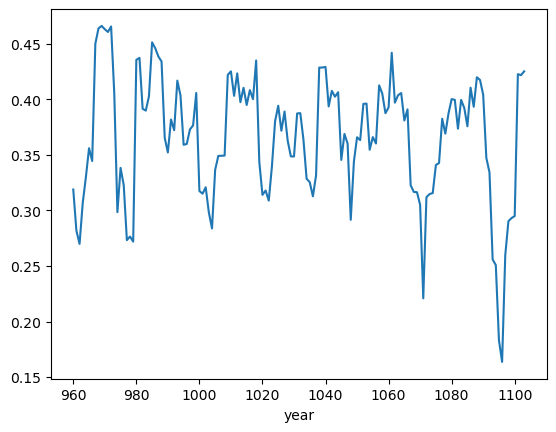

In [65]:
DMI_SON.rolling(year = 10).std().plot()

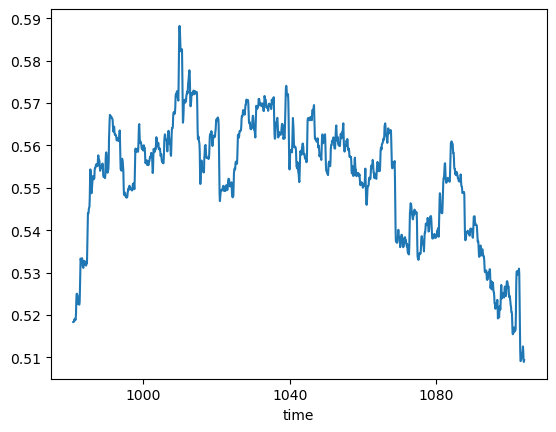

In [24]:
DMI.rolling(time = 12*30).std().plot()

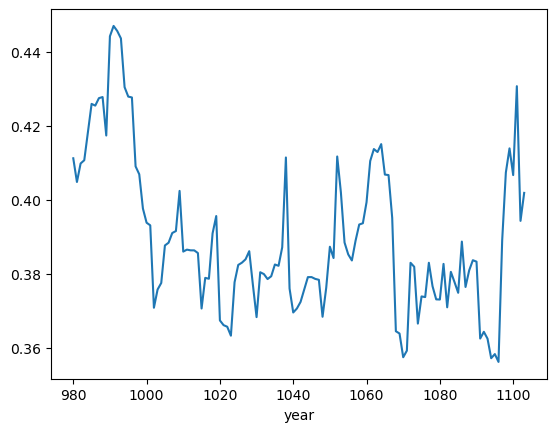

In [25]:
DMI.sel(time=DMI['time.season']=='SON').groupby('time.year').mean('time').rolling(year = 30).std().plot()

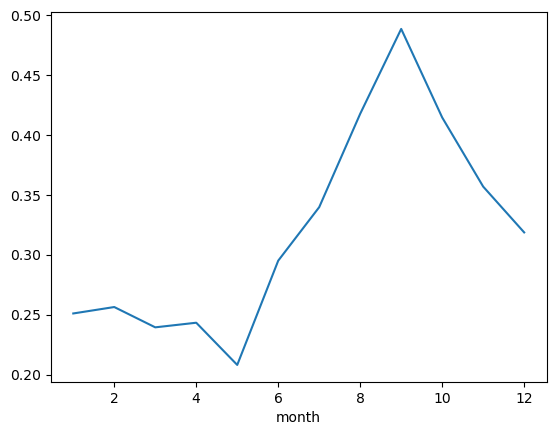

In [26]:
DMI.groupby('time.month').std('time').plot()

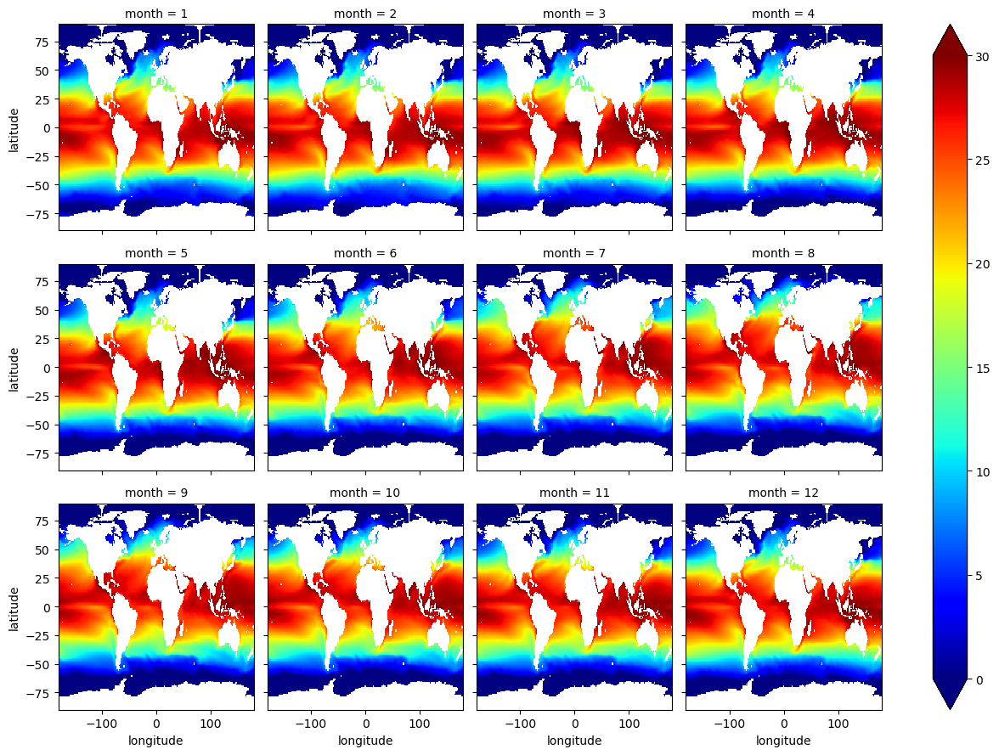

In [27]:
sst_regridded.groupby('time.month').mean('time').plot(col="month", col_wrap=4, vmin = 0, vmax = 30, cmap = 'jet')

In [28]:
tos = xr.open_dataset("/g/data/e14/sm2435/ACCESS_PIctrl/ACCESS-CM2.nc").tos

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/xarray/coding/times.py:152: SerializationWarning: Ambiguous reference date string: 950-01-01. The first value is assumed to be the year hence will be padded with zeros to remove the ambiguity (the padded reference date string is: 0950-01-01). To remove this message, remove the ambiguity by padding your reference date strings with zeros.
  warnings.warn(warning_msg, SerializationWarning)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/xarray/coding/times.py:716: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/xarray/core/indexing.py:529: SerializationWarning: Unable to decode time axis into full nump

In [29]:
PI_C = tos.groupby('time.month').mean('time').compute()

In [30]:
PO_C = sst_regridded.groupby('time.month').mean('time').compute()

In [35]:
PI_C = PI_C.rename({'lon': 'longitude', 'lat': 'latitude'})

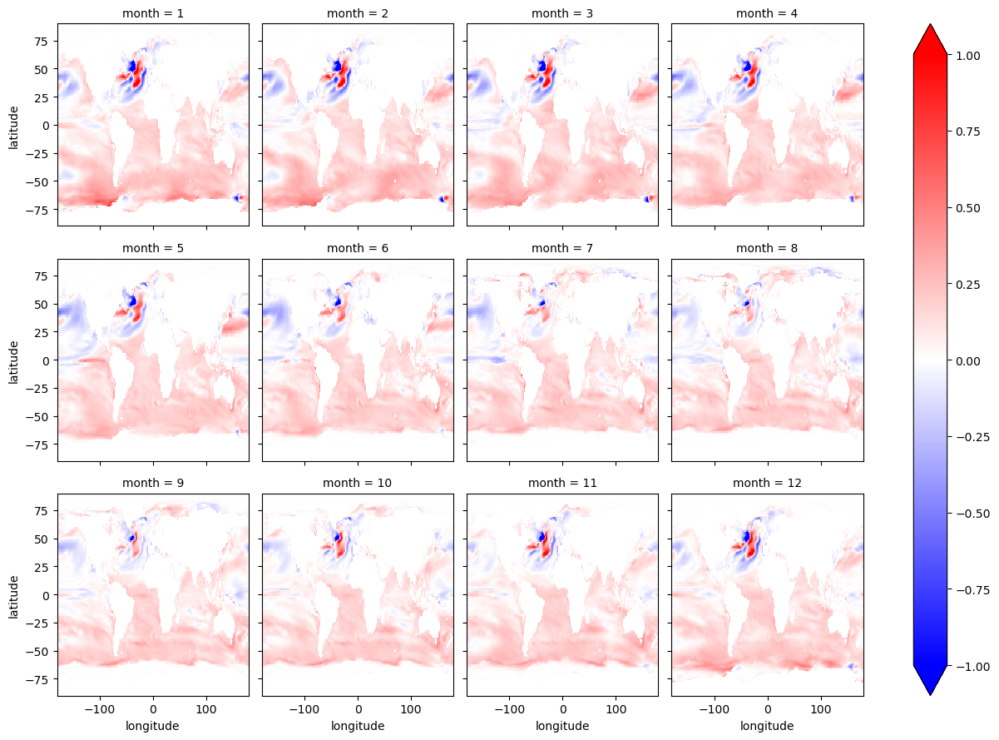

In [37]:
(PI_C - PO_C).plot(col="month", col_wrap=4, vmin = -1, vmax = 1, cmap = "bwr")

In [39]:
sst_regridded[0:120]

<xarray.DataArray (time: 120, latitude: 180, longitude: 360)>
array([[[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [-1.7486209, -1.7485799, -1.7485391, ..., -1.7487438,
         -1.7487034, -1.7486621],
        [-1.7451688, -1.7451558, -1.7451403, ..., -1.7451926,
         -1.7451872, -1.7451793],
        [-1.7404631, -1.7405026, -1.7405416, ..., -1.7403425,
         -1.740383 , -1.7404233]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
...
        [-1.7350498, -1.7350792, -1.7351025, ..., -1.7349365,
         -1.734974 , -1.7350148],
        [-1.729025 , -1.7290645, -1.7291007, ..., -1.7288892,
         -1.7289374, -1.7289827],
        [-1.7242427, -1.7242633, -1.7242837, ..., -1.7241777,
         -1.7241998, -1.7242215]],

       [[       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        [       nan,        nan,        nan, ...,        nan,
                nan,        nan],
        ...,
        [-1.7390023, -1.738925 , -1.7388471, ..., -1.7392672,
         -1.7391533, -1.7390786],
        [-1.7327161, -1.7327603, -1.7328041, ..., -1.7325794,
         -1.7326257, -1.7326713],
        [-1.7299684, -1.7300001, -1.7300316, ..., -1.7298712,
         -1.7299039, -1.7299364]]], dtype=float32)
Coordinates:
  * time       (time) object 0951-01-16 12:00:00 ... 0960-12-16 12:00:00
  * longitude  (longitude) float64 -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * latitude   (latitude) float64 -89.5 -88.5 -87.5 -86.5 ... 87.5 88.5 89.5
Attributes:
    regrid_method:  bilinear

In [70]:
DMI[0]

<xarray.DataArray ()>
array(-0.7636299, dtype=float32)
Coordinates:
    time     object 0951-01-16 12:00:00

In [87]:
std_dev=[]
for i in range(0,123,1):
    start = i*12
    end = start + 360
    arr = DMI[start:end].std('time')
    #std_dev.append(arr)
    #print(DMI[start].dt.year)
    da = xr.DataArray(
        data=arr,

        dims=None,

        coords=dict(
            time=950+i,
        ),

        attrs=dict(

            description="standard deviation DMI for 10 year window",

            units="degC",

        ),

    )
    if i ==0:
        da1 =da
    if i >0:
        da1 = xr.concat([da1, da], dim = 'time')

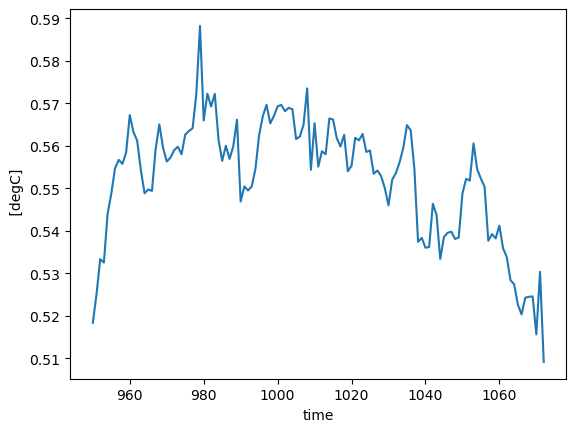

In [84]:
da1.plot()

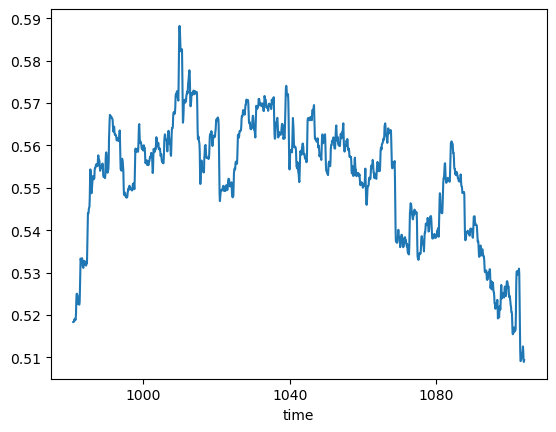

In [72]:
DMI.rolling(time = 12*30).std().plot()

In [88]:
for i in range(0,123,1):
    start = i*12
    end = start + 360
    arr = sst_regridded[start:end].std('time')
    #std_dev.append(arr)
    #print(DMI[start].dt.year)
    da = xr.DataArray(
        data=arr,

        dims=["Lon", "lat"],

        coords=dict(
            time=950+i,
        ),

        attrs=dict(

            description="standard deviation DMI for 10 year window",

            units="degC",

        ),

    )
    if i ==0:
        da2 =da
    if i >0:
        da2 = xr.concat([da2, da], dim = 'time')

In [107]:
high = da1.where(da1>0.55, drop = True)

In [108]:
low = da1.where(da1<0.55, drop = True)

In [109]:
da3 = da2.where(da2.time == high.time, drop = True)

In [110]:
da4 = da2.where(da2.time == low.time, drop = True)

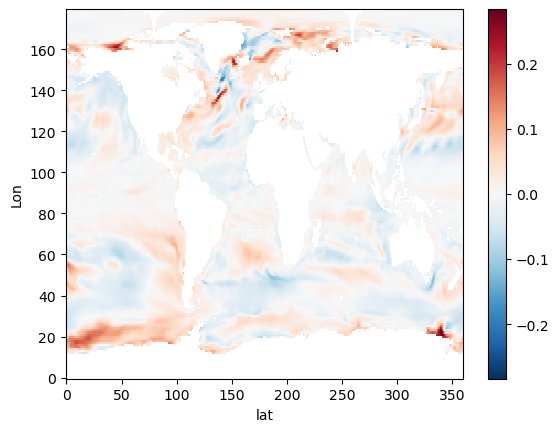

In [112]:
(da4.mean('time') - da3.mean('time')).plot()

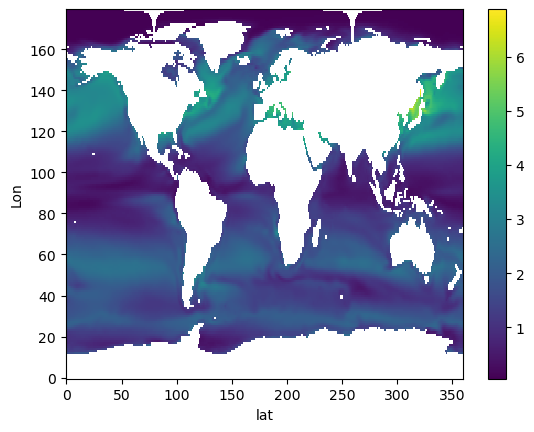

In [93]:
da2.mean('time').plot()

In [44]:
(tos.groupby('time.month').mean('time') - sst_regridded.groupby('time.month').mean('time')).plot(col="month", col_wrap=4, vmin = 0, vmax = 30, cmap = 'jet')

MemoryError: Unable to allocate 188. GiB for an array with shape (12, 180, 360, 180, 360) and data type float32

In [ ]:
(tos. - sst_regridded)

In [18]:
sst_regridded.sel(latitude=slice(-10, 10),longitude=slice(50, 70))

<xarray.DataArray (time: 1836, latitude: 20, longitude: 20)>
array([[[28.37292 , 28.288927, 28.050022, ..., 27.97154 , 27.982418,
         28.019224],
        [28.549078, 28.385408, 28.219856, ..., 28.0924  , 28.024933,
         28.037607],
        [28.554083, 28.472628, 28.450016, ..., 28.266394, 28.192585,
         28.205671],
        ...,
        [      nan, 26.39291 , 26.650974, ..., 28.207682, 28.36594 ,
         28.515966],
        [      nan, 26.026485, 26.460169, ..., 27.974638, 28.11465 ,
         28.286144],
        [      nan,       nan, 26.144407, ..., 27.808548, 27.929401,
         28.086557]],

       [[28.32992 , 28.32424 , 28.245829, ..., 28.19743 , 28.174887,
         28.16064 ],
        [28.543839, 28.304592, 28.222025, ..., 27.989006, 28.101898,
         28.236464],
        [28.65175 , 28.424492, 28.240702, ..., 27.921608, 28.061424,
         28.237272],
...
        [      nan, 27.034733, 27.060255, ..., 28.857077, 28.929869,
         29.014526],
        [      nan, 27.07257 , 27.057629, ..., 28.83231 , 28.91988 ,
         29.017817],
        [      nan,       nan, 27.124899, ..., 28.728342, 28.863758,
         28.974825]],

       [[27.444103, 27.382729, 27.296396, ..., 26.526579, 26.694233,
         26.888884],
        [27.621225, 27.573254, 27.544184, ..., 27.150827, 27.32264 ,
         27.423544],
        [27.740261, 27.70675 , 27.68902 , ..., 27.63587 , 27.654716,
         27.62101 ],
        ...,
        [      nan, 26.343468, 26.736902, ..., 28.483496, 28.613716,
         28.749687],
        [      nan, 26.224794, 26.484951, ..., 28.329739, 28.486359,
         28.66606 ],
        [      nan,       nan, 26.247093, ..., 28.195538, 28.397633,
         28.599842]]], dtype=float32)
Coordinates:
  * time       (time) object 0951-01-16 12:00:00 ... 1103-12-14 12:00:00
  * longitude  (longitude) float64 50.5 51.5 52.5 53.5 ... 66.5 67.5 68.5 69.5
  * latitude   (latitude) float64 -9.5 -8.5 -7.5 -6.5 -5.5 ... 6.5 7.5 8.5 9.5
Attributes:
    regrid_method:  bilinear

In [46]:
mask = xr.open_dataset("/g/data/w97/zg0866/pacemaker/global_sst_restoring_cm000_climatology_0951-1150.nc", decode_times=False)

In [50]:
mask.temp

<xarray.DataArray 'temp' (TIME: 12, DEPTH1_1: 1, GRID_Y_T: 300, GRID_X_T: 360)>
[1296000 values with dtype=float32]
Coordinates:
  * TIME      (TIME) float64 15.0 44.0 73.5 104.0 ... 257.0 287.5 318.5 349.0
  * DEPTH1_1  (DEPTH1_1) float64 0.0
  * GRID_Y_T  (GRID_Y_T) float64 -77.88 -77.63 -77.38 ... 88.87 89.32 89.77
  * GRID_X_T  (GRID_X_T) float64 -279.5 -278.5 -277.5 -276.5 ... 77.5 78.5 79.5
Attributes:
    long_name:    Climatology SST restoring
    units:        degrees K
    valid_range:  [-10. 500.]

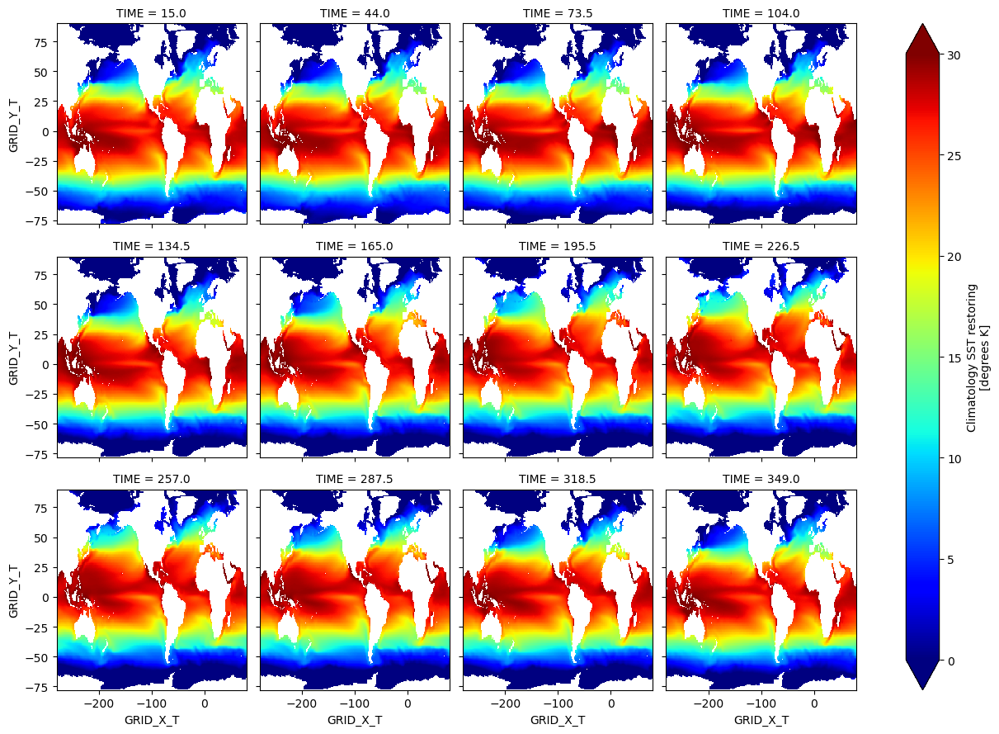

In [49]:
mask.temp.plot(col="TIME", col_wrap=4, vmin = 0, vmax = 30, cmap = 'jet')

In [2]:
mask_1 = xr.open_dataset("/g/data/w97/zg0866/pacemaker/sst_restore_mask_tropical_Pacific_Ocean_15S-15N_5degdampimg.nc", decode_times=False)

In [3]:
mask_1

<xarray.Dataset>
Dimensions:       (TIME: 12, DEPTH1_1: 1, GRID_Y_T: 300, GRID_X_T: 360)
Coordinates:
  * TIME          (TIME) float64 15.0 44.0 73.5 104.0 ... 287.5 318.5 349.0
  * DEPTH1_1      (DEPTH1_1) float64 0.0
  * GRID_Y_T      (GRID_Y_T) float64 -77.88 -77.63 -77.38 ... 88.87 89.32 89.77
  * GRID_X_T      (GRID_X_T) float64 -279.5 -278.5 -277.5 ... 77.5 78.5 79.5
Data variables:
    restore_mask  (TIME, DEPTH1_1, GRID_Y_T, GRID_X_T) float32 ...
Attributes:
    description:  Tropical Pacific Ocean restore mask 15S-15N plus 5deg dampi...
    history:      Created 17/12/22

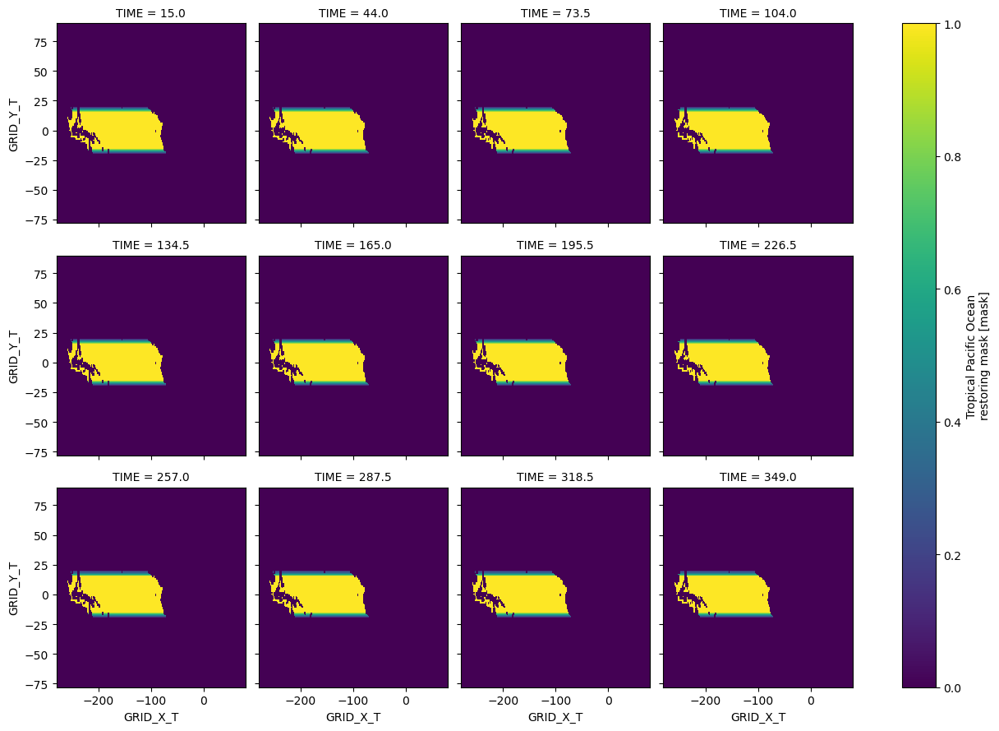

In [4]:
mask_1.restore_mask.plot(col="TIME", col_wrap=4)

In [5]:
#plot the mask
mask = mask_1.restore_mask.mean("TIME").rename({'GRID_X_T': 'longitude', 'GRID_Y_T': 'latitude'})

In [12]:
mask

<xarray.DataArray 'restore_mask' (DEPTH1_1: 1, latitude: 300, longitude: 360)>
array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]], dtype=float32)
Coordinates:
  * DEPTH1_1   (DEPTH1_1) float64 0.0
  * latitude   (latitude) float64 -77.88 -77.63 -77.38 ... 88.87 89.32 89.77
  * longitude  (longitude) float64 -279.5 -278.5 -277.5 ... 77.5 78.5 79.5

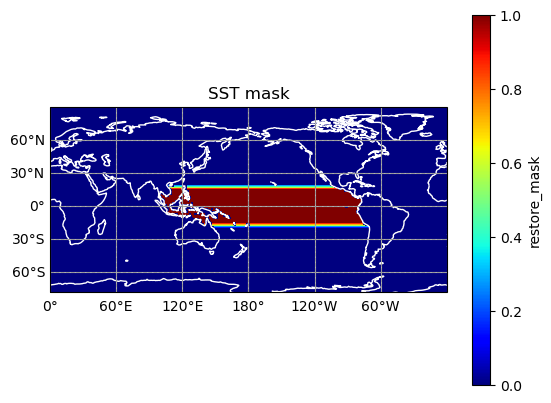

In [28]:
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))
mask[0].plot(ax=ax,
                   transform=ccrs.PlateCarree(), cmap = 'jet')
ax.set_title('SST mask')
ax.coastlines(color = 'w')
ax.gridlines()
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False

In [30]:
#load in WAP
wap = xr.open_dataset("/g/data/fs38/publications/CMIP6/CMIP/CSIRO-ARCCSS/ACCESS-CM2/piControl/r1i1p1f1/Amon/wap/gn/latest/wap_Amon_ACCESS-CM2_piControl_r1i1p1f1_gn_095001-104912.nc", chunks={'time':12, 'plev':19})

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/xarray/coding/times.py:152: SerializationWarning: Ambiguous reference date string: 950-01-01. The first value is assumed to be the year hence will be padded with zeros to remove the ambiguity (the padded reference date string is: 0950-01-01). To remove this message, remove the ambiguity by padding your reference date strings with zeros.
  warnings.warn(warning_msg, SerializationWarning)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/xarray/coding/times.py:716: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/xarray/core/indexing.py:529: SerializationWarning: Unable to decode time axis into full nump

In [31]:
ds_out1 = xe.util.grid_global(1, 1)


In [32]:
ds_out1

<xarray.Dataset>
Dimensions:  (y: 180, x: 360, y_b: 181, x_b: 361)
Coordinates:
    lon      (y, x) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
    lat      (y, x) float64 -89.5 -89.5 -89.5 -89.5 ... 89.5 89.5 89.5 89.5
    lon_b    (y_b, x_b) float64 -180.0 -179.0 -178.0 ... 178.0 179.0 180.0
    lat_b    (y_b, x_b) float64 -90.0 -90.0 -90.0 -90.0 ... 90.0 90.0 90.0 90.0
Dimensions without coordinates: y, x, y_b, x_b
Data variables:
    *empty*

In [33]:
#regrid data
a_regridder = xe.Regridder(wap, ds_out, 'bilinear', periodic=True)

In [34]:
a_regridder

xESMF Regridder 
Regridding algorithm:       bilinear 
Weight filename:            bilinear_144x192_180x360_peri.nc 
Reuse pre-computed weights? False 
Input grid shape:           (144, 192) 
Output grid shape:          (180, 360) 
Periodic in longitude?      True

In [35]:
wap_re = a_regridder(wap, keep_attrs=True)

In [37]:
ds_out1 = xr.Dataset(
    {
        "lat": (["lat"], np.arange(-90, 90, 1.0), {"units": "degrees_north"}),
        "lon": (["lon"], np.arange(-180, 180, 1.0), {"units": "degrees_east"}),
    }
)

In [38]:
regridder_new = xe.Regridder(wap, ds_out1, "bilinear", periodic=True)

In [39]:
wap_new = regridder_new(wap, keep_attrs=True)

In [98]:
#lets roll coords to 0-360


In [97]:
wap_new = wap_new.assign_coords(lon=(wap_new.lon % 360)).roll(lon=180, roll_coords=True)

In [40]:
wap_new.wap

<xarray.DataArray 'wap' (time: 1200, plev: 19, lat: 180, lon: 360)>
dask.array<_regrid, shape=(1200, 19, 180, 360), dtype=float32, chunksize=(12, 19, 180, 360), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 0950-01-16 12:00:00 ... 1049-12-16 12:00:00
  * plev     (plev) float64 1e+05 9.25e+04 8.5e+04 7e+04 ... 1e+03 500.0 100.0
  * lat      (lat) float64 -90.0 -89.0 -88.0 -87.0 -86.0 ... 86.0 87.0 88.0 89.0
  * lon      (lon) float64 -180.0 -179.0 -178.0 -177.0 ... 177.0 178.0 179.0
Attributes:
    standard_name:  lagrangian_tendency_of_air_pressure
    long_name:      Omega (=dp/dt)
    comment:        Omega (vertical velocity in pressure coordinates, positiv...
    units:          Pa s-1
    cell_methods:   time: mean
    cell_measures:  area: areacella
    history:        2019-11-12T03:24:34Z altered by CMOR: replaced missing va...

CPU times: user 23min 36s, sys: 1min 12s, total: 24min 49s
Wall time: 7min 3s


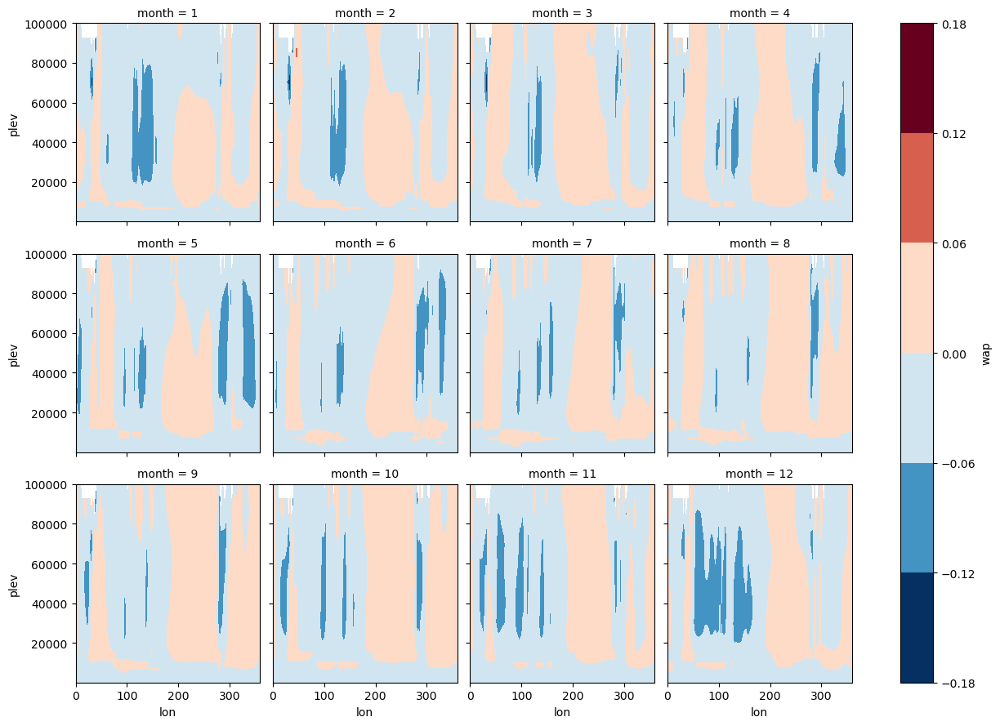

In [99]:
%%time
wap_new['wap'].sel(lat = slice(-5,5)).mean('lat').groupby('time.month').mean('time').plot.contourf(col = 'month', col_wrap = 4)

In [ ]:
#get EL NINO only times from wap_new


In [41]:
PI_N34.std().values

array(0.86740965, dtype=float32)

In [47]:
EN_TS = PI_N34.where(PI_N34>PI_N34_djf.std(), drop = True)

In [101]:
EN_WAP = wap_new.wap.where(wap_new.wap.time == EN_TS.time, drop = True)

In [102]:
EN_WAP

<xarray.DataArray 'wap' (time: 119, plev: 19, lat: 180, lon: 360)>
dask.array<where, shape=(119, 19, 180, 360), dtype=float32, chunksize=(10, 19, 180, 360), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 0955-11-16 00:00:00 ... 1046-01-16 12:00:00
  * plev     (plev) float64 1e+05 9.25e+04 8.5e+04 7e+04 ... 1e+03 500.0 100.0
  * lat      (lat) float64 -90.0 -89.0 -88.0 -87.0 -86.0 ... 86.0 87.0 88.0 89.0
  * lon      (lon) float64 0.0 1.0 2.0 3.0 4.0 ... 355.0 356.0 357.0 358.0 359.0
    month    (time) int64 11 12 1 3 4 5 6 7 9 10 11 ... 5 8 9 10 11 12 1 11 12 1
Attributes:
    standard_name:  lagrangian_tendency_of_air_pressure
    long_name:      Omega (=dp/dt)
    comment:        Omega (vertical velocity in pressure coordinates, positiv...
    units:          Pa s-1
    cell_methods:   time: mean
    cell_measures:  area: areacella
    history:        2019-11-12T03:24:34Z altered by CMOR: replaced missing va...

/local/e14/sm2435/tmp/ipykernel_2405435/876950949.py:13: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


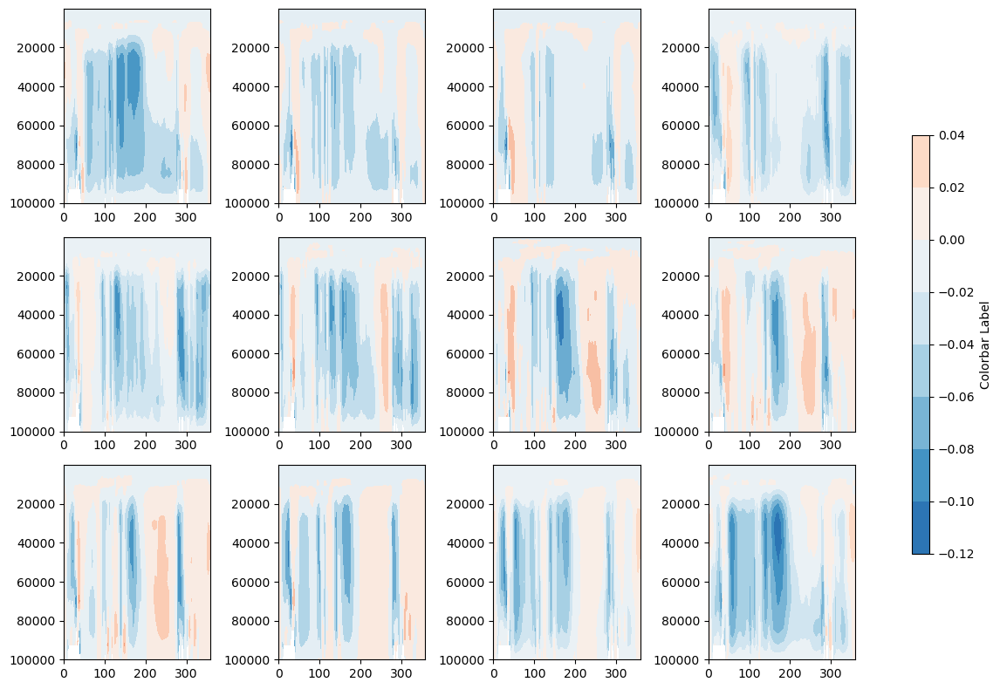

In [103]:
fig, ax = plt.subplots(nrows = 3, ncols = 4, figsize = (10,8))
axs = ax.flatten()
for i in range(0,12,1):
    contour = axs[i].contourf(EN_WAP.lon, EN_WAP.plev, EN_WAP.sel(lat = slice(-5,5)).mean('lat').groupby('time.month').mean('time').sel(month =1+i), cmap = 'RdBu_r', vmin = -0.15, vmax = 0.15)
    
    
    # Reverse the y-axis
    axs[i].set_ylim(axs[i].get_ylim()[::-1])
# Add colorbar to plot
cbar_ax = fig.add_axes([1.05, 0.2, 0.02, 0.6])  # [left, bottom, width, height]
cbar = fig.colorbar(contour, cax=cbar_ax)
cbar.set_label('Colorbar Label')
fig.tight_layout()

In [73]:
EN_WAP.sel(lat = slice(-5,5)).mean('lat').groupby('time.month').mean('time').sel(month =12)

<xarray.DataArray 'wap' (plev: 19, lon: 360)>
dask.array<getitem, shape=(19, 360), dtype=float32, chunksize=(19, 360), chunktype=numpy.ndarray>
Coordinates:
  * plev     (plev) float64 1e+05 9.25e+04 8.5e+04 7e+04 ... 1e+03 500.0 100.0
  * lon      (lon) float64 -180.0 -179.0 -178.0 -177.0 ... 177.0 178.0 179.0
    month    int64 12

/local/e14/sm2435/tmp/ipykernel_2405435/2799124466.py:2: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for ax in fig.axes.flat:


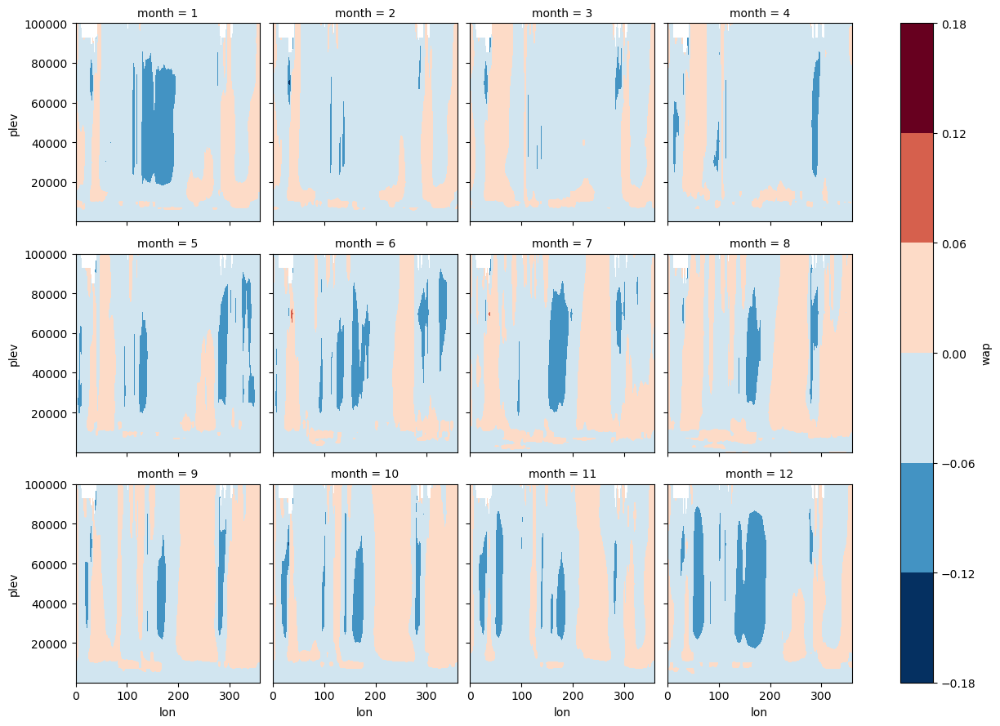

In [105]:
fig = EN_WAP.reindex(plev = EN_WAP.plev[::-1]).sel(lat = slice(-5,5)).mean('lat').groupby('time.month').mean('time').plot.contourf(col = 'month', col_wrap = 4)
for ax in fig.axes.flat:
        ax.set_ylim(ax.get_ylim()[::-1])

In [67]:
EN_WAP

<xarray.DataArray 'wap' (time: 119, plev: 19, lat: 180, lon: 360)>
dask.array<where, shape=(119, 19, 180, 360), dtype=float32, chunksize=(10, 19, 180, 360), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 0955-11-16 00:00:00 ... 1046-01-16 12:00:00
  * plev     (plev) float64 1e+05 9.25e+04 8.5e+04 7e+04 ... 1e+03 500.0 100.0
  * lat      (lat) float64 -90.0 -89.0 -88.0 -87.0 -86.0 ... 86.0 87.0 88.0 89.0
  * lon      (lon) float64 -180.0 -179.0 -178.0 -177.0 ... 177.0 178.0 179.0
    month    (time) int64 11 12 1 3 4 5 6 7 9 10 11 ... 5 8 9 10 11 12 1 11 12 1
Attributes:
    standard_name:  lagrangian_tendency_of_air_pressure
    long_name:      Omega (=dp/dt)
    comment:        Omega (vertical velocity in pressure coordinates, positiv...
    units:          Pa s-1
    cell_methods:   time: mean
    cell_measures:  area: areacella
    history:        2019-11-12T03:24:34Z altered by CMOR: replaced missing va...